In [1]:
#%% Import libraries
import numpy as np
import numpy.matlib as mt
from netCDF4 import Dataset
import scipy.io as sio
from scipy import interpolate
from scipy.interpolate import interp1d
import scipy as scp
#import calendar
import os
import calendar
import sys
import xarray as xr
import matplotlib.pyplot as plt
import cartopy.crs as ccrs
import pandas as pd

### check to make this compatible for all esms (drop cesm from name)
from getconstants_pressure_LAMACLIMA import getconstants_pressure_CESM

#from timeit import default_timer as timer
#import matplotlib.pyplot as plt    
import datetime as dt

import matplotlib as mpl
import mplotutils as mpu

In [2]:
# Input information 
# obtain the constants
model='cesm'
lsm_data_CESM = 'landmask_cesm.nc'# insert landseamask here
#os.chdir(r'/scratch/leuven/projects/lt1_2020_es_pilot/project_output/bclimate/vsc10333/')
area_mask = 'gridarea.nc' #insert area 
latnrs = np.arange(0,192) # minimal domain 
lonnrs = np.arange(0,288) 
# obtain the constants
latitude,longitude,lsm,g,density_water,timestep,A_gridcell,L_N_gridcell,L_S_gridcell,L_EW_gridcell,gridcell = \
    getconstants_pressure_CESM(model,latnrs,lonnrs,lsm_data_CESM,area_mask)
#### Area
with xr.open_dataset(area_mask, decode_times=False) as input:
    area = (input.cell_area) #Pixel area (m2)
    
dg=111089.56 # length of 1 degree latitude [m]
Width_gridcell = gridcell*np.cos((latitude-gridcell)*np.pi/180)*dg/1000 # [km]
Height_gridcell = gridcell*dg/1000                                # [km]

#Accomodate coordinates to convert to xarray 
llon = list(longitude.flatten())
llat = list(latitude.flatten())
timetracking = 0        
coordinates = [llon, llat]
dimensions = ["lon", "lat"]


In [3]:
#Location of folders of the backtracking 
output_folder_FRST = r'C:/Users/sdeherto/OneDrive - Vrije Universiteit Brussel/phd/LAMACLIMA/wam_data/new/cesm/frst/' # insert output folder here
output_folder_CTL =r'C:/Users/sdeherto/OneDrive - Vrije Universiteit Brussel/phd/LAMACLIMA/wam_data/new/cesm/ctl/'  # insert output folder here
output_folder_CROP = r'C:/Users/sdeherto/OneDrive - Vrije Universiteit Brussel/phd/LAMACLIMA/wam_data/new/cesm/crop/'  # insert output folder here
output_folder_IRRIG =  r'C:/Users/sdeherto/OneDrive - Vrije Universiteit Brussel/phd/LAMACLIMA/wam_data/new/cesm/irr/'  # insert output folder here

output_folder_FRST_mpi = r'C:/Users/sdeherto/OneDrive - Vrije Universiteit Brussel/phd/LAMACLIMA/wam_data/new/mpiesm/frst/' # insert output folder here
output_folder_CTL_mpi =r'C:/Users/sdeherto/OneDrive - Vrije Universiteit Brussel/phd/LAMACLIMA/wam_data/new/mpiesm/ctl/'  # insert output folder here
output_folder_CROP_mpi = r'C:/Users/sdeherto/OneDrive - Vrije Universiteit Brussel/phd/LAMACLIMA/wam_data/new/mpiesm/crop/'  # insert output folder here
output_folder_IRRIG_mpi =  r'C:/Users/sdeherto/OneDrive - Vrije Universiteit Brussel/phd/LAMACLIMA/wam_data/new/mpiesm/irr/'  # insert output folder here

#output_folder_FRST_ec = r'C:/Users/sdeherto/OneDrive - Vrije Universiteit Brussel/phd/LAMACLIMA/wam_data/new/ecearth/frst/tracking/' # insert output folder here
output_folder_CTL_ec =r'C:/Users/sdeherto/OneDrive - Vrije Universiteit Brussel/phd/LAMACLIMA/wam_data/new/ecearth/ctl/'  # insert output folder here
output_folder_CROP_ec = r'C:/Users/sdeherto/OneDrive - Vrije Universiteit Brussel/phd/LAMACLIMA/wam_data/new/ecearth/crop/'  # insert output folder here

years = [130,160] #np.arange(2002,2007) #period run

years_other=[2145,2174]

fn_mask=r'C:/Users/sdeherto/OneDrive - Vrije Universiteit Brussel/phd/LAMACLIMA/wam_data/cesm/landmask_cesm.nc'
ds_mask = xr.open_dataset(fn_mask)
da_mask=ds_mask['landmask']


In [4]:
#function to read the data
def data_path(output,years,timetracking):
    #save_path = os.path.join(output, 'E_track_regional_full' + str(years[0]) + '-' + str(years[-1]) + '-timetracking' + str(timetracking)+'.npz')
    save_path1 = os.path.join(output, 'P_track_regional_scales_full' + str(years[0]) + '-' + str(years[-1]) + '-timetracking' + str(timetracking)+'.npz')
    #save_path2 = os.path.join(output, 'Hor_Fluxes_full-' + str(years[0]) + '-' + str(years[-1])+'.npz')    
    save_path2 = os.path.join(output, 'Hor_Fluxes_full-' + str(years[0]) + '-' + str(years[-1]) +'.npz')    
    return save_path1, save_path2

#%% READING THE DATA AND CALCULATING VALUES
########################################################
#Define the datapath forward tracking
datapath_CTL = data_path(output_folder_CTL,years,timetracking) 
datapath_FRST = data_path(output_folder_FRST,years,timetracking)
datapath_CROP = data_path(output_folder_CROP,years,timetracking)
datapath_IRRIG = data_path(output_folder_IRRIG,years,timetracking)

#Loading P and E results
loading_FRST1, loading_FRST2 = np.load(datapath_FRST[0]), np.load(datapath_FRST[1]) #
loading_CTL1, loading_CTL2 = np.load(datapath_CTL[0]),np.load(datapath_CTL[1])
loading_CROP1, loading_CROP2 = np.load(datapath_CROP[0]),np.load(datapath_CROP[1])
loading_IRRIG1, loading_IRRIG2 = np.load(datapath_IRRIG[0]),np.load(datapath_IRRIG[1])

datapath_CTL_mpi = data_path(output_folder_CTL_mpi,years_other,timetracking) 
datapath_FRST_mpi = data_path(output_folder_FRST_mpi,years_other,timetracking)
datapath_CROP_mpi = data_path(output_folder_CROP_mpi,years_other,timetracking)
datapath_IRRIG_mpi = data_path(output_folder_IRRIG_mpi,years_other,timetracking)

#Loading P and E results
loading_FRST1_mpi, loading_FRST2_mpi = np.load(datapath_FRST_mpi[0]), np.load(datapath_FRST_mpi[1]) #
loading_CTL1_mpi, loading_CTL2_mpi = np.load(datapath_CTL_mpi[0]),np.load(datapath_CTL_mpi[1])
loading_CROP1_mpi, loading_CROP2_mpi = np.load(datapath_CROP_mpi[0]),np.load(datapath_CROP_mpi[1])
loading_IRRIG1_mpi, loading_IRRIG2_mpi= np.load(datapath_IRRIG_mpi[0]),np.load(datapath_IRRIG_mpi[1])


datapath_CTL_ec = data_path(output_folder_CTL_ec,years_other,timetracking) 
#datapath_FRST_ec = data_path(output_folder_FRST_ec,years_other,timetracking)
datapath_CROP_ec = data_path(output_folder_CROP_ec,years_other,timetracking)

#Loading P and E results
#loading_FRST1_ec, loading_FRST2_ec = np.load(datapath_FRST_ec[0]), np.load(datapath_FRST_ec[1]) #
loading_CTL1_ec, loading_CTL2_ec = np.load(datapath_CTL_ec[0]),np.load(datapath_CTL_ec[1])
loading_CROP1_ec, loading_CROP2_ec = np.load(datapath_CROP_ec[0]),np.load(datapath_CROP_ec[1])





In [40]:
def read_vars_tracking(model,case,l1,l2,seas='none'):
    if model=='cesm':
        lsm_data_CESM = r'C:/Users/sdeherto/OneDrive - Vrije Universiteit Brussel/phd/LAMACLIMA/wam_data/cesm/landmask_cesm.nc'
        #os.chdir(r'/scratch/leuven/projects/lt1_2020_es_pilot/project_output/bclimate/vsc10333/')
        area_mask = 'gridarea.nc' #insert area 
        latnrs = np.arange(0,192) # minimal domain 
        lonnrs = np.arange(0,288) 
        # obtain the constants
        latitude,longitude,lsm,g,density_water,timestep,A_gridcell,L_N_gridcell,L_S_gridcell,L_EW_gridcell,gridcell = \
            getconstants_pressure_CESM(model,latnrs,lonnrs,lsm_data_CESM,area_mask)
        #### Area
        with xr.open_dataset(area_mask, decode_times=False) as input:
            area = (input.cell_area) #Pixel area (m2)
        #Accomodate coordinates to convert to xarray 
        llon = list(longitude.flatten())
        llat = list(latitude.flatten())
        timetracking = 0        
        coordinates = [llon, llat]
        dimensions = ["lon", "lat"]
        ds_mask = xr.open_dataset(lsm_data_CESM)
        da_mask=ds_mask['landmask']    
            
        dg=111089.56 # length of 1 degree latitude [m]
        Width_gridcell = gridcell*np.cos((latitude-gridcell)*np.pi/180)*dg/1000 # [km]
        Height_gridcell = gridcell*dg/1000   # [km]
        years=range(130,161)
        
    elif model=='mpiesm':
        lsm_data_CESM = r'C:/Users/sdeherto/OneDrive - Vrije Universiteit Brussel/phd/LAMACLIMA/wam_data/mpiesm/landmask_mpiesm.nc'# insert landseamask here

        #os.chdir(r'/scratch/leuven/projects/lt1_2020_es_pilot/project_output/bclimate/vsc10333/')
        area_mask =  r'C:/Users/sdeherto/OneDrive - Vrije Universiteit Brussel/phd/LAMACLIMA/wam_data/mpiesm/gridarea_mpiesm.nc' 
        latnrs = np.arange(0,96) # minimal domain 
        lonnrs = np.arange(0,192) 
        # obtain the constants
        latitude,longitude,lsm,g,density_water,timestep,A_gridcell,L_N_gridcell,L_S_gridcell,L_EW_gridcell,gridcell = \
            getconstants_pressure_CESM(model,latnrs,lonnrs,lsm_data_CESM,area_mask)
        #### Area
        with xr.open_dataset(area_mask, decode_times=False) as input:
            area = (input.cell_area) #Pixel area (m2)
        #Accomodate coordinates to convert to xarray 
        llon = list(longitude.flatten())
        llat = list(latitude.flatten())
        llat=llat[::-1]
        timetracking = 0        
        coordinates = [llon, llat]
        dimensions = ["lon", "lat"]
        ds_mask = xr.open_dataset(lsm_data_CESM)
        da_mask=ds_mask['landmask']
        da_mask=da_mask.reindex(lat=list(reversed(da_mask.lat)))
            
        dg=111089.56 # length of 1 degree latitude [m]
        Width_gridcell = gridcell*np.cos((latitude-gridcell)*np.pi/180)*dg/1000 # [km]
        Height_gridcell = gridcell*dg/1000                                # [km]
        years=range(2145,2175)
    
    elif model=='ecearth':
        lsm_data_CESM = r'C:/Users/sdeherto/OneDrive - Vrije Universiteit Brussel/phd/LAMACLIMA/wam_data/ecearth/landmask_ecearth.nc'# insert landseamask here

        #os.chdir(r'/scratch/leuven/projects/lt1_2020_es_pilot/project_output/bclimate/vsc10333/')
        area_mask =  r'C:/Users/sdeherto/OneDrive - Vrije Universiteit Brussel/phd/LAMACLIMA/wam_data/ecearth/gridarea_ecearth.nc' 
        latnrs = np.arange(0,256) # minimal domain
        lonnrs = np.arange(0,512)
        # obtain the constants
        latitude,longitude,lsm,g,density_water,timestep,A_gridcell,L_N_gridcell,L_S_gridcell,L_EW_gridcell,gridcell = \
            getconstants_pressure_CESM(model,latnrs,lonnrs,lsm_data_CESM,area_mask)
        #### Area
        with xr.open_dataset(area_mask, decode_times=False) as input:
            area = (input.cell_area) #Pixel area (m2)
        #Accomodate coordinates to convert to xarray 
        llon = list(longitude.flatten())
        llat = list(latitude.flatten())
        timetracking = 0        
        coordinates = [llon, llat]
        dimensions = ["lon", "lat"]
        ds_mask = xr.open_dataset(lsm_data_CESM)
        da_mask=ds_mask['landmask'].mean('time')
            
        dg=111089.56 # length of 1 degree latitude [m]
        Width_gridcell = gridcell*np.cos((latitude-gridcell)*np.pi/180)*dg/1000 # [km]
        Height_gridcell = gridcell*dg/1000   
        years=range(2145,2175)

    
    loading_FRST1=l1
    loading_FRST2=l2
    #Variables 
    #FRST

    P_track_FRST = loading_FRST1['P_track_per_year_per_month']
    E_FRST = loading_FRST1['E_per_year_per_month']
    P_FRST = loading_FRST1['P_per_year_per_month']
    Hor_E_flux_FRST = loading_FRST2['Fa_E_down_per_year_per_month'] + loading_FRST2['Fa_E_top_per_year_per_month']
    Hor_N_flux_FRST = loading_FRST2['Fa_N_down_per_year_per_month'] + loading_FRST2['Fa_N_top_per_year_per_month']

    #FRST

    E_FRST_133 = np.mean(E_FRST[:,:,:,:], axis = 0) #mean evaporation 
    E_FRST_133 = np.mean(E_FRST_133[:,:,:], axis = 0) #mean evaporation 
    E_flux_FRST = np.mean(Hor_E_flux_FRST[:,:,:,:], axis = 0)
    E_flux_FRST = np.mean(E_flux_FRST[:,:,:], axis = 0)
    N_flux_FRST = np.mean(Hor_N_flux_FRST[:,:,:,:], axis = 0)
    N_flux_FRST = np.mean(N_flux_FRST[:,:,:], axis = 0)

    #E_track_FRST_mam = (np.squeeze(np.mean(E_track_FRST[0:-1,2:5,:,:], axis = 0))) #seasonal calutation march, april, may
    #E_track_FRST_jja = (np.squeeze(np.mean(E_track_FRST[0:-1,5:8,:,:], axis = 0))) #june, july, august
    #E_track_FRST_son = (np.squeeze(np.mean(E_track_FRST[0:-1,8:11,:,:], axis = 0))) #september, october, november
    #E_track_FRST_def = (np.squeeze((np.mean(E_track_FRST[0:-1,0:2,:,:], axis = 0)+E_track_FRST[0:-1,11,:,:])/3)) #dec, jan, feb

    P_track_FRST_133 = np.mean(P_track_FRST[:,:,:,:], axis = 0)
    P_track_FRST_133 = np.mean(P_track_FRST_133[:,:,:], axis = 0)
    P_FRST_133 = np.mean(P_FRST[:,:,:,:], axis = 0) #mean precipitation  
    P_FRST_133 = np.mean(P_FRST_133[:,:,:], axis = 0)#mean precipitation  
    P_E_flux_FRST = np.mean(Hor_E_flux_FRST[1:,:,:,:], axis = 0)
    P_E_flux_FRST = np.mean(P_E_flux_FRST[:,:,:], axis = 0)
    P_N_flux_FRST = np.mean(Hor_N_flux_FRST[1:,:,:,:], axis = 0)
    P_N_flux_FRST = np.mean(P_N_flux_FRST[:,:,:], axis = 0)

    P_track_FRST_mam = np.mean(np.mean(P_track_FRST[0:-1,2:5,:,:], axis = 0),axis=0) #seasonal calutation march, april, may
    P_track_FRST_jja = np.mean(np.mean(P_track_FRST[0:-1,5:8,:,:], axis = 0),axis=0) #june, july, august
    P_track_FRST_son = np.mean(np.mean(P_track_FRST[0:-1,8:11,:,:], axis = 0),axis=0) #september, october, november
    P_track_FRST_djf = (np.sum(np.mean(P_track_FRST[0:-1,0:2,:,:],axis=0), axis = 0)+np.mean(P_track_FRST[0:-1,11,:,:],axis=0))/3 #dec, jan, feb

    E_FRST_jja = np.mean(np.mean(E_FRST[:,5:8,:,:], axis = 0),axis=0) #mean evaporation 
    E_FRST_djf = (np.sum(np.mean(E_FRST[0:-1,0:2,:,:],axis=0), axis = 0)+np.mean(E_FRST[0:-1,11,:,:],axis=0))/3 #dec, jan, feb
    P_FRST_jja = np.mean(np.mean(P_FRST[:,5:8,:,:], axis = 0),axis=0) #mean evaporation 
    P_FRST_djf = (np.sum(np.mean(P_FRST[0:-1,0:2,:,:],axis=0), axis = 0)+np.mean(P_FRST[0:-1,11,:,:],axis=0))/3 #dec, jan, feb

    E_flux_FRST_jja = np.mean(np.mean(Hor_E_flux_FRST[:,5:8,:,:], axis = 0),axis=0)
    N_flux_FRST_jja = np.mean(np.mean(Hor_N_flux_FRST[:,5:8,:,:], axis = 0),axis=0)
    
    E_flux_FRST_djf = np.mean(np.mean(Hor_E_flux_FRST[:,0:2,:,:], axis = 0),axis=0)+np.mean(np.mean(Hor_E_flux_FRST[:,11:,:,:], axis = 0),axis=0)
    N_flux_FRST_djf = np.mean(np.mean(Hor_N_flux_FRST[:,0:2,:,:], axis = 0),axis=0)+np.mean(np.mean(Hor_N_flux_FRST[:,11:,:,:], axis = 0),axis=0)
    #Transforming to XARRAY
    #FRST
    rho_r_total= P_track_FRST_133/P_FRST_133
    eps_r_total= P_track_FRST_133/E_FRST_133

    rho_r_total_jja= P_track_FRST_jja/P_FRST_jja
    eps_r_total_jja= P_track_FRST_jja/E_FRST_jja
    rho_r_total_djf= P_track_FRST_djf/P_FRST_djf
    eps_r_total_djf= P_track_FRST_djf/E_FRST_djf

    E_FRST = xr.DataArray(E_FRST_133, coords= [llat, llon], dims= ["lat", "lon"])
    P_track_FRST = xr.DataArray(P_track_FRST_133, coords= [llat, llon], dims= ["lat", "lon"])
    rho_r_FRST = xr.DataArray(rho_r_total, coords= [llat, llon], dims= ["lat", "lon"])
    eps_r_FRST = xr.DataArray(eps_r_total, coords= [llat, llon], dims= ["lat", "lon"])

    E_FRST_jja = xr.DataArray(E_FRST_jja, coords= [llat, llon], dims= ["lat", "lon"])
    P_track_FRST_jja = xr.DataArray(P_track_FRST_jja, coords= [llat, llon], dims= ["lat", "lon"])
    rho_r_FRST_jja = xr.DataArray(rho_r_total_jja, coords= [llat, llon], dims= ["lat", "lon"])
    eps_r_FRST_jja = xr.DataArray(eps_r_total_jja, coords= [llat, llon], dims= ["lat", "lon"])
    
    E_FRST_djf = xr.DataArray(E_FRST_djf, coords= [llat, llon], dims= ["lat", "lon"])
    P_track_FRST_djf = xr.DataArray(P_track_FRST_djf, coords= [llat, llon], dims= ["lat", "lon"])
    rho_r_FRST_djf = xr.DataArray(rho_r_total_djf, coords= [llat, llon], dims= ["lat", "lon"])
    eps_r_FRST_djf = xr.DataArray(eps_r_total_djf, coords= [llat, llon], dims= ["lat", "lon"])

    rho_r_FRST, da_mask = xr.align(rho_r_FRST, da_mask)
    rho_r_FRST=xr.where(da_mask==1,rho_r_FRST,np.nan)

    eps_r_FRST, da_mask = xr.align(eps_r_FRST, da_mask)
    eps_r_FRST=xr.where(da_mask==1,eps_r_FRST,np.nan)

    rho_r_FRST_jja, da_mask = xr.align(rho_r_FRST_jja, da_mask)
    rho_r_FRST_jja=xr.where(da_mask==1,rho_r_FRST_jja,np.nan)

    eps_r_FRST_jja, da_mask = xr.align(eps_r_FRST_jja, da_mask)
    eps_r_FRST_jja=xr.where(da_mask==1,eps_r_FRST_jja,np.nan)
    
    rho_r_FRST_djf, da_mask = xr.align(rho_r_FRST_djf, da_mask)
    rho_r_FRST_djf=xr.where(da_mask==1,rho_r_FRST_djf,np.nan)

    eps_r_FRST_djf, da_mask = xr.align(eps_r_FRST_djf, da_mask)
    eps_r_FRST_djf=xr.where(da_mask==1,eps_r_FRST_djf,np.nan)
    
    Fa_N_total_m2a=np.zeros_like(N_flux_FRST)
    Fa_E_total_m2a=np.zeros_like(E_flux_FRST)
    for i in range(len(latitude)):
        Fa_N_total_m2a[i,:]=(N_flux_FRST[i,:]/(0.5*(L_N_gridcell[i]+L_S_gridcell[i])))/len(years) #Annual average flux per unit width (m3/m/a)

    Fa_E_total_m2a = (E_flux_FRST / L_EW_gridcell)/len(years); # Annual average flux per unit width (m3/m/a)

    Fa_N_total_m2a_jja=np.zeros_like(N_flux_FRST)
    Fa_E_total_m2a_jja=np.zeros_like(E_flux_FRST)
    for i in range(len(latitude)):
        Fa_N_total_m2a_jja[i,:]=(N_flux_FRST_jja[i,:]/(0.5*(L_N_gridcell[i]+L_S_gridcell[i])))/len(years) #JJA average flux per unit width (m3/m/a)

    Fa_E_total_m2a_jja = (E_flux_FRST_jja / L_EW_gridcell)/len(years); # Annual average flux per unit width (m3/m/a)

    Fa_N_total_m2a_djf=np.zeros_like(N_flux_FRST)
    Fa_E_total_m2a_djf=np.zeros_like(E_flux_FRST)
    for i in range(len(latitude)):
        Fa_N_total_m2a_djf[i,:]=(N_flux_FRST_djf[i,:]/(0.5*(L_N_gridcell[i]+L_S_gridcell[i])))/len(years) #JJA average flux per unit width (m3/m/a)

    Fa_E_total_m2a_djf = (E_flux_FRST_djf / L_EW_gridcell)/len(years); # Annual average flux per unit width (m3/m/a)

    # Length scales! Watch out the ratio should be calculated with absolute fluxes
    Zonal_to_total_ratio = np.abs(E_flux_FRST) / (np.abs(E_flux_FRST) + np.abs(N_flux_FRST))
    Meridional_to_total_ratio = np.abs(N_flux_FRST) / (np.abs(E_flux_FRST) + np.abs(N_flux_FRST))
    Zonal_to_total_ratio_jja = np.abs(E_flux_FRST_jja) / (np.abs(E_flux_FRST_jja) + np.abs(N_flux_FRST_jja))
    Meridional_to_total_ratio_jja = np.abs(N_flux_FRST_jja) / (np.abs(E_flux_FRST_jja) + np.abs(N_flux_FRST_jja))
    Zonal_to_total_ratio_djf = np.abs(E_flux_FRST_djf) / (np.abs(E_flux_FRST_djf) + np.abs(N_flux_FRST_djf))
    Meridional_to_total_ratio_djf = np.abs(N_flux_FRST_djf) / (np.abs(E_flux_FRST_djf) + np.abs(N_flux_FRST_djf))

    delta_x_zonal = mt.repmat(Width_gridcell,len(longitude),1) #km
    delta_x_zonal=np.swapaxes(delta_x_zonal,0,1)
    delta_x_meridional = mt.repmat(Height_gridcell,len(latitude),len(longitude)) #km


    delta_x_FRST = Zonal_to_total_ratio * delta_x_zonal + Meridional_to_total_ratio * delta_x_meridional #km
    delta_x_FRST_jja = Zonal_to_total_ratio_jja * delta_x_zonal + Meridional_to_total_ratio_jja * delta_x_meridional #km
    delta_x_FRST_djf = Zonal_to_total_ratio_djf * delta_x_zonal + Meridional_to_total_ratio_djf * delta_x_meridional #km
    
    lambda_rho_FRST = delta_x_FRST / (scp.special.lambertw(np.exp(1/(rho_r_FRST-1))/(rho_r_FRST-1))+1/(1-rho_r_FRST)) #km
    lambda_eps_FRST = delta_x_FRST / (scp.special.lambertw(np.exp(1/(eps_r_FRST-1))/(eps_r_FRST-1))+1/(1-eps_r_FRST)) #km
    lambda_rho_FRST_jja = delta_x_FRST / (scp.special.lambertw(np.exp(1/(rho_r_FRST_jja-1))/(rho_r_FRST_jja-1))+1/(1-rho_r_FRST_jja)) #km
    lambda_eps_FRST_jja = delta_x_FRST / (scp.special.lambertw(np.exp(1/(eps_r_FRST_jja-1))/(eps_r_FRST_jja-1))+1/(1-eps_r_FRST_jja)) #km
    lambda_rho_FRST_djf = delta_x_FRST / (scp.special.lambertw(np.exp(1/(rho_r_FRST_djf-1))/(rho_r_FRST_djf-1))+1/(1-rho_r_FRST_djf)) #km
    lambda_eps_FRST_djf = delta_x_FRST / (scp.special.lambertw(np.exp(1/(eps_r_FRST_djf-1))/(eps_r_FRST_djf-1))+1/(1-eps_r_FRST_djf)) #km

   # if model=='ecearth':
   #     lambda_rho_FRST=np.mean(lambda_rho_FRST,axis=0)
   #     lambda_eps_FRST=np.mean(lambda_eps_FRST,axis=0)
   #     lambda_rho_FRST_jja=np.mean(lambda_rho_FRST_jja,axis=0)
   #     lambda_eps_FRST_jja=np.mean(lambda_eps_FRST_jja,axis=0)
   #     lambda_eps_FRST_djf=np.mean(lambda_eps_FRST_djf,axis=0)
        

    lambda_rho_FRST = xr.DataArray(np.real(lambda_rho_FRST), coords= [llat, llon], dims= ["lat", "lon"])
    lambda_eps_FRST = xr.DataArray(np.real(lambda_eps_FRST), coords= [llat, llon], dims= ["lat", "lon"])
    lambda_rho_FRST_jja = xr.DataArray(np.real(lambda_rho_FRST_jja), coords= [llat, llon], dims= ["lat", "lon"])
    lambda_eps_FRST_jja = xr.DataArray(np.real(lambda_eps_FRST_jja), coords= [llat, llon], dims= ["lat", "lon"])
    lambda_rho_FRST_djf = xr.DataArray(np.real(lambda_rho_FRST_djf), coords= [llat, llon], dims= ["lat", "lon"])
    lambda_eps_FRST_djf = xr.DataArray(np.real(lambda_eps_FRST_djf), coords= [llat, llon], dims= ["lat", "lon"])

    delta_x_FRST = xr.DataArray(np.real(delta_x_FRST), coords= [llat, llon], dims= ["lat", "lon"])
    ##use mean here to get rid of first dimesion of size 1
    if seas=='none':
        return rho_r_FRST,eps_r_FRST,lambda_rho_FRST,lambda_eps_FRST,delta_x_FRST
    elif seas=='jja':
        return rho_r_FRST_jja,eps_r_FRST_jja,lambda_rho_FRST_jja,lambda_eps_FRST_jja,delta_x_FRST
    elif seas=='djf':
        return rho_r_FRST_djf,eps_r_FRST_djf,lambda_rho_FRST_djf,lambda_eps_FRST_djf,delta_x_FRST
    

In [41]:
model='cesm'
rho_r_FRST,eps_r_FRST,lambda_rho_FRST,lambda_eps_FRST,delta_x_FRST=read_vars_tracking(model,'frst',loading_FRST1,loading_FRST2)
rho_r_CTL,eps_r_CTL,lambda_rho_CTL,lambda_eps_CTL,delta_x_CTL=read_vars_tracking(model,'ctl',loading_CTL1,loading_CTL2)
rho_r_CROP,eps_r_CROP,lambda_rho_CROP,lambda_eps_CROP,delta_x_CROP=read_vars_tracking(model,'crop',loading_CROP1,loading_CROP2)
rho_r_IRRIG,eps_r_IRRIG,lambda_rho_IRRIG,lambda_eps_IRRIG,delta_x_IRRIG=read_vars_tracking(model,'irr',loading_IRRIG1,loading_IRRIG2)

rho_r_FRST_jja,eps_r_FRST_jja,lambda_rho_FRST_jja,lambda_eps_FRST_jja,delta_x_FRST_jja=read_vars_tracking(model,'frst',loading_FRST1,loading_FRST2,seas='jja')
rho_r_CTL_jja,eps_r_CTL_jja,lambda_rho_CTL_jja,lambda_eps_CTL_jja,delta_x_CTL=read_vars_tracking(model,'ctl',loading_CTL1,loading_CTL2,seas='jja')
rho_r_CROP_jja,eps_r_CROP_jja,lambda_rho_CROP_jja,lambda_eps_CROP_jja,delta_x_CROP=read_vars_tracking(model,'crop',loading_CROP1,loading_CROP2,seas='jja')
rho_r_IRRIG_jja,eps_r_IRRIG_jja,lambda_rho_IRRIG_jja,lambda_eps_IRRIG_jja,delta_x_IRRIG=read_vars_tracking(model,'irr',loading_IRRIG1,loading_IRRIG2,seas='jja')

rho_r_FRST_djf,eps_r_FRST_djf,lambda_rho_FRST_djf,lambda_eps_FRST_djf,delta_x_FRST=read_vars_tracking(model,'frst',loading_FRST1,loading_FRST2,seas='djf')
rho_r_CTL_djf,eps_r_CTL_djf,lambda_rho_CTL_djf,lambda_eps_CTL_djf,delta_x_CTL=read_vars_tracking(model,'ctl',loading_CTL1,loading_CTL2,seas='djf')
rho_r_CROP_djf,eps_r_CROP_djf,lambda_rho_CROP_djf,lambda_eps_CROP_djf,delta_x_CROP=read_vars_tracking(model,'crop',loading_CROP1,loading_CROP2,seas='djf')
rho_r_IRRIG_djf,eps_r_IRRIG_djf,lambda_rho_IRRIG_djf,lambda_eps_IRRIG_djf,delta_x_IRRIG=read_vars_tracking(model,'irr',loading_IRRIG1,loading_IRRIG2,seas='djf')


In [42]:
model='mpiesm'
rho_r_FRST_mpi,eps_r_FRST_mpi,lambda_rho_FRST_mpi,lambda_eps_FRST_mpi,delta_x_FRST_mpi=read_vars_tracking(model,'frst',loading_FRST1_mpi,loading_FRST2_mpi)
rho_r_CTL_mpi,eps_r_CTL_mpi,lambda_rho_CTL_mpi,lambda_eps_CTL_mpi,delta_x_CTL_mpi=read_vars_tracking(model,'ctl',loading_CTL1_mpi,loading_CTL2_mpi)
rho_r_CROP_mpi,eps_r_CROP_mpi,lambda_rho_CROP_mpi,lambda_eps_CROP_mpi,delta_x_CROP_mpi=read_vars_tracking(model,'crop',loading_CROP1_mpi,loading_CROP2_mpi)
rho_r_IRRIG_mpi,eps_r_IRRIG_mpi,lambda_rho_IRRIG_mpi,lambda_eps_IRRIG_mpi,delta_x_IRRIG_mpi=read_vars_tracking(model,'irr',loading_IRRIG1_mpi,loading_IRRIG2_mpi)

rho_r_FRST_mpi_jja,eps_r_FRST_mpi_jja,lambda_rho_FRST_mpi_jja,lambda_eps_FRST_mpi_jja,delta_x_FRST_mpi_jja=read_vars_tracking(model,'frst',loading_FRST1_mpi,loading_FRST2_mpi,seas='jja')
rho_r_CTL_mpi_jja,eps_r_CTL_mpi_jja,lambda_rho_CTL_mpi_jja,lambda_eps_CTL_mpi_jja,delta_x_CTL=read_vars_tracking(model,'ctl',loading_CTL1_mpi,loading_CTL2_mpi,seas='jja')
rho_r_CROP_mpi_jja,eps_r_CROP_mpi_jja,lambda_rho_CROP_mpi_jja,lambda_eps_CROP_mpi_jja,delta_x_CROP=read_vars_tracking(model,'crop',loading_CROP1_mpi,loading_CROP2_mpi,seas='jja')
rho_r_IRRIG_mpi_jja,eps_r_IRRIG_mpi_jja,lambda_rho_IRRIG_mpi_jja,lambda_eps_IRRIG_mpi_jja,delta_x_IRRIG=read_vars_tracking(model,'irr',loading_IRRIG1_mpi,loading_IRRIG2_mpi,seas='jja')

rho_r_FRST_mpi_djf,eps_r_FRST_mpi_djf,lambda_rho_FRST_mpi_djf,lambda_eps_FRST_mpi_djf,delta_x_FRST=read_vars_tracking(model,'frst',loading_FRST1_mpi,loading_FRST2_mpi,seas='djf')
rho_r_CTL_mpi_djf,eps_r_CTL_mpi_djf,lambda_rho_CTL_mpi_djf,lambda_eps_CTL_mpi_djf,delta_x_CTL=read_vars_tracking(model,'ctl',loading_CTL1_mpi,loading_CTL2_mpi,seas='djf')
rho_r_CROP_mpi_djf,eps_r_CROP_mpi_djf,lambda_rho_CROP_mpi_djf,lambda_eps_CROP_mpi_djf,delta_x_CROP=read_vars_tracking(model,'crop',loading_CROP1_mpi,loading_CROP2_mpi,seas='djf')
rho_r_IRRIG_mpi_djf,eps_r_IRRIG_mpi_djf,lambda_rho_IRRIG_mpi_djf,lambda_eps_IRRIG_mpi_djf,delta_x_IRRIG=read_vars_tracking(model,'irr',loading_IRRIG1_mpi,loading_IRRIG2_mpi,seas='djf')


In [43]:
model='ecearth'
#rho_r_FRST_ec,eps_r_FRST_ec,lambda_rho_FRST_ec,lambda_eps_FRST_ec,delta_x_FRST_ec=read_vars_tracking(model,'frst',loading_FRST1_ec,loading_FRST2_ec)
rho_r_CTL_ec,eps_r_CTL_ec,lambda_rho_CTL_ec,lambda_eps_CTL_ec,delta_x_CTL_ec=read_vars_tracking(model,'ctl',loading_CTL1_ec,loading_CTL2_ec)
rho_r_CROP_ec,eps_r_CROP_ec,lambda_rho_CROP_ec,lambda_eps_CROP_ec,delta_x_CROP_ec=read_vars_tracking(model,'crop',loading_CROP1_ec,loading_CROP2_ec)

rho_r_CTL_ec_jja,eps_r_CTL_ec_jja,lambda_rho_CTL_ec_jja,lambda_eps_CTL_ec_jja,delta_x_CTL=read_vars_tracking(model,'ctl',loading_CTL1_ec,loading_CTL2_ec,seas='jja')
rho_r_CROP_ec_jja,eps_r_CROP_ec_jja,lambda_rho_CROP_ec_jja,lambda_eps_CROP_ec_jja,delta_x_CROP=read_vars_tracking(model,'crop',loading_CROP1_ec,loading_CROP2_ec,seas='jja')

rho_r_CTL_ec_djf,eps_r_CTL_ec_djf,lambda_rho_CTL_ec_djf,lambda_eps_CTL_ec_djf,delta_x_CTL=read_vars_tracking(model,'ctl',loading_CTL1_ec,loading_CTL2_ec,seas='djf')
rho_r_CROP_ec_djf,eps_r_CROP_ec_djf,lambda_rho_CROP_ec_djf,lambda_eps_CROP_ec_djf,delta_x_CROP=read_vars_tracking(model,'crop',loading_CROP1_ec,loading_CROP2_ec,seas='djf')


C:\Users\sdeherto\.conda\envs\pyvis\lib\site-packages\ipykernel_launcher.py:141: RuntimeWarning: invalid value encountered in true_divide
C:\Users\sdeherto\.conda\envs\pyvis\lib\site-packages\ipykernel_launcher.py:142: RuntimeWarning: divide by zero encountered in true_divide
C:\Users\sdeherto\.conda\envs\pyvis\lib\site-packages\ipykernel_launcher.py:140: RuntimeWarning: invalid value encountered in true_divide
C:\Users\sdeherto\.conda\envs\pyvis\lib\site-packages\ipykernel_launcher.py:141: RuntimeWarning: invalid value encountered in true_divide
C:\Users\sdeherto\.conda\envs\pyvis\lib\site-packages\ipykernel_launcher.py:142: RuntimeWarning: divide by zero encountered in true_divide
C:\Users\sdeherto\.conda\envs\pyvis\lib\site-packages\ipykernel_launcher.py:141: RuntimeWarning: invalid value encountered in true_divide
C:\Users\sdeherto\.conda\envs\pyvis\lib\site-packages\ipykernel_launcher.py:142: RuntimeWarning: divide by zero encountered in true_divide
C:\Users\sdeherto\.conda\envs\p

In [9]:
lsm_data_CESM = r'C:/Users/sdeherto/OneDrive - Vrije Universiteit Brussel/phd/LAMACLIMA/wam_data/mpiesm/landmask_mpiesm.nc'# insert landseamask here

#os.chdir(r'/scratch/leuven/projects/lt1_2020_es_pilot/project_output/bclimate/vsc10333/')
area_mask =  r'C:/Users/sdeherto/OneDrive - Vrije Universiteit Brussel/phd/LAMACLIMA/wam_data/mpiesm/gridarea_mpiesm.nc' 
latnrs = np.arange(0,96) # minimal domain 
lonnrs = np.arange(0,192) 
# obtain the constants
latitude,longitude,lsm,g,density_water,timestep,A_gridcell,L_N_gridcell,L_S_gridcell,L_EW_gridcell,gridcell = \
    getconstants_pressure_CESM(model,latnrs,lonnrs,lsm_data_CESM,area_mask)
#### Area
with xr.open_dataset(area_mask, decode_times=False) as input:
    area = (input.cell_area) #Pixel area (m2)
#Accomodate coordinates to convert to xarray 
llon = list(longitude.flatten())
llat = list(latitude.flatten())
timetracking = 0        
coordinates = [llon, llat]
dimensions = ["lon", "lat"]
ds_mask = xr.open_dataset(lsm_data_CESM)
da_mask=ds_mask['landmask']   

dg=111089.56 # length of 1 degree latitude [m]
Width_gridcell = gridcell*np.cos((latitude-gridcell)*np.pi/180)*dg/1000 # [km]
Height_gridcell = gridcell*dg/1000       


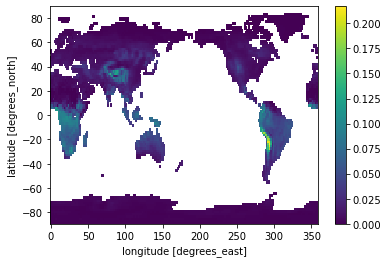

In [10]:
rho_r_CTL_mpi.plot()

In [44]:
rho_r_DEF_ec=rho_r_CROP_ec-rho_r_CTL_ec
#rho_r_AFF_ec=rho_r_FRST_ec-rho_r_CTL_ec

eps_r_DEF_ec=eps_r_CROP_ec-eps_r_CTL_ec
#eps_r_AFF_ec=eps_r_FRST_ec-eps_r_CTL_ec

rho_r_DEF_mpi=rho_r_CROP_mpi-rho_r_CTL_mpi
rho_r_AFF_mpi=rho_r_FRST_mpi-rho_r_CTL_mpi

eps_r_DEF_mpi=eps_r_CROP_mpi-eps_r_CTL_mpi
eps_r_AFF_mpi=eps_r_FRST_mpi-eps_r_CTL_mpi

rho_r_IRR_mpi=rho_r_IRRIG_mpi-rho_r_CROP_mpi
eps_r_IRR_mpi=eps_r_IRRIG_mpi-eps_r_CROP_mpi


rho_r_DEF=rho_r_CROP-rho_r_CTL
rho_r_AFF=rho_r_FRST-rho_r_CTL

eps_r_DEF=eps_r_CROP-eps_r_CTL
eps_r_AFF=eps_r_FRST-eps_r_CTL

rho_r_IRR=rho_r_IRRIG-rho_r_CROP
eps_r_IRR=eps_r_IRRIG-eps_r_CROP



In [45]:

lambda_rho_AFF= lambda_rho_FRST- lambda_rho_CTL
lambda_rho_DEF= lambda_rho_CROP-lambda_rho_CTL
lambda_rho_IRR= lambda_rho_IRRIG-lambda_rho_CROP

lambda_eps_AFF= lambda_eps_FRST- lambda_eps_CTL
lambda_eps_DEF= lambda_eps_CROP-lambda_eps_CTL
lambda_eps_IRR= lambda_eps_IRRIG-lambda_eps_CROP


lambda_rho_AFF_mpi= lambda_rho_FRST_mpi- lambda_rho_CTL_mpi
lambda_rho_DEF_mpi= lambda_rho_CROP_mpi-lambda_rho_CTL_mpi
lambda_rho_IRR_mpi= lambda_rho_IRRIG_mpi-lambda_rho_CROP_mpi

lambda_eps_AFF_mpi= lambda_eps_FRST_mpi- lambda_eps_CTL_mpi
lambda_eps_DEF_mpi= lambda_eps_CROP_mpi-lambda_eps_CTL_mpi
lambda_eps_IRR_mpi= lambda_eps_IRRIG_mpi-lambda_eps_CROP_mpi

#lambda_rho_AFF_ec= lambda_rho_FRST_ec- lambda_rho_CTL_ec
lambda_rho_DEF_ec= lambda_rho_CROP_ec-lambda_rho_CTL_ec

#lambda_eps_AFF_ec= lambda_eps_FRST_ec- lambda_eps_CTL_ec
lambda_eps_DEF_ec= lambda_eps_CROP_ec-lambda_eps_CTL_ec


lambda_rho_AFF_jja= lambda_rho_FRST_jja- lambda_rho_CTL_jja
lambda_rho_DEF_jja= lambda_rho_CROP_jja-lambda_rho_CTL_jja
lambda_rho_IRR_jja= lambda_rho_IRRIG_jja-lambda_rho_CROP_jja

lambda_eps_AFF_jja= lambda_eps_FRST_jja- lambda_eps_CTL_jja
lambda_eps_DEF_jja= lambda_eps_CROP_jja-lambda_eps_CTL_jja
lambda_eps_IRR_jja= lambda_eps_IRRIG_jja-lambda_eps_CROP_jja


lambda_rho_AFF_mpi_jja= lambda_rho_FRST_mpi_jja- lambda_rho_CTL_mpi_jja
lambda_rho_DEF_mpi_jja= lambda_rho_CROP_mpi_jja-lambda_rho_CTL_mpi_jja
lambda_rho_IRR_mpi_jja= lambda_rho_IRRIG_mpi_jja-lambda_rho_CROP_mpi_jja

lambda_eps_AFF_mpi_jja= lambda_eps_FRST_mpi_jja- lambda_eps_CTL_mpi_jja
lambda_eps_DEF_mpi_jja= lambda_eps_CROP_mpi_jja-lambda_eps_CTL_mpi_jja
lambda_eps_IRR_mpi_jja= lambda_eps_IRRIG_mpi_jja-lambda_eps_CROP_mpi_jja

#lambda_rho_AFF_ec= lambda_rho_FRST_ec- lambda_rho_CTL_ec
lambda_rho_DEF_ec_jja= lambda_rho_CROP_ec_jja-lambda_rho_CTL_ec_jja

#lambda_eps_AFF_ec= lambda_eps_FRST_ec- lambda_eps_CTL_ec
lambda_eps_DEF_ec_jja= lambda_eps_CROP_ec_jja-lambda_eps_CTL_ec_jja


lambda_rho_AFF_djf= lambda_rho_FRST_djf- lambda_rho_CTL_djf
lambda_rho_DEF_djf= lambda_rho_CROP_djf-lambda_rho_CTL_djf
lambda_rho_IRR_djf= lambda_rho_IRRIG_djf-lambda_rho_CROP_djf

lambda_eps_AFF_djf= lambda_eps_FRST_djf- lambda_eps_CTL_djf
lambda_eps_DEF_djf= lambda_eps_CROP_djf-lambda_eps_CTL_djf
lambda_eps_IRR_djf= lambda_eps_IRRIG_djf-lambda_eps_CROP_djf


lambda_rho_AFF_mpi_djf= lambda_rho_FRST_mpi_djf- lambda_rho_CTL_mpi_djf
lambda_rho_DEF_mpi_djf= lambda_rho_CROP_mpi_djf-lambda_rho_CTL_mpi_djf
lambda_rho_IRR_mpi_djf= lambda_rho_IRRIG_mpi_djf-lambda_rho_CROP_mpi_djf

lambda_eps_AFF_mpi_djf= lambda_eps_FRST_mpi_djf- lambda_eps_CTL_mpi_djf
lambda_eps_DEF_mpi_djf= lambda_eps_CROP_mpi_djf-lambda_eps_CTL_mpi_djf
lambda_eps_IRR_mpi_djf= lambda_eps_IRRIG_mpi_djf-lambda_eps_CROP_mpi_djf

#lambda_rho_AFF_ec= lambda_rho_FRST_ec- lambda_rho_CTL_ec
lambda_rho_DEF_ec_djf= lambda_rho_CROP_ec_djf-lambda_rho_CTL_ec_djf

#lambda_eps_AFF_ec= lambda_eps_FRST_ec- lambda_eps_CTL_ec
lambda_eps_DEF_ec_djf= lambda_eps_CROP_ec_djf-lambda_eps_CTL_ec_djf

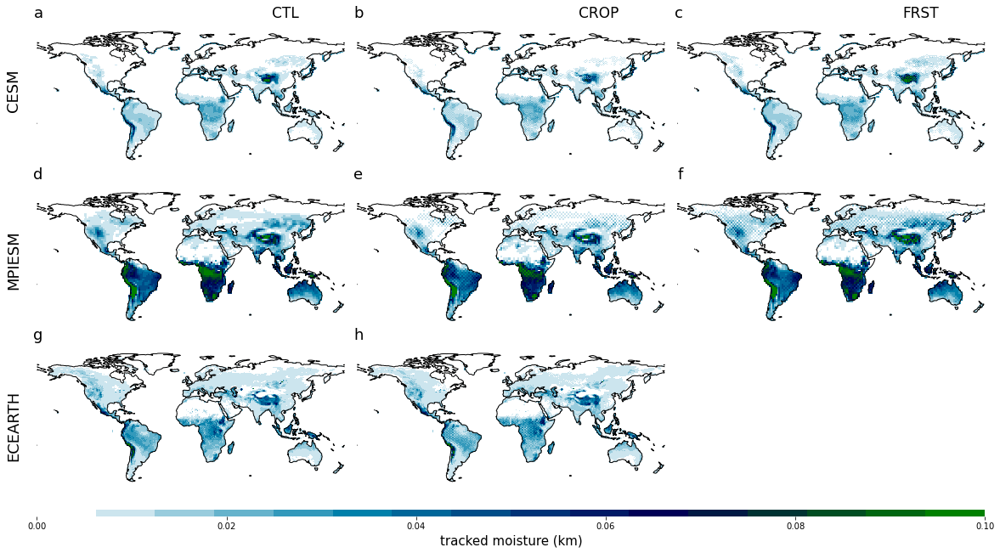

In [12]:


#matplotlib.rc('xtick', labelsize=20) 
#matplotlib.rc('ytick', labelsize=20) 
plt.rcParams['figure.figsize'] = [20, 10]

mpl.rc('axes',edgecolor='none')
k=0
fig = plt.figure()
gs = fig.add_gridspec(3,3,width_ratios=[3,3,3])
cmap='ocean_r'
for model in ['cesm','mpiesm','ecearth']:
    i=0
    k=k+1
    if model=='cesm':
        da_list=[rho_r_CTL,rho_r_CROP,rho_r_FRST]
        pan_list=['a','b','c']
    elif model =='ecearth':
        da_list=[rho_r_CTL_ec,rho_r_CROP_ec]
        pan_list=['g','h']
    elif model =='mpiesm':
        da_list=[rho_r_CTL_mpi,rho_r_CROP_mpi,rho_r_FRST_mpi]
        pan_list=['d','e','f']
    for da in da_list:
        if i==0:
            change='CTL'
        elif i==1:
            change='CROP'
        elif i==2:
            change='FRST'
        i=i+1
        #plot_lims = [da.min(), da.max()]
        plot_lims = [0,0.1]
        # define colorbar levels
        ax = fig.add_subplot(gs[k-1,i-1], projection=ccrs.PlateCarree())
        levels = np.arange(plot_lims[0], plot_lims[1]+30, 30)
        #levels=[-2, -1.75, -1.5, -1.25,-1,-0.75, -0.5,-0.25, 0,0.25, 0.5,0.75, 1,1.25, 1.5,1.75, 2]
        # define colormap (more info on colormaps: https://matplotlib.org/users/colormaps.html)

          #cmap, norm = mpu.from_levels_and_cmap(levels, 'RdBu_r', extend='both')
        cbar_label = 'km'

           # add the coastlines to the plot

        ax.coastlines()
        # plot data array as a map, with the previously defined argumnets
        h=da.plot(ax=ax, cmap=plt.cm.get_cmap(cmap, 16), vmin=plot_lims[0], vmax=plot_lims[1], add_colorbar=False,label=model)
        ax.set_aspect('auto')
        # set the extent of the cartopy geoAxes to \"global\"
          #ax.set_global()

          # or alternatively, if you want to plot a certain region, use (example: Europe)
        ax.set_extent([-180, 180, -63, 89], ccrs.PlateCarree())
        if i==1:
            ax_2=ax
            ax.text(-0.1,0.7,model.upper(),rotation='vertical', transform=ax.transAxes,fontsize=18, va='top', ha='left') 
        ax.set_title('')
        if model=='cesm':
            ax.text(0.02, 1.15, pan_list[i-1], transform=ax.transAxes,fontsize=18, va='top', ha='right')
            ax_old=ax
            if k==1:
                ax.text(0.85, 1.15, change, transform=ax.transAxes,fontsize=17, va='top', ha='right')
        elif model=='mpiesm':
            ax.text(0.02, 1.15, pan_list[i-1], transform=ax.transAxes,fontsize=18, va='top', ha='right')
        elif model=='ecearth':
            ax.text(0.02, 1.15, pan_list[i-1], transform=ax.transAxes,fontsize=18, va='top', ha='right')

cbar = mpu.colorbar(h, ax1=ax_old,ax2=ax_2, shift=0., size=0.05, orientation='horizontal')
cbar.set_label(label='tracked moisture ('+cbar_label+')', size=15)
#cbar.ax.tick_params(labelsize=13) 
fig.subplots_adjust(hspace=0.15, wspace=0.04)


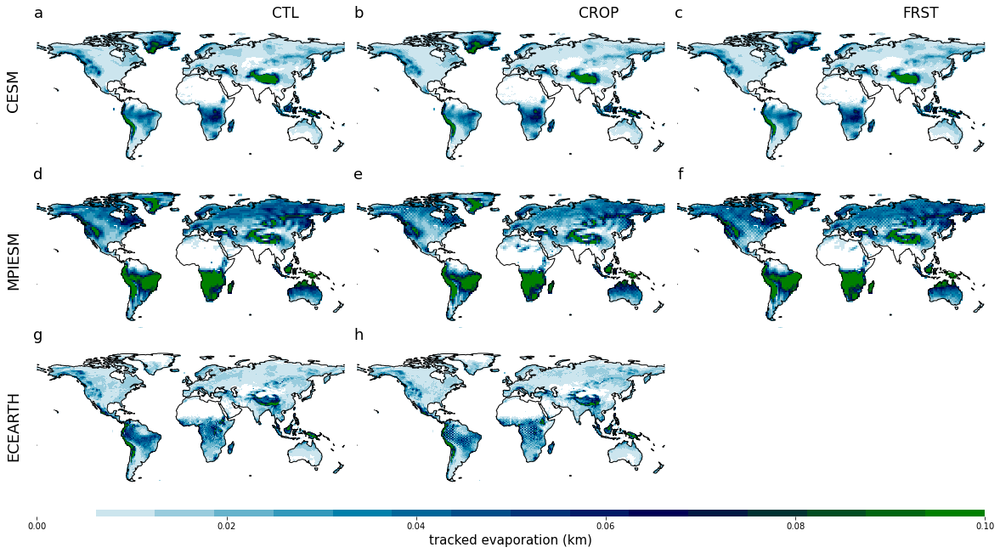

In [13]:


#matplotlib.rc('xtick', labelsize=20) 
#matplotlib.rc('ytick', labelsize=20) 
plt.rcParams['figure.figsize'] = [20, 10]

mpl.rc('axes',edgecolor='none')
k=0
fig = plt.figure()
gs = fig.add_gridspec(3,3,width_ratios=[3,3,3])
cmap='ocean_r'
for model in ['cesm','mpiesm','ecearth']:
    i=0
    k=k+1
    if model=='cesm':
        da_list=[eps_r_CTL,eps_r_CROP,eps_r_FRST]
        pan_list=['a','b','c']
    elif model =='ecearth':
        da_list=[eps_r_CTL_ec,eps_r_CROP_ec]
        pan_list=['g','h']
    elif model =='mpiesm':
        da_list=[eps_r_CTL_mpi,eps_r_CROP_mpi,eps_r_FRST_mpi]
        pan_list=['d','e','f']
    for da in da_list:
        if i==0:
            change='CTL'
        elif i==1:
            change='CROP'
        elif i==2:
            change='FRST'
        i=i+1
        #plot_lims = [da.min(), da.max()]
        plot_lims = [0,0.1]
        # define colorbar levels
        ax = fig.add_subplot(gs[k-1,i-1], projection=ccrs.PlateCarree())
        levels = np.arange(plot_lims[0], plot_lims[1]+30, 30)
        #levels=[-2, -1.75, -1.5, -1.25,-1,-0.75, -0.5,-0.25, 0,0.25, 0.5,0.75, 1,1.25, 1.5,1.75, 2]
        # define colormap (more info on colormaps: https://matplotlib.org/users/colormaps.html)

          #cmap, norm = mpu.from_levels_and_cmap(levels, 'RdBu_r', extend='both')
        cbar_label = 'km'

           # add the coastlines to the plot

        ax.coastlines()
        # plot data array as a map, with the previously defined argumnets
        h=da.plot(ax=ax, cmap=plt.cm.get_cmap(cmap, 16), vmin=plot_lims[0], vmax=plot_lims[1], add_colorbar=False,label=model)
        ax.set_aspect('auto')
        # set the extent of the cartopy geoAxes to \"global\"
          #ax.set_global()

          # or alternatively, if you want to plot a certain region, use (example: Europe)
        ax.set_extent([-180, 180, -63, 89], ccrs.PlateCarree())
        if i==1:
            ax_2=ax
            ax.text(-0.1,0.7,model.upper(),rotation='vertical', transform=ax.transAxes,fontsize=18, va='top', ha='left') 
        ax.set_title('')
        if model=='cesm':
            ax.text(0.02, 1.15, pan_list[i-1], transform=ax.transAxes,fontsize=18, va='top', ha='right')
            ax_old=ax
            if k==1:
                ax.text(0.85, 1.15, change, transform=ax.transAxes,fontsize=17, va='top', ha='right')
        elif model=='mpiesm':
            ax.text(0.02, 1.15, pan_list[i-1], transform=ax.transAxes,fontsize=18, va='top', ha='right')
        elif model=='ecearth':
            ax.text(0.02, 1.15, pan_list[i-1], transform=ax.transAxes,fontsize=18, va='top', ha='right')

cbar = mpu.colorbar(h, ax1=ax_old,ax2=ax_2, shift=0., size=0.05, orientation='horizontal')
cbar.set_label(label='tracked evaporation ('+cbar_label+')', size=15)
#cbar.ax.tick_params(labelsize=13) 
fig.subplots_adjust(hspace=0.15, wspace=0.04)


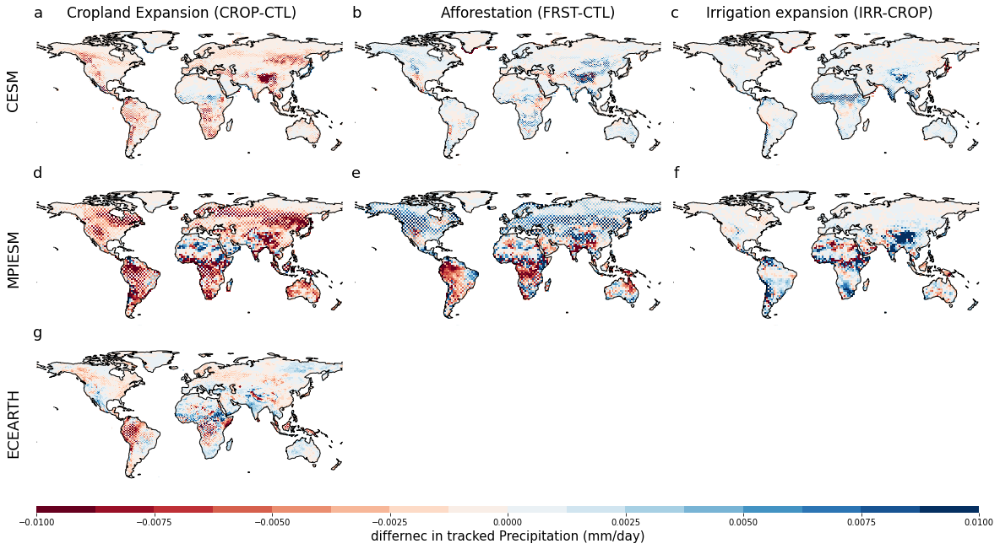

In [14]:

plt.rcParams['figure.figsize'] = [20, 10]
#matplotlib.rc('xtick', labelsize=20) 
#matplotlib.rc('ytick', labelsize=20) 
mpl.rc('axes',edgecolor='none')
k=0
fig = plt.figure()
gs = fig.add_gridspec(3,3,width_ratios=[3,3,3])
cmap='RdBu'
for model in ['cesm','mpiesm','ecearth']:
    i=0
    k=k+1
    if model=='cesm':
        da_list=[rho_r_DEF,rho_r_AFF,rho_r_IRR]
        pan_list=['a','b','c']
    elif model =='ecearth':
        da_list=[rho_r_DEF_ec]
        pan_list=['g']
    elif model=='mpiesm':
        da_list=[rho_r_DEF_mpi,rho_r_AFF_mpi,rho_r_IRR_mpi]
        pan_list=['d','e','f']
    for da in da_list:
        if i==0:
            change='Cropland Expansion (CROP-CTL)'
        elif i==1:
            change='Afforestation (FRST-CTL)'
        elif i==2:
            change='Irrigation expansion (IRR-CROP)'
        i=i+1
        #plot_lims = [da.min(), da.max()]
        plot_lims = [-0.01, 0.01]
        # define colorbar levels
        ax = fig.add_subplot(gs[k-1,i-1], projection=ccrs.PlateCarree())
        levels = np.arange(plot_lims[0], plot_lims[1]+20, 20)
        levels=[-2, -1.5, -1, -0.5, 0, 0.5, 1, 1.5, 2]
        # define colormap (more info on colormaps: https://matplotlib.org/users/colormaps.html)

          #cmap, norm = mpu.from_levels_and_cmap(levels, 'RdBu_r', extend='both')
        cbar_label = 'mm/day'

           # add the coastlines to the plot

        ax.coastlines()
        # plot data array as a map, with the previously defined argumnets
        h=da.plot(ax=ax, cmap=plt.cm.get_cmap(cmap, 16), vmin=plot_lims[0], vmax=plot_lims[1], add_colorbar=False,label=model)
        ax.set_aspect('auto')
        # set the extent of the cartopy geoAxes to \"global\"
          #ax.set_global()

          # or alternatively, if you want to plot a certain region, use (example: Europe)
        ax.set_extent([-180, 180, -63, 89], ccrs.PlateCarree())
        if i==1:
            ax_2=ax
            ax.text(-0.1,0.7,model.upper(),rotation='vertical', transform=ax.transAxes,fontsize=18, va='top', ha='left') 
        ax.set_title('')
        if model=='cesm':
            ax.text(0.02, 1.15, pan_list[i-1], transform=ax.transAxes,fontsize=18, va='top', ha='right')
            if k==1:
                ax.text(0.85, 1.15, change, transform=ax.transAxes,fontsize=17, va='top', ha='right')
        elif model=='mpiesm':
            ax.text(0.02, 1.15, pan_list[i-1], transform=ax.transAxes,fontsize=18, va='top', ha='right')
            ax_old_mpi=ax
        elif model=='ecearth':
            ax.text(0.02, 1.15, pan_list[i-1], transform=ax.transAxes,fontsize=18, va='top', ha='right')

cbar = mpu.colorbar(h, ax1=ax_old_mpi,ax2=ax_2, shift=0., size=0.05, orientation='horizontal')
cbar.set_label(label='differnec in tracked Precipitation ('+cbar_label+')', size=15)
#cbar.ax.tick_params(labelsize=13) 
fig.subplots_adjust(hspace=0.15, wspace=0.04)



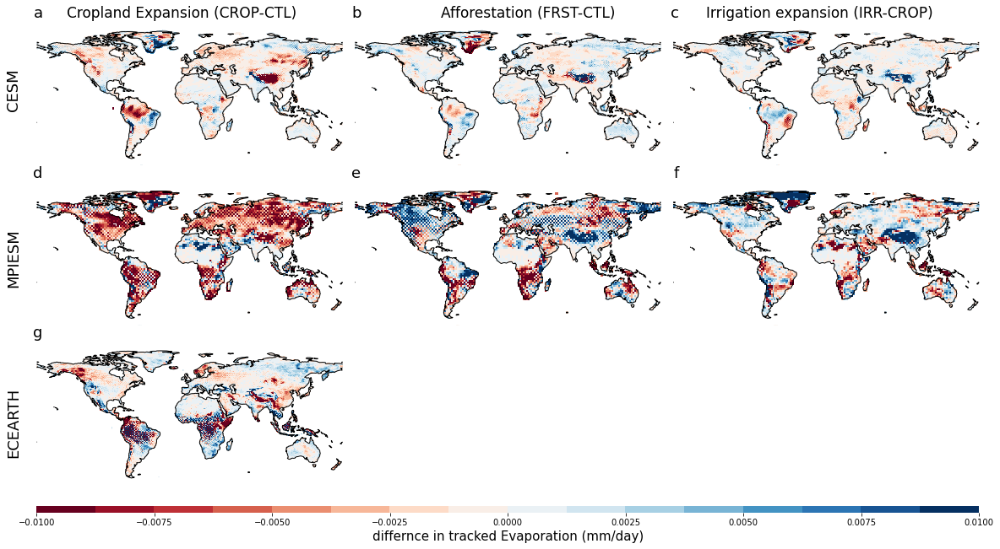

In [15]:

plt.rcParams['figure.figsize'] = [20, 10]
#matplotlib.rc('xtick', labelsize=20) 
#matplotlib.rc('ytick', labelsize=20) 
mpl.rc('axes',edgecolor='none')
k=0
fig = plt.figure()
gs = fig.add_gridspec(3,3,width_ratios=[3,3,3])
cmap='RdBu'
for model in ['cesm','mpiesm','ecearth']:
    i=0
    k=k+1
    if model=='cesm':
        da_list=[eps_r_DEF,eps_r_AFF,eps_r_IRR]
        pan_list=['a','b','c']
    elif model =='ecearth':
        da_list=[eps_r_DEF_ec]
        pan_list=['g']
    elif model=='mpiesm':
        da_list=[eps_r_DEF_mpi,eps_r_AFF_mpi,eps_r_IRR_mpi]
        pan_list=['d','e','f']
    for da in da_list:
        if i==0:
            change='Cropland Expansion (CROP-CTL)'
        elif i==1:
            change='Afforestation (FRST-CTL)'
        elif i==2:
            change='Irrigation expansion (IRR-CROP)'
        i=i+1
        #plot_lims = [da.min(), da.max()]
        plot_lims = [-0.01, 0.01]
        # define colorbar levels
        ax = fig.add_subplot(gs[k-1,i-1], projection=ccrs.PlateCarree())
        levels = np.arange(plot_lims[0], plot_lims[1]+20, 20)
        levels=[-2, -1.5, -1, -0.5, 0, 0.5, 1, 1.5, 2]
        # define colormap (more info on colormaps: https://matplotlib.org/users/colormaps.html)

          #cmap, norm = mpu.from_levels_and_cmap(levels, 'RdBu_r', extend='both')
        cbar_label = 'mm/day'

           # add the coastlines to the plot

        ax.coastlines()
        # plot data array as a map, with the previously defined argumnets
        h=da.plot(ax=ax, cmap=plt.cm.get_cmap(cmap, 16), vmin=plot_lims[0], vmax=plot_lims[1], add_colorbar=False,label=model)
        ax.set_aspect('auto')
        # set the extent of the cartopy geoAxes to \"global\"
          #ax.set_global()

          # or alternatively, if you want to plot a certain region, use (example: Europe)
        ax.set_extent([-180, 180, -63, 89], ccrs.PlateCarree())
        if i==1:
            ax_2=ax
            ax.text(-0.1,0.7,model.upper(),rotation='vertical', transform=ax.transAxes,fontsize=18, va='top', ha='left') 
        ax.set_title('')
        if model=='cesm':
            ax.text(0.02, 1.15, pan_list[i-1], transform=ax.transAxes,fontsize=18, va='top', ha='right')
            if k==1:
                ax.text(0.85, 1.15, change, transform=ax.transAxes,fontsize=17, va='top', ha='right')
        elif model=='mpiesm':
            ax.text(0.02, 1.15, pan_list[i-1], transform=ax.transAxes,fontsize=18, va='top', ha='right')
            ax_old_mpi=ax
        elif model=='ecearth':
            ax.text(0.02, 1.15, pan_list[i-1], transform=ax.transAxes,fontsize=18, va='top', ha='right')

cbar = mpu.colorbar(h, ax1=ax_old_mpi,ax2=ax_2, shift=0., size=0.05, orientation='horizontal')
cbar.set_label(label='differnce in tracked Evaporation ('+cbar_label+')', size=15)
#cbar.ax.tick_params(labelsize=13) 
fig.subplots_adjust(hspace=0.15, wspace=0.04)



In [31]:
### seasonal (JJA)

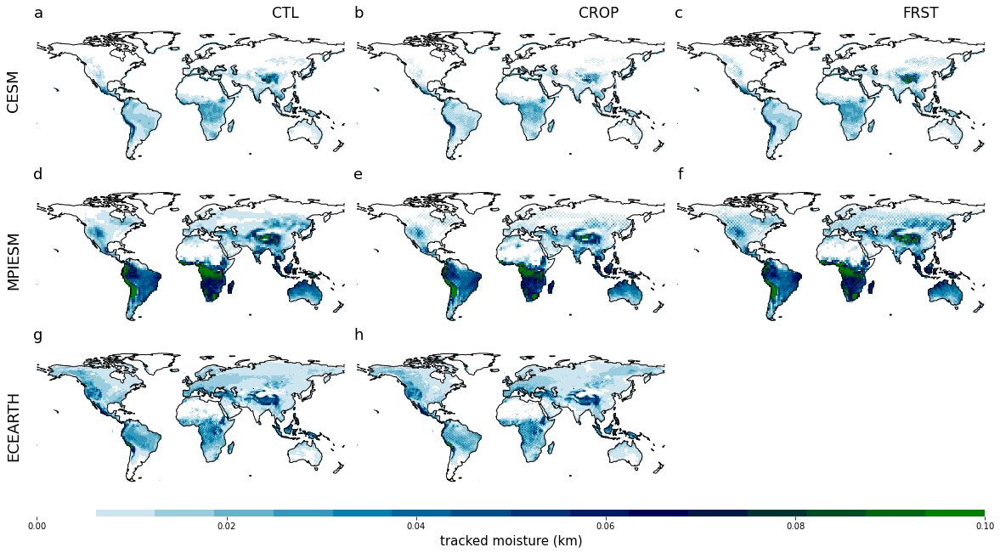

In [32]:


#matplotlib.rc('xtick', labelsize=20) 
#matplotlib.rc('ytick', labelsize=20) 
plt.rcParams['figure.figsize'] = [20, 10]

mpl.rc('axes',edgecolor='none')
k=0
fig = plt.figure()
gs = fig.add_gridspec(3,3,width_ratios=[3,3,3])
cmap='ocean_r'
for model in ['cesm','mpiesm','ecearth']:
    i=0
    k=k+1
    if model=='cesm':
        da_list=[rho_r_CTL_jja,rho_r_CROP_jja,rho_r_FRST_jja]
        pan_list=['a','b','c']
    elif model =='ecearth':
        da_list=[rho_r_CTL_ec_jja,rho_r_CROP_ec_jja]
        pan_list=['g','h']
    elif model =='mpiesm':
        da_list=[rho_r_CTL_mpi_jja,rho_r_CROP_mpi_jja,rho_r_FRST_mpi_jja]
        pan_list=['d','e','f']
    for da in da_list:
        if i==0:
            change='CTL'
        elif i==1:
            change='CROP'
        elif i==2:
            change='FRST'
        i=i+1
        #plot_lims = [da.min(), da.max()]
        plot_lims = [0,0.1]
        # define colorbar levels
        ax = fig.add_subplot(gs[k-1,i-1], projection=ccrs.PlateCarree())
        levels = np.arange(plot_lims[0], plot_lims[1]+30, 30)
        #levels=[-2, -1.75, -1.5, -1.25,-1,-0.75, -0.5,-0.25, 0,0.25, 0.5,0.75, 1,1.25, 1.5,1.75, 2]
        # define colormap (more info on colormaps: https://matplotlib.org/users/colormaps.html)

          #cmap, norm = mpu.from_levels_and_cmap(levels, 'RdBu_r', extend='both')
        cbar_label = 'km'

           # add the coastlines to the plot

        ax.coastlines()
        # plot data array as a map, with the previously defined argumnets
        h=da.plot(ax=ax, cmap=plt.cm.get_cmap(cmap, 16), vmin=plot_lims[0], vmax=plot_lims[1], add_colorbar=False,label=model)
        ax.set_aspect('auto')
        # set the extent of the cartopy geoAxes to \"global\"
          #ax.set_global()

          # or alternatively, if you want to plot a certain region, use (example: Europe)
        ax.set_extent([-180, 180, -63, 89], ccrs.PlateCarree())
        if i==1:
            ax_2=ax
            ax.text(-0.1,0.7,model.upper(),rotation='vertical', transform=ax.transAxes,fontsize=18, va='top', ha='left') 
        ax.set_title('')
        if model=='cesm':
            ax.text(0.02, 1.15, pan_list[i-1], transform=ax.transAxes,fontsize=18, va='top', ha='right')
            ax_old=ax
            if k==1:
                ax.text(0.85, 1.15, change, transform=ax.transAxes,fontsize=17, va='top', ha='right')
        elif model=='mpiesm':
            ax.text(0.02, 1.15, pan_list[i-1], transform=ax.transAxes,fontsize=18, va='top', ha='right')
        elif model=='ecearth':
            ax.text(0.02, 1.15, pan_list[i-1], transform=ax.transAxes,fontsize=18, va='top', ha='right')

cbar = mpu.colorbar(h, ax1=ax_old,ax2=ax_2, shift=0., size=0.05, orientation='horizontal')
cbar.set_label(label='tracked moisture ('+cbar_label+')', size=15)
#cbar.ax.tick_params(labelsize=13) 
fig.subplots_adjust(hspace=0.15, wspace=0.04)


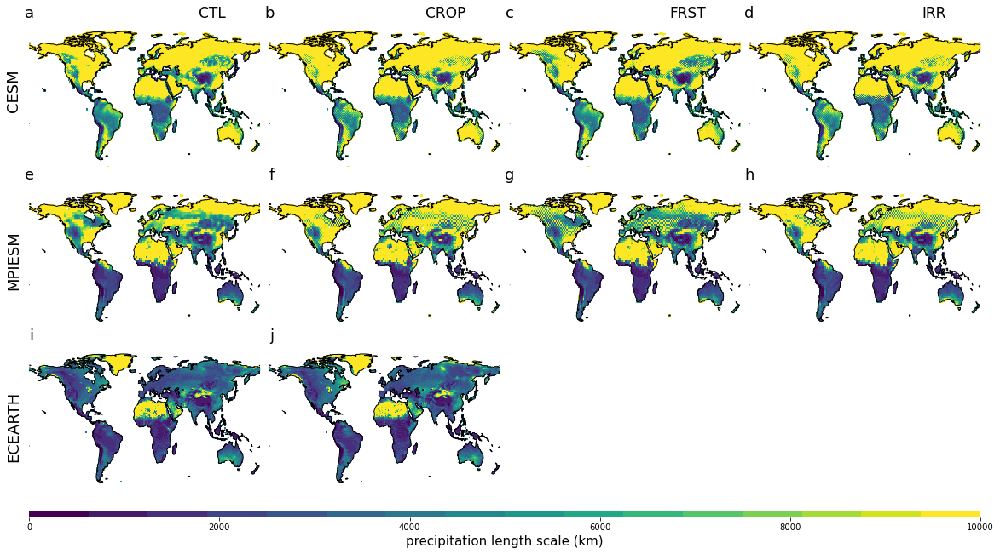

In [16]:


#matplotlib.rc('xtick', labelsize=20) 
#matplotlib.rc('ytick', labelsize=20) 
plt.rcParams['figure.figsize'] = [20, 10]

mpl.rc('axes',edgecolor='none')
k=0
fig = plt.figure()
gs = fig.add_gridspec(3,4)
cmap='viridis'
for model in ['cesm','mpiesm','ecearth']:
    i=0
    k=k+1
    if model=='cesm':
        da_list=[lambda_rho_CTL,lambda_rho_CROP,lambda_rho_FRST,lambda_rho_IRRIG]
        pan_list=['a','b','c','d']
    elif model =='ecearth':
        da_list=[lambda_rho_CTL_ec,lambda_rho_CROP_ec]
        pan_list=['i','j']
    elif model =='mpiesm':
        da_list=[lambda_rho_CTL_mpi,lambda_rho_CROP_mpi,lambda_rho_FRST_mpi,lambda_rho_IRRIG_mpi]
        pan_list=['e','f','g','h']
    for da in da_list:
        if i==0:
            change='CTL'
        elif i==1:
            change='CROP'
        elif i==2:
            change='FRST'
        elif i==3:
            change='IRR'
        i=i+1
        #plot_lims = [da.min(), da.max()]
        plot_lims = [0,10000]
        # define colorbar levels
        ax = fig.add_subplot(gs[k-1,i-1], projection=ccrs.PlateCarree())
        levels = np.arange(plot_lims[0], plot_lims[1]+30, 30)
        #levels=[-2, -1.75, -1.5, -1.25,-1,-0.75, -0.5,-0.25, 0,0.25, 0.5,0.75, 1,1.25, 1.5,1.75, 2]
        # define colormap (more info on colormaps: https://matplotlib.org/users/colormaps.html)

          #cmap, norm = mpu.from_levels_and_cmap(levels, 'RdBu_r', extend='both')
        cbar_label = 'km'

           # add the coastlines to the plot

        ax.coastlines()
        # plot data array as a map, with the previously defined argumnets
        h=da.plot(ax=ax, cmap=plt.cm.get_cmap(cmap, 16), vmin=plot_lims[0], vmax=plot_lims[1], add_colorbar=False,label=model)
        ax.set_aspect('auto')
        # set the extent of the cartopy geoAxes to \"global\"
          #ax.set_global()

          # or alternatively, if you want to plot a certain region, use (example: Europe)
        ax.set_extent([-180, 180, -63, 89], ccrs.PlateCarree())
        if i==1:
            ax_2=ax
            ax.text(-0.1,0.7,model.upper(),rotation='vertical', transform=ax.transAxes,fontsize=18, va='top', ha='left') 
        ax.set_title('')
        if model=='cesm':
            ax.text(0.02, 1.15, pan_list[i-1], transform=ax.transAxes,fontsize=18, va='top', ha='right')
            ax_old=ax
            if k==1:
                ax.text(0.85, 1.15, change, transform=ax.transAxes,fontsize=17, va='top', ha='right')
        elif model=='mpiesm':
            ax.text(0.02, 1.15, pan_list[i-1], transform=ax.transAxes,fontsize=18, va='top', ha='right')
        elif model=='ecearth':
            ax.text(0.02, 1.15, pan_list[i-1], transform=ax.transAxes,fontsize=18, va='top', ha='right')

cbar = mpu.colorbar(h, ax1=ax_old,ax2=ax_2, shift=0., size=0.05, orientation='horizontal')
cbar.set_label(label='precipitation length scale ('+cbar_label+')', size=15)
#cbar.ax.tick_params(labelsize=13) 
fig.subplots_adjust(hspace=0.15, wspace=0.04)


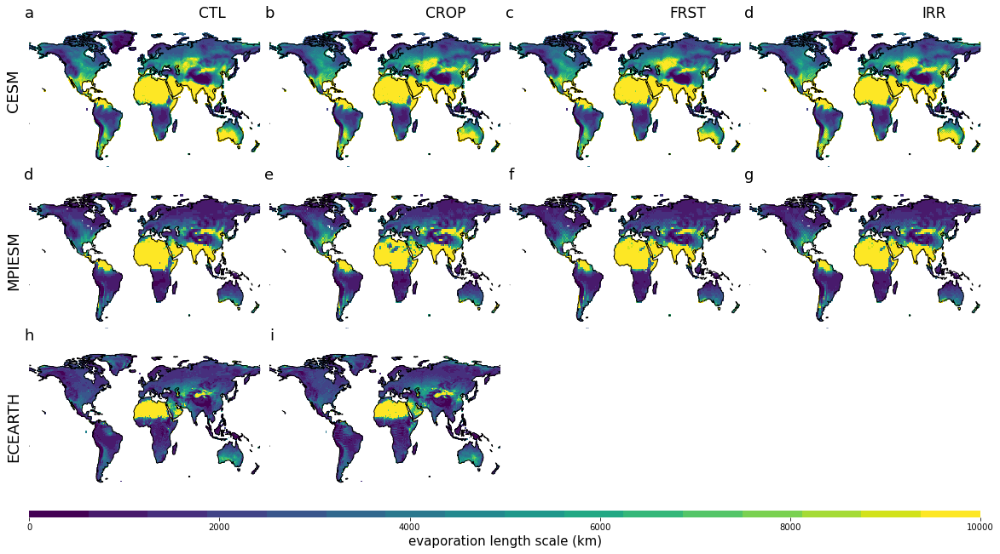

In [17]:


#matplotlib.rc('xtick', labelsize=20) 
#matplotlib.rc('ytick', labelsize=20) 
plt.rcParams['figure.figsize'] = [20, 10]

mpl.rc('axes',edgecolor='none')
k=0
fig = plt.figure()
gs = fig.add_gridspec(3,4)
cmap='viridis'
for model in ['cesm','mpiesm','ecearth']:
    i=0
    k=k+1
    if model=='cesm':
        da_list=[lambda_eps_CTL,lambda_eps_CROP,lambda_eps_FRST,lambda_eps_IRRIG]
        pan_list=['a','b','c','d']
    elif model =='ecearth':
        da_list=[lambda_eps_CTL_ec,lambda_eps_CROP_ec]
        pan_list=['h','i']
    elif model =='mpiesm':
        da_list=[lambda_eps_CTL_mpi,lambda_eps_CROP_mpi,lambda_eps_FRST_mpi,lambda_eps_FRST_mpi]
        pan_list=['d','e','f','g']
    for da in da_list:
        if i==0:
            change='CTL'
        elif i==1:
            change='CROP'
        elif i==2:
            change='FRST'
        elif i==3:
            change='IRR'
        i=i+1
        #plot_lims = [da.min(), da.max()]
        plot_lims = [0,10000]
        # define colorbar levels
        ax = fig.add_subplot(gs[k-1,i-1], projection=ccrs.PlateCarree())
        levels = np.arange(plot_lims[0], plot_lims[1]+30, 30)
        #levels=[-2, -1.75, -1.5, -1.25,-1,-0.75, -0.5,-0.25, 0,0.25, 0.5,0.75, 1,1.25, 1.5,1.75, 2]
        # define colormap (more info on colormaps: https://matplotlib.org/users/colormaps.html)

          #cmap, norm = mpu.from_levels_and_cmap(levels, 'RdBu_r', extend='both')
        cbar_label = 'km'

           # add the coastlines to the plot

        ax.coastlines()
        # plot data array as a map, with the previously defined argumnets
        h=da.plot(ax=ax, cmap=plt.cm.get_cmap(cmap, 16), vmin=plot_lims[0], vmax=plot_lims[1], add_colorbar=False,label=model)
        ax.set_aspect('auto')
        # set the extent of the cartopy geoAxes to \"global\"
          #ax.set_global()

          # or alternatively, if you want to plot a certain region, use (example: Europe)
        ax.set_extent([-180, 180, -63, 89], ccrs.PlateCarree())
        if i==1:
            ax_2=ax
            ax.text(-0.1,0.7,model.upper(),rotation='vertical', transform=ax.transAxes,fontsize=18, va='top', ha='left') 
        ax.set_title('')
        if model=='cesm':
            ax.text(0.02, 1.15, pan_list[i-1], transform=ax.transAxes,fontsize=18, va='top', ha='right')
            ax_old=ax
            if k==1:
                ax.text(0.85, 1.15, change, transform=ax.transAxes,fontsize=17, va='top', ha='right')
        elif model=='mpiesm':
            ax.text(0.02, 1.15, pan_list[i-1], transform=ax.transAxes,fontsize=18, va='top', ha='right')
        elif model=='ecearth':
            ax.text(0.02, 1.15, pan_list[i-1], transform=ax.transAxes,fontsize=18, va='top', ha='right')

cbar = mpu.colorbar(h, ax1=ax_old,ax2=ax_2, shift=0., size=0.05, orientation='horizontal')
cbar.set_label(label='evaporation length scale ('+cbar_label+')', size=15)
#cbar.ax.tick_params(labelsize=13) 
fig.subplots_adjust(hspace=0.15, wspace=0.04)


NameError: name 'lambda_eps_AFF_ec' is not defined

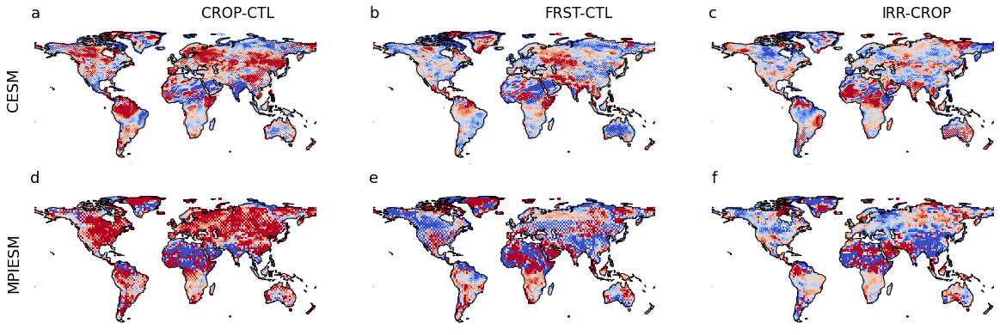

In [18]:


#matplotlib.rc('xtick', labelsize=20) 
#matplotlib.rc('ytick', labelsize=20) 
plt.rcParams['figure.figsize'] = [20, 10]

mpl.rc('axes',edgecolor='none')
k=0
fig = plt.figure()
gs = fig.add_gridspec(3,3,width_ratios=[3,3,3])
cmap='coolwarm'
for model in ['cesm','mpiesm','ecearth']:
    i=0
    k=k+1
    if model=='cesm':
        da_list=[lambda_eps_DEF/lambda_eps_CTL,lambda_eps_AFF/lambda_eps_CTL,lambda_eps_IRR/lambda_eps_CTL]
        pan_list=['a','b','c']
    elif model =='ecearth':
        da_list=[lambda_eps_DEF_ec/lambda_eps_CTL_ec,lambda_eps_AFF_ec/lambda_eps_CTL_ec]
        pan_list=['h','i','j']
    elif model =='mpiesm':
        da_list=[lambda_eps_DEF_mpi/lambda_eps_CTL_mpi,lambda_eps_AFF_mpi/lambda_eps_CTL_mpi,lambda_eps_IRR_mpi/lambda_eps_CTL_mpi]
        pan_list=['d','e','f']
    for da in da_list:
        if i==0:
            change='CROP-CTL'
        elif i==1:
            change='FRST-CTL'
        elif i==2:
            change='IRR-CROP'
        i=i+1
#        plot_lims = [da.min(), da.max()]
        plot_lims = [-0.2,0.2]
        # define colorbar levels
        ax = fig.add_subplot(gs[k-1,i-1], projection=ccrs.PlateCarree())
        levels = np.arange(plot_lims[0], plot_lims[1]+30, 30)
        #levels=[-2, -1.75, -1.5, -1.25,-1,-0.75, -0.5,-0.25, 0,0.25, 0.5,0.75, 1,1.25, 1.5,1.75, 2]
        # define colormap (more info on colormaps: https://matplotlib.org/users/colormaps.html)

          #cmap, norm = mpu.from_levels_and_cmap(levels, 'RdBu_r', extend='both')
        cbar_label = '%'

           # add the coastlines to the plot

        ax.coastlines()
        # plot data array as a map, with the previously defined argumnets
        h=da.plot(ax=ax, cmap=plt.cm.get_cmap(cmap, 16), vmin=plot_lims[0], vmax=plot_lims[1], add_colorbar=False,label=model)
        ax.set_aspect('auto')
        # set the extent of the cartopy geoAxes to \"global\"
          #ax.set_global()

          # or alternatively, if you want to plot a certain region, use (example: Europe)
        ax.set_extent([-180, 180, -63, 89], ccrs.PlateCarree())
        if i==1:
            ax_2=ax
            ax.text(-0.1,0.7,model.upper(),rotation='vertical', transform=ax.transAxes,fontsize=18, va='top', ha='left') 
        ax.set_title('')
        if model=='cesm':
            ax.text(0.02, 1.15, pan_list[i-1], transform=ax.transAxes,fontsize=18, va='top', ha='right')
            ax_old=ax
            if k==1:
                ax.text(0.85, 1.15, change, transform=ax.transAxes,fontsize=17, va='top', ha='right')
        elif model=='mpiesm':
            ax.text(0.02, 1.15, pan_list[i-1], transform=ax.transAxes,fontsize=18, va='top', ha='right')
        elif model=='ecearth':
            ax.text(0.02, 1.15, pan_list[i-1], transform=ax.transAxes,fontsize=18, va='top', ha='right')

cbar = mpu.colorbar(h, ax1=ax_old,ax2=ax_2, shift=0., size=0.05, orientation='horizontal')
cbar.set_label(label='difference in evaporation length scale ('+cbar_label+')', size=15)
#cbar.ax.tick_params(labelsize=13) 
fig.subplots_adjust(hspace=0.15, wspace=0.04)


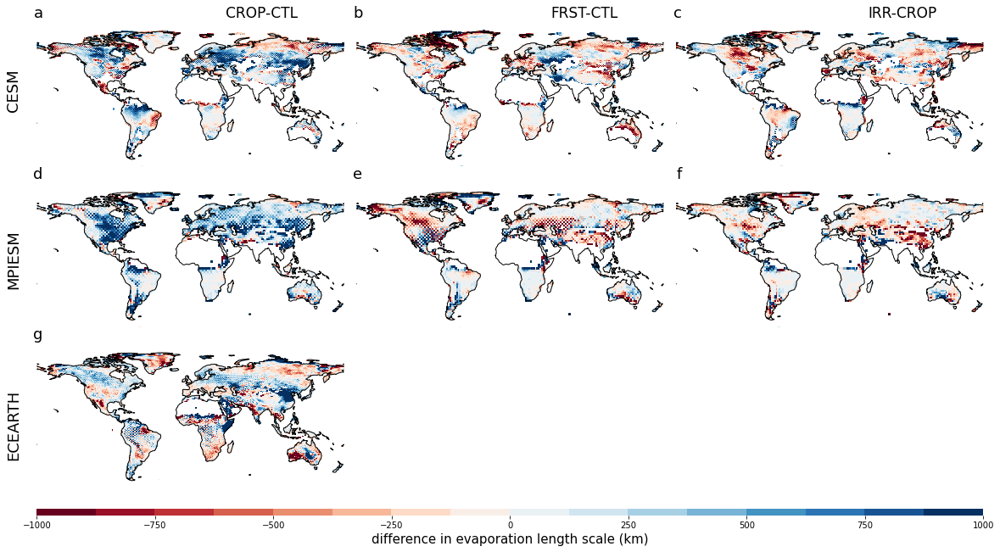

In [19]:
cut=7000
lambda_rho_AFF=xr.where(lambda_rho_CTL<cut,lambda_rho_AFF,np.nan)  ##only look at areas with high recycling rates
lambda_eps_AFF=xr.where(lambda_eps_CTL<cut,lambda_eps_AFF,np.nan)

lambda_rho_DEF=xr.where(lambda_rho_CTL<cut,lambda_rho_DEF,np.nan)  ##only look at areas with high recycling rates
lambda_eps_DEF=xr.where(lambda_eps_CTL<cut,lambda_eps_DEF,np.nan)

lambda_rho_IRR=xr.where(lambda_rho_CTL<cut,lambda_rho_IRR,np.nan)  ##only look at areas with high recycling rates
lambda_eps_IRR=xr.where(lambda_eps_CTL<cut,lambda_eps_IRR,np.nan)

lambda_rho_DEF_ec=xr.where(lambda_rho_CTL_ec<cut,lambda_rho_DEF_ec,np.nan)  ##only look at areas with high recycling rates
lambda_eps_DEF_ec=xr.where(lambda_eps_CTL_ec<cut,lambda_eps_DEF_ec,np.nan)

lambda_rho_AFF_mpi=xr.where(lambda_rho_CTL_mpi<cut,lambda_rho_AFF_mpi,np.nan)  ##only look at areas with high recycling rates
lambda_eps_AFF_mpi=xr.where(lambda_eps_CTL_mpi<cut,lambda_eps_AFF_mpi,np.nan)

lambda_rho_DEF_mpi=xr.where(lambda_rho_CTL_mpi<cut,lambda_rho_DEF_mpi,np.nan)  ##only look at areas with high recycling rates
lambda_eps_DEF_mpi=xr.where(lambda_eps_CTL_mpi<cut,lambda_eps_DEF_mpi,np.nan)

lambda_rho_IRR_mpi=xr.where(lambda_rho_CTL_mpi<cut,lambda_rho_IRR_mpi,np.nan)  ##only look at areas with high recycling rates
lambda_eps_IRR_mpi=xr.where(lambda_eps_CTL_mpi<cut,lambda_eps_IRR_mpi,np.nan)

#matplotlib.rc('xtick', labelsize=20) 
#matplotlib.rc('ytick', labelsize=20) 
plt.rcParams['figure.figsize'] = [20, 10]

mpl.rc('axes',edgecolor='none')
k=0
fig = plt.figure()
gs = fig.add_gridspec(3,3,width_ratios=[3,3,3])
cmap='RdBu'
for model in ['cesm','mpiesm','ecearth']:
    i=0
    k=k+1
    if model=='cesm':
        da_list=[lambda_eps_DEF,lambda_eps_AFF,lambda_eps_IRR]
        pan_list=['a','b','c']
    elif model =='ecearth':
        da_list=[lambda_eps_DEF_ec]
        pan_list=['g']
    elif model =='mpiesm':
        da_list=[lambda_eps_DEF_mpi,lambda_eps_AFF_mpi,lambda_eps_IRR_mpi]
        pan_list=['d','e','f']
    for da in da_list:
        if i==0:
            change='CROP-CTL'
        elif i==1:
            change='FRST-CTL'
        elif i==2:
            change='IRR-CROP'
        i=i+1
#        plot_lims = [da.min(), da.max()]
        plot_lims = [-1000,1000]
        # define colorbar levels
        ax = fig.add_subplot(gs[k-1,i-1], projection=ccrs.PlateCarree())
        levels = np.arange(plot_lims[0], plot_lims[1]+30, 30)
        #levels=[-2, -1.75, -1.5, -1.25,-1,-0.75, -0.5,-0.25, 0,0.25, 0.5,0.75, 1,1.25, 1.5,1.75, 2]
        # define colormap (more info on colormaps: https://matplotlib.org/users/colormaps.html)

          #cmap, norm = mpu.from_levels_and_cmap(levels, 'RdBu_r', extend='both')
        cbar_label = 'km'

           # add the coastlines to the plot

        ax.coastlines()
        # plot data array as a map, with the previously defined argumnets
        h=da.plot(ax=ax, cmap=plt.cm.get_cmap(cmap, 16), vmin=plot_lims[0], vmax=plot_lims[1], add_colorbar=False,label=model)
        ax.set_aspect('auto')
        # set the extent of the cartopy geoAxes to \"global\"
          #ax.set_global()

          # or alternatively, if you want to plot a certain region, use (example: Europe)
        ax.set_extent([-180, 180, -63, 89], ccrs.PlateCarree())
        if i==1:
            ax_2=ax
            ax.text(-0.1,0.7,model.upper(),rotation='vertical', transform=ax.transAxes,fontsize=18, va='top', ha='left') 
        ax.set_title('')
        if model=='cesm':
            ax.text(0.02, 1.15, pan_list[i-1], transform=ax.transAxes,fontsize=18, va='top', ha='right')
            ax_old=ax
            if k==1:
                ax.text(0.85, 1.15, change, transform=ax.transAxes,fontsize=17, va='top', ha='right')
        elif model=='mpiesm':
            ax.text(0.02, 1.15, pan_list[i-1], transform=ax.transAxes,fontsize=18, va='top', ha='right')
        elif model=='ecearth':
            ax.text(0.02, 1.15, pan_list[i-1], transform=ax.transAxes,fontsize=18, va='top', ha='right')

cbar = mpu.colorbar(h, ax1=ax_old,ax2=ax_2, shift=0., size=0.05, orientation='horizontal')
cbar.set_label(label='difference in evaporation length scale ('+cbar_label+')', size=15)
#cbar.ax.tick_params(labelsize=13) 
fig.subplots_adjust(hspace=0.15, wspace=0.04)


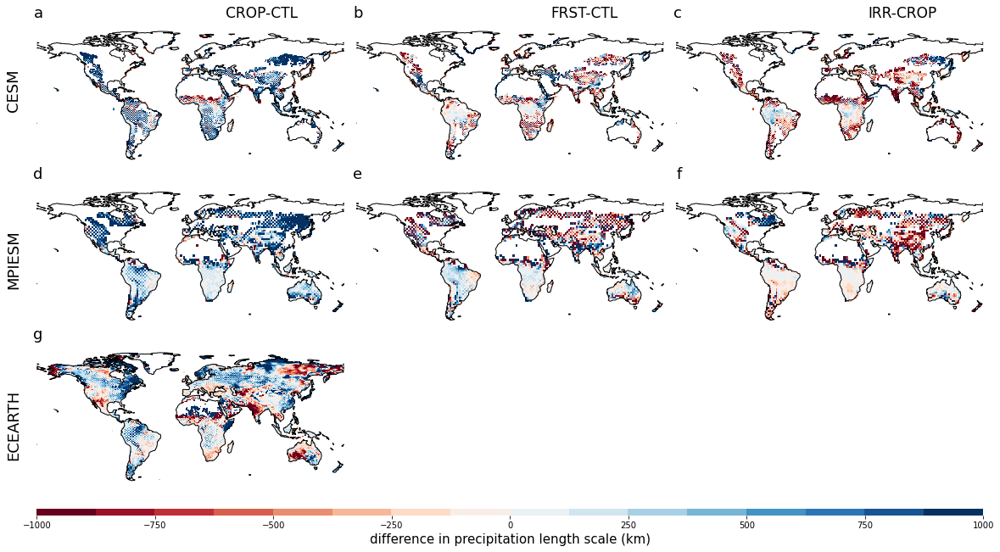

In [20]:
cut=7000
lambda_rho_AFF=xr.where(lambda_rho_CTL<cut,lambda_rho_AFF,np.nan)  ##only look at areas with high recycling rates
lambda_eps_AFF=xr.where(lambda_eps_CTL<cut,lambda_eps_AFF,np.nan)

lambda_rho_DEF=xr.where(lambda_rho_CTL<cut,lambda_rho_DEF,np.nan)  ##only look at areas with high recycling rates
lambda_eps_DEF=xr.where(lambda_eps_CTL<cut,lambda_eps_DEF,np.nan)

lambda_rho_IRR=xr.where(lambda_rho_CTL<cut,lambda_rho_IRR,np.nan)  ##only look at areas with high recycling rates
lambda_eps_IRR=xr.where(lambda_eps_CTL<cut,lambda_eps_IRR,np.nan)

lambda_rho_DEF_ec=xr.where(lambda_rho_CTL_ec<cut,lambda_rho_DEF_ec,np.nan)  ##only look at areas with high recycling rates
lambda_eps_DEF_ec=xr.where(lambda_eps_CTL_ec<cut,lambda_eps_DEF_ec,np.nan)

lambda_rho_AFF_mpi=xr.where(lambda_rho_CTL_mpi<cut,lambda_rho_AFF_mpi,np.nan)  ##only look at areas with high recycling rates
lambda_eps_AFF_mpi=xr.where(lambda_eps_CTL_mpi<cut,lambda_eps_AFF_mpi,np.nan)

lambda_rho_DEF_mpi=xr.where(lambda_rho_CTL_mpi<cut,lambda_rho_DEF_mpi,np.nan)  ##only look at areas with high recycling rates
lambda_eps_DEF_mpi=xr.where(lambda_eps_CTL_mpi<cut,lambda_eps_DEF_mpi,np.nan)

lambda_rho_IRR_mpi=xr.where(lambda_rho_CTL_mpi<cut,lambda_rho_IRR_mpi,np.nan)  ##only look at areas with high recycling rates
lambda_eps_IRR_mpi=xr.where(lambda_eps_CTL_mpi<cut,lambda_eps_IRR_mpi,np.nan)

#matplotlib.rc('xtick', labelsize=20) 
#matplotlib.rc('ytick', labelsize=20) 
plt.rcParams['figure.figsize'] = [20, 10]

mpl.rc('axes',edgecolor='none')
k=0
fig = plt.figure()
gs = fig.add_gridspec(3,3,width_ratios=[3,3,3])
cmap='RdBu'
for model in ['cesm','mpiesm','ecearth']:
    i=0
    k=k+1
    if model=='cesm':
        da_list=[lambda_rho_DEF,lambda_rho_AFF,lambda_rho_IRR]
        pan_list=['a','b','c']
    elif model =='ecearth':
        da_list=[lambda_rho_DEF_ec]
        pan_list=['g']
    elif model =='mpiesm':
        da_list=[lambda_rho_DEF_mpi,lambda_rho_AFF_mpi,lambda_rho_IRR_mpi]
        pan_list=['d','e','f']
    for da in da_list:
        if i==0:
            change='CROP-CTL'
        elif i==1:
            change='FRST-CTL'
        elif i==2:
            change='IRR-CROP'
        i=i+1
#        plot_lims = [da.min(), da.max()]
        plot_lims = [-1000,1000]
        # define colorbar levels
        ax = fig.add_subplot(gs[k-1,i-1], projection=ccrs.PlateCarree())
        levels = np.arange(plot_lims[0], plot_lims[1]+30, 30)
        #levels=[-2, -1.75, -1.5, -1.25,-1,-0.75, -0.5,-0.25, 0,0.25, 0.5,0.75, 1,1.25, 1.5,1.75, 2]
        # define colormap (more info on colormaps: https://matplotlib.org/users/colormaps.html)

          #cmap, norm = mpu.from_levels_and_cmap(levels, 'RdBu_r', extend='both')
        cbar_label = 'km'

           # add the coastlines to the plot

        ax.coastlines()
        # plot data array as a map, with the previously defined argumnets
        h=da.plot(ax=ax, cmap=plt.cm.get_cmap(cmap, 16), vmin=plot_lims[0], vmax=plot_lims[1], add_colorbar=False,label=model)
        ax.set_aspect('auto')
        # set the extent of the cartopy geoAxes to \"global\"
          #ax.set_global()

          # or alternatively, if you want to plot a certain region, use (example: Europe)
        ax.set_extent([-180, 180, -63, 89], ccrs.PlateCarree())
        if i==1:
            ax_2=ax
            ax.text(-0.1,0.7,model.upper(),rotation='vertical', transform=ax.transAxes,fontsize=18, va='top', ha='left') 
        ax.set_title('')
        if model=='cesm':
            ax.text(0.02, 1.15, pan_list[i-1], transform=ax.transAxes,fontsize=18, va='top', ha='right')
            ax_old=ax
            if k==1:
                ax.text(0.85, 1.15, change, transform=ax.transAxes,fontsize=17, va='top', ha='right')
        elif model=='mpiesm':
            ax.text(0.02, 1.15, pan_list[i-1], transform=ax.transAxes,fontsize=18, va='top', ha='right')
        elif model=='ecearth':
            ax.text(0.02, 1.15, pan_list[i-1], transform=ax.transAxes,fontsize=18, va='top', ha='right')

cbar = mpu.colorbar(h, ax1=ax_old,ax2=ax_2, shift=0., size=0.05, orientation='horizontal')
cbar.set_label(label='difference in precipitation length scale ('+cbar_label+')', size=15)
#cbar.ax.tick_params(labelsize=13) 
fig.subplots_adjust(hspace=0.15, wspace=0.04)


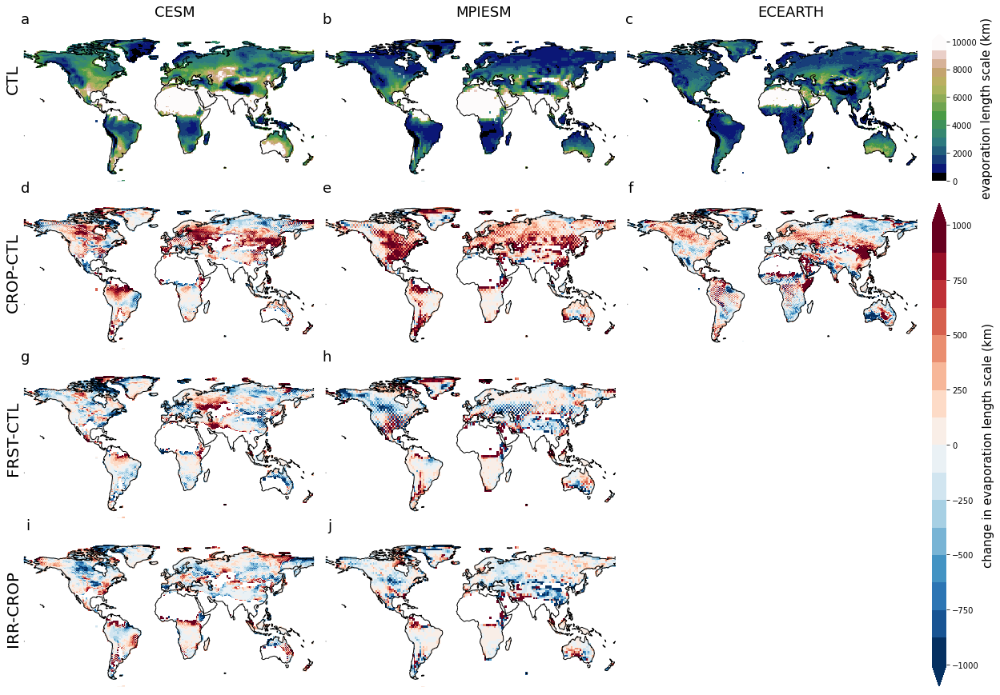

In [24]:
#matplotlib.rc('xtick', labelsize=20) 
#matplotlib.rc('ytick', labelsize=20) 
plt.rcParams['figure.figsize'] = [20, 15]

mpl.rc('axes',edgecolor='none')
k=0
fig = plt.figure()
gs = fig.add_gridspec(4,3)
cmap='RdBu_r'
cmap2='gist_earth'
#cmap2='ocean_r'

for model in ['cesm','mpiesm','ecearth']:
    i=0
    k=k+1
    if model=='cesm':
        da_list=[lambda_eps_CTL,lambda_eps_DEF,lambda_eps_AFF,lambda_eps_IRR]
        pan_list=['a','d','g','i']
    elif model =='ecearth':
        da_list=[lambda_eps_CTL_ec,lambda_eps_DEF_ec]
        pan_list=['c','f']
    elif model =='mpiesm':
        da_list=[lambda_eps_CTL_mpi,lambda_eps_DEF_mpi,lambda_eps_AFF_mpi,lambda_eps_IRR_mpi]
        pan_list=['b','e','h','j']
    for da in da_list:
        if i==0:
            change='CTL'
        elif i==1:
            change='CROP-CTL'
        elif i==2:
            change='FRST-CTL'
        elif i==3:
            change='IRR-CROP'
        i=i+1
#        plot_lims = [da.min(), da.max()]
        plot_lims = [-1000,1000]
        plot_lims2=  [0,10000]
        # define colorbar levels
        ax = fig.add_subplot(gs[i-1,k-1], projection=ccrs.PlateCarree())
        levels = np.arange(plot_lims[0], plot_lims[1]+30, 30)
        levels2 = np.arange(plot_lims2[0], plot_lims2[1]+30, 30)
        #levels=[-2, -1.75, -1.5, -1.25,-1,-0.75, -0.5,-0.25, 0,0.25, 0.5,0.75, 1,1.25, 1.5,1.75, 2]
        # define colormap (more info on colormaps: https://matplotlib.org/users/colormaps.html)

          #cmap, norm = mpu.from_levels_and_cmap(levels, 'RdBu_r', extend='both')
        cbar_label = 'km'

           # add the coastlines to the plot

        ax.coastlines()
        # plot data array as a map, with the previously defined argumnets
        if i==1:
            h=da.plot(ax=ax, cmap=plt.cm.get_cmap(cmap2, 16), vmin=plot_lims2[0], vmax=plot_lims2[1], add_colorbar=False,label=model)
            if k==3:
                ax3=ax
                cbar2 = mpu.colorbar(h, ax1=ax3, shift=0., size=0.05, orientation='vertical',extend='max')
                cbar2.set_label(label='evaporation length scale ('+cbar_label+')', size=15)
        if i!=1:
            h=da.plot(ax=ax, cmap=plt.cm.get_cmap(cmap, 16), vmin=plot_lims[0], vmax=plot_lims[1], add_colorbar=False,label=model)
        ax.set_aspect('auto')
        # set the extent of the cartopy geoAxes to \"global\"
          #ax.set_global()

          # or alternatively, if you want to plot a certain region, use (example: Europe)
        ax.set_extent([-180, 180, -63, 89], ccrs.PlateCarree())
        if i==2:
            if k==2:
                ax_2=ax
        if i==1:
            ax.text(0.45,1.2,model.upper(), transform=ax.transAxes,fontsize=18, va='top', ha='left') 
        ax.set_title('')
        if model=='cesm':
            ax.text(0.02, 1.15, pan_list[i-1], transform=ax.transAxes,fontsize=18, va='top', ha='right')
            if k==1:
                ax.text(-0.01, 0.8, change, transform=ax.transAxes,fontsize=20, va='top', ha='right',rotation='vertical')
        elif model=='mpiesm':
            ax.text(0.02, 1.15, pan_list[i-1], transform=ax.transAxes,fontsize=18, va='top', ha='right')
        elif model=='ecearth':
            ax.text(0.02, 1.15, pan_list[i-1], transform=ax.transAxes,fontsize=18, va='top', ha='right')
        
ax_old = plt.subplot(gs[3, 2])
ax_old.set_xticks([])
ax_old.set_yticks([])
cbar = mpu.colorbar(h, ax1=ax_old,ax2=ax_2, shift=0., size=0.05, orientation='vertical',extend='both')
cbar.set_label(label='change in evaporation length scale ('+cbar_label+')', size=15)
#cbar.ax.tick_params(labelsize=13) 
fig.subplots_adjust(hspace=0.15, wspace=0.04)


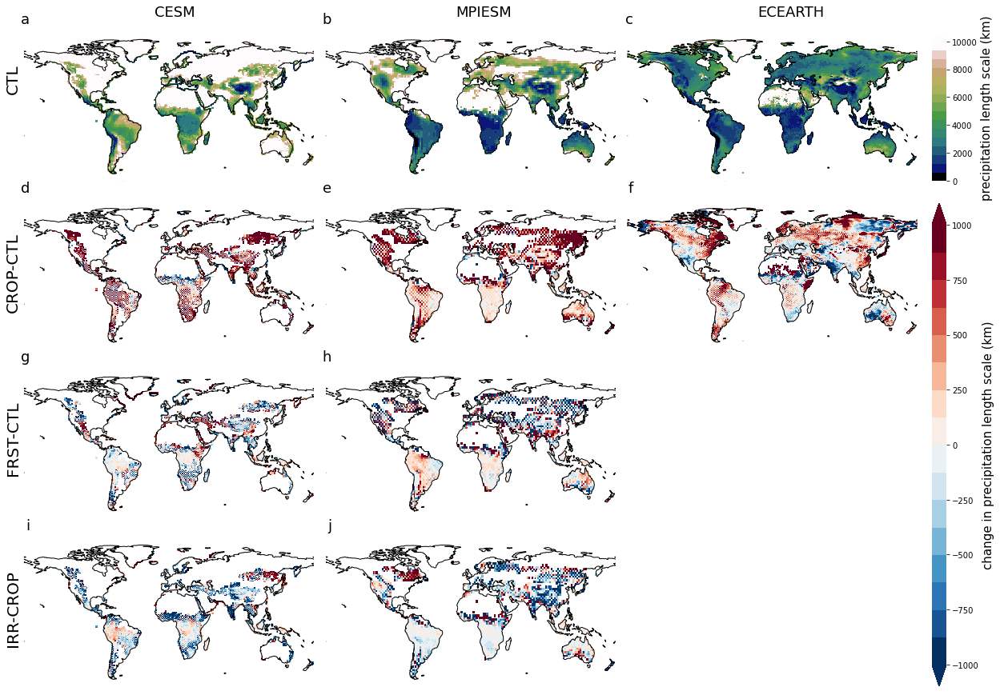

In [25]:
#matplotlib.rc('xtick', labelsize=20) 
#matplotlib.rc('ytick', labelsize=20) 
plt.rcParams['figure.figsize'] = [20, 15]

mpl.rc('axes',edgecolor='none')
k=0
fig = plt.figure()
gs = fig.add_gridspec(4,3)
cmap='RdBu_r'
cmap2='gist_earth'
#cmap2='ocean_r'
for model in ['cesm','mpiesm','ecearth']:
    i=0
    k=k+1
    if model=='cesm':
        da_list=[lambda_rho_CTL,lambda_rho_DEF,lambda_rho_AFF,lambda_rho_IRR]
        pan_list=['a','d','g','i']
    elif model =='ecearth':
        da_list=[lambda_rho_CTL_ec,lambda_rho_DEF_ec]
        pan_list=['c','f']
    elif model =='mpiesm':
        da_list=[lambda_rho_CTL_mpi,lambda_rho_DEF_mpi,lambda_rho_AFF_mpi,lambda_rho_IRR_mpi]
        pan_list=['b','e','h','j']
    for da in da_list:
        if i==0:
            change='CTL'
        elif i==1:
            change='CROP-CTL'
        elif i==2:
            change='FRST-CTL'
        elif i==3:
            change='IRR-CROP'
        i=i+1
#        plot_lims = [da.min(), da.max()]
        plot_lims = [-1000,1000]
        plot_lims2=  [0,10000]
        # define colorbar levels
        ax = fig.add_subplot(gs[i-1,k-1], projection=ccrs.PlateCarree())
        levels = np.arange(plot_lims[0], plot_lims[1]+30, 30)
        levels2 = np.arange(plot_lims2[0], plot_lims2[1]+30, 30)
        #levels=[-2, -1.75, -1.5, -1.25,-1,-0.75, -0.5,-0.25, 0,0.25, 0.5,0.75, 1,1.25, 1.5,1.75, 2]
        # define colormap (more info on colormaps: https://matplotlib.org/users/colormaps.html)

          #cmap, norm = mpu.from_levels_and_cmap(levels, 'RdBu_r', extend='both')
        cbar_label = 'km'

           # add the coastlines to the plot

        ax.coastlines()
        # plot data array as a map, with the previously defined argumnets
        if i==1:
            h=da.plot(ax=ax, cmap=plt.cm.get_cmap(cmap2, 16), vmin=plot_lims2[0], vmax=plot_lims2[1], add_colorbar=False,label=model)
            if k==3:
                ax3=ax
                cbar2 = mpu.colorbar(h, ax1=ax3, shift=0., size=0.05, orientation='vertical',extend='max')
                cbar2.set_label(label='precipitation length scale ('+cbar_label+')', size=15)
        if i!=1:
            h=da.plot(ax=ax, cmap=plt.cm.get_cmap(cmap, 16), vmin=plot_lims[0], vmax=plot_lims[1], add_colorbar=False,label=model)
        ax.set_aspect('auto')
        # set the extent of the cartopy geoAxes to \"global\"
          #ax.set_global()

          # or alternatively, if you want to plot a certain region, use (example: Europe)
        ax.set_extent([-180, 180, -63, 89], ccrs.PlateCarree())
        if i==2:
            if k==2:
                ax_2=ax
        if i==1:
            ax.text(0.45,1.2,model.upper(), transform=ax.transAxes,fontsize=18, va='top', ha='left') 
        ax.set_title('')
        if model=='cesm':
            ax.text(0.02, 1.15, pan_list[i-1], transform=ax.transAxes,fontsize=18, va='top', ha='right')
            if k==1:
                ax.text(-0.01, 0.8, change, transform=ax.transAxes,fontsize=20, va='top', ha='right',rotation='vertical')
        elif model=='mpiesm':
            ax.text(0.02, 1.15, pan_list[i-1], transform=ax.transAxes,fontsize=18, va='top', ha='right')
        elif model=='ecearth':
            ax.text(0.02, 1.15, pan_list[i-1], transform=ax.transAxes,fontsize=18, va='top', ha='right')
        
ax_old = plt.subplot(gs[3, 2])
ax_old.set_xticks([])
ax_old.set_yticks([])
cbar = mpu.colorbar(h, ax1=ax_old,ax2=ax_2, shift=0., size=0.05, orientation='vertical',extend='both')
cbar.set_label(label='change in precipitation length scale ('+cbar_label+')', size=15)
#cbar.ax.tick_params(labelsize=13) 
fig.subplots_adjust(hspace=0.15, wspace=0.04)


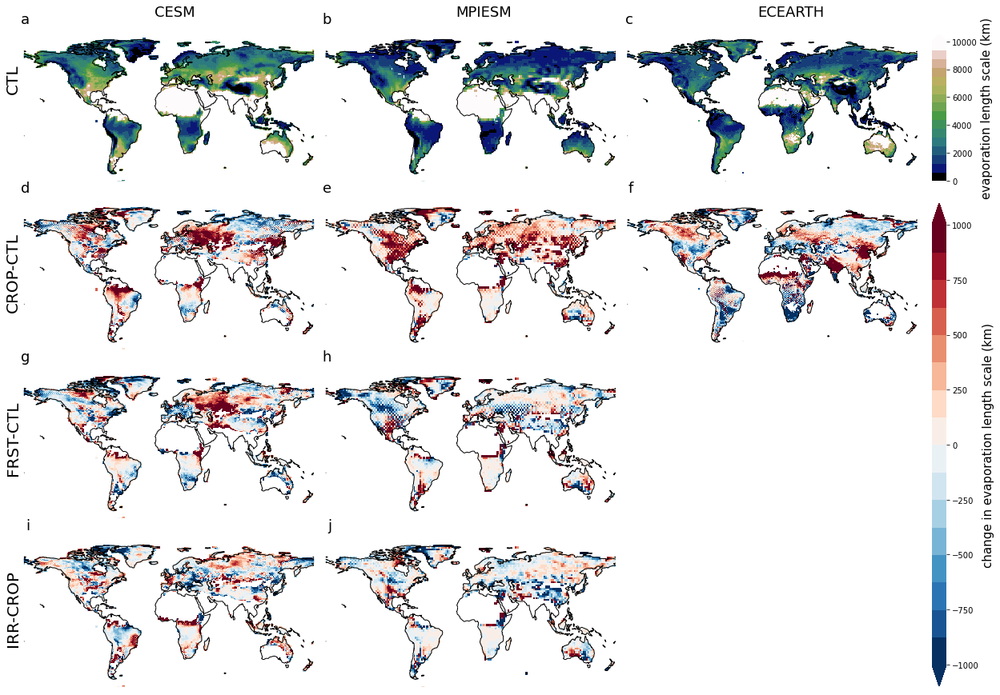

In [36]:
##seasonal (JJA)
cut=7000
lambda_rho_AFF_jja=xr.where(lambda_rho_CTL_jja<cut,lambda_rho_AFF_jja,np.nan)  ##only look at areas with high recycling rates
lambda_eps_AFF_jja=xr.where(lambda_eps_CTL_jja<cut,lambda_eps_AFF_jja,np.nan)

lambda_rho_DEF_jja=xr.where(lambda_rho_CTL_jja<cut,lambda_rho_DEF_jja,np.nan)  ##only look at areas with high recycling rates
lambda_eps_DEF_jja=xr.where(lambda_eps_CTL_jja<cut,lambda_eps_DEF_jja,np.nan)

lambda_rho_IRR_jja=xr.where(lambda_rho_CTL_jja<cut,lambda_rho_IRR_jja,np.nan)  ##only look at areas with high recycling rates
lambda_eps_IRR_jja=xr.where(lambda_eps_CTL_jja<cut,lambda_eps_IRR_jja,np.nan)

lambda_rho_DEF_ec_jja=xr.where(lambda_rho_CTL_ec_jja<cut,lambda_rho_DEF_ec_jja,np.nan)  ##only look at areas with high recycling rates
lambda_eps_DEF_ec_jja=xr.where(lambda_eps_CTL_ec_jja<cut,lambda_eps_DEF_ec_jja,np.nan)

lambda_rho_AFF_mpi_jja=xr.where(lambda_rho_CTL_mpi_jja<cut,lambda_rho_AFF_mpi_jja,np.nan)  ##only look at areas with high recycling rates
lambda_eps_AFF_mpi_jja=xr.where(lambda_eps_CTL_mpi_jja<cut,lambda_eps_AFF_mpi_jja,np.nan)

lambda_rho_DEF_mpi_jja=xr.where(lambda_rho_CTL_mpi_jja<cut,lambda_rho_DEF_mpi_jja,np.nan)  ##only look at areas with high recycling rates
lambda_eps_DEF_mpi_jja=xr.where(lambda_eps_CTL_mpi_jja<cut,lambda_eps_DEF_mpi_jja,np.nan)

lambda_rho_IRR_mpi_jja=xr.where(lambda_rho_CTL_mpi_jja<cut,lambda_rho_IRR_mpi_jja,np.nan)  ##only look at areas with high recycling rates
lambda_eps_IRR_mpi_jja=xr.where(lambda_eps_CTL_mpi_jja<cut,lambda_eps_IRR_mpi_jja,np.nan)


#matplotlib.rc('xtick', labelsize=20) 
#matplotlib.rc('ytick', labelsize=20) 
plt.rcParams['figure.figsize'] = [20, 15]

mpl.rc('axes',edgecolor='none')
k=0
fig = plt.figure()
gs = fig.add_gridspec(4,3)
cmap='RdBu_r'
cmap2='gist_earth'
#cmap2='ocean_r'

for model in ['cesm','mpiesm','ecearth']:
    i=0
    k=k+1
    if model=='cesm':
        da_list=[lambda_eps_CTL_jja,lambda_eps_DEF_jja,lambda_eps_AFF_jja,lambda_eps_IRR_jja]
        pan_list=['a','d','g','i']
    elif model =='ecearth':
        da_list=[lambda_eps_CTL_ec_jja,lambda_eps_DEF_ec_jja]
        pan_list=['c','f']
    elif model =='mpiesm':
        da_list=[lambda_eps_CTL_mpi_jja,lambda_eps_DEF_mpi_jja,lambda_eps_AFF_mpi_jja,lambda_eps_IRR_mpi_jja]
        pan_list=['b','e','h','j']
    for da in da_list:
        if i==0:
            change='CTL'
        elif i==1:
            change='CROP-CTL'
        elif i==2:
            change='FRST-CTL'
        elif i==3:
            change='IRR-CROP'
        i=i+1
#        plot_lims = [da.min(), da.max()]
        plot_lims = [-1000,1000]
        plot_lims2=  [0,10000]
        # define colorbar levels
        ax = fig.add_subplot(gs[i-1,k-1], projection=ccrs.PlateCarree())
        levels = np.arange(plot_lims[0], plot_lims[1]+30, 30)
        levels2 = np.arange(plot_lims2[0], plot_lims2[1]+30, 30)
        #levels=[-2, -1.75, -1.5, -1.25,-1,-0.75, -0.5,-0.25, 0,0.25, 0.5,0.75, 1,1.25, 1.5,1.75, 2]
        # define colormap (more info on colormaps: https://matplotlib.org/users/colormaps.html)

          #cmap, norm = mpu.from_levels_and_cmap(levels, 'RdBu_r', extend='both')
        cbar_label = 'km'

           # add the coastlines to the plot

        ax.coastlines()
        # plot data array as a map, with the previously defined argumnets
        if i==1:
            h=da.plot(ax=ax, cmap=plt.cm.get_cmap(cmap2, 16), vmin=plot_lims2[0], vmax=plot_lims2[1], add_colorbar=False,label=model)
            if k==3:
                ax3=ax
                cbar2 = mpu.colorbar(h, ax1=ax3, shift=0., size=0.05, orientation='vertical',extend='max')
                cbar2.set_label(label='evaporation length scale ('+cbar_label+')', size=15)
        if i!=1:
            h=da.plot(ax=ax, cmap=plt.cm.get_cmap(cmap, 16), vmin=plot_lims[0], vmax=plot_lims[1], add_colorbar=False,label=model)
        ax.set_aspect('auto')
        # set the extent of the cartopy geoAxes to \"global\"
          #ax.set_global()

          # or alternatively, if you want to plot a certain region, use (example: Europe)
        ax.set_extent([-180, 180, -63, 89], ccrs.PlateCarree())
        if i==2:
            if k==2:
                ax_2=ax
        if i==1:
            ax.text(0.45,1.2,model.upper(), transform=ax.transAxes,fontsize=18, va='top', ha='left') 
        ax.set_title('')
        if model=='cesm':
            ax.text(0.02, 1.15, pan_list[i-1], transform=ax.transAxes,fontsize=18, va='top', ha='right')
            if k==1:
                ax.text(-0.01, 0.8, change, transform=ax.transAxes,fontsize=20, va='top', ha='right',rotation='vertical')
        elif model=='mpiesm':
            ax.text(0.02, 1.15, pan_list[i-1], transform=ax.transAxes,fontsize=18, va='top', ha='right')
        elif model=='ecearth':
            ax.text(0.02, 1.15, pan_list[i-1], transform=ax.transAxes,fontsize=18, va='top', ha='right')
        
ax_old = plt.subplot(gs[3, 2])
ax_old.set_xticks([])
ax_old.set_yticks([])
cbar = mpu.colorbar(h, ax1=ax_old,ax2=ax_2, shift=0., size=0.05, orientation='vertical',extend='both')
cbar.set_label(label='change in evaporation length scale ('+cbar_label+')', size=15)
#cbar.ax.tick_params(labelsize=13) 
fig.subplots_adjust(hspace=0.15, wspace=0.04)


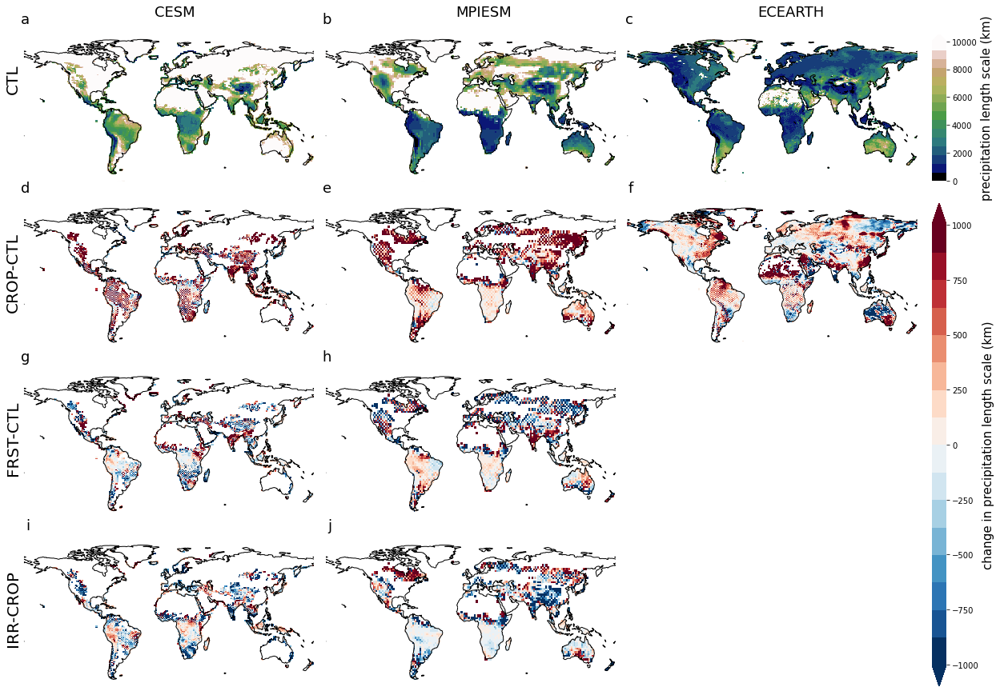

In [37]:
#matplotlib.rc('xtick', labelsize=20) 
#matplotlib.rc('ytick', labelsize=20) 
plt.rcParams['figure.figsize'] = [20, 15]

mpl.rc('axes',edgecolor='none')
k=0
fig = plt.figure()
gs = fig.add_gridspec(4,3)
cmap='RdBu_r'
cmap2='gist_earth'
#cmap2='ocean_r'
for model in ['cesm','mpiesm','ecearth']:
    i=0
    k=k+1
    if model=='cesm':
        da_list=[lambda_rho_CTL_jja,lambda_rho_DEF_jja,lambda_rho_AFF_jja,lambda_rho_IRR_jja]
        pan_list=['a','d','g','i']
    elif model =='ecearth':
        da_list=[lambda_rho_CTL_ec_jja,lambda_rho_DEF_ec_jja]
        pan_list=['c','f']
    elif model =='mpiesm':
        da_list=[lambda_rho_CTL_mpi_jja,lambda_rho_DEF_mpi_jja,lambda_rho_AFF_mpi_jja,lambda_rho_IRR_mpi_jja]
        pan_list=['b','e','h','j']
    for da in da_list:
        if i==0:
            change='CTL'
        elif i==1:
            change='CROP-CTL'
        elif i==2:
            change='FRST-CTL'
        elif i==3:
            change='IRR-CROP'
        i=i+1
#        plot_lims = [da.min(), da.max()]
        plot_lims = [-1000,1000]
        plot_lims2=  [0,10000]
        # define colorbar levels
        ax = fig.add_subplot(gs[i-1,k-1], projection=ccrs.PlateCarree())
        levels = np.arange(plot_lims[0], plot_lims[1]+30, 30)
        levels2 = np.arange(plot_lims2[0], plot_lims2[1]+30, 30)
        #levels=[-2, -1.75, -1.5, -1.25,-1,-0.75, -0.5,-0.25, 0,0.25, 0.5,0.75, 1,1.25, 1.5,1.75, 2]
        # define colormap (more info on colormaps: https://matplotlib.org/users/colormaps.html)

          #cmap, norm = mpu.from_levels_and_cmap(levels, 'RdBu_r', extend='both')
        cbar_label = 'km'

           # add the coastlines to the plot

        ax.coastlines()
        # plot data array as a map, with the previously defined argumnets
        if i==1:
            h=da.plot(ax=ax, cmap=plt.cm.get_cmap(cmap2, 16), vmin=plot_lims2[0], vmax=plot_lims2[1], add_colorbar=False,label=model)
            if k==3:
                ax3=ax
                cbar2 = mpu.colorbar(h, ax1=ax3, shift=0., size=0.05, orientation='vertical',extend='max')
                cbar2.set_label(label='precipitation length scale ('+cbar_label+')', size=15)
        if i!=1:
            h=da.plot(ax=ax, cmap=plt.cm.get_cmap(cmap, 16), vmin=plot_lims[0], vmax=plot_lims[1], add_colorbar=False,label=model)
        ax.set_aspect('auto')
        # set the extent of the cartopy geoAxes to \"global\"
          #ax.set_global()

          # or alternatively, if you want to plot a certain region, use (example: Europe)
        ax.set_extent([-180, 180, -63, 89], ccrs.PlateCarree())
        if i==2:
            if k==2:
                ax_2=ax
        if i==1:
            ax.text(0.45,1.2,model.upper(), transform=ax.transAxes,fontsize=18, va='top', ha='left') 
        ax.set_title('')
        if model=='cesm':
            ax.text(0.02, 1.15, pan_list[i-1], transform=ax.transAxes,fontsize=18, va='top', ha='right')
            if k==1:
                ax.text(-0.01, 0.8, change, transform=ax.transAxes,fontsize=20, va='top', ha='right',rotation='vertical')
        elif model=='mpiesm':
            ax.text(0.02, 1.15, pan_list[i-1], transform=ax.transAxes,fontsize=18, va='top', ha='right')
        elif model=='ecearth':
            ax.text(0.02, 1.15, pan_list[i-1], transform=ax.transAxes,fontsize=18, va='top', ha='right')
        
ax_old = plt.subplot(gs[3, 2])
ax_old.set_xticks([])
ax_old.set_yticks([])
cbar = mpu.colorbar(h, ax1=ax_old,ax2=ax_2, shift=0., size=0.05, orientation='vertical',extend='both')
cbar.set_label(label='change in precipitation length scale ('+cbar_label+')', size=15)
#cbar.ax.tick_params(labelsize=13) 
fig.subplots_adjust(hspace=0.15, wspace=0.04)


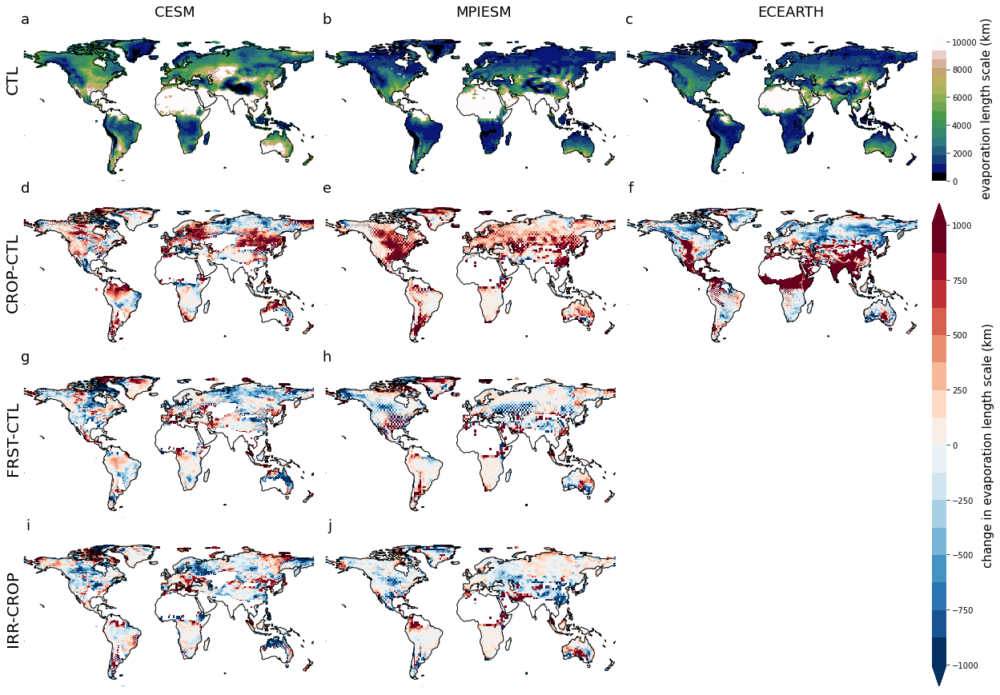

In [47]:
##seasonal (DJF)
cut=7000
lambda_rho_AFF_djf=xr.where(lambda_rho_CTL_djf<cut,lambda_rho_AFF_djf,np.nan)  ##only look at areas with high recycling rates
lambda_eps_AFF_djf=xr.where(lambda_eps_CTL_djf<cut,lambda_eps_AFF_djf,np.nan)

lambda_rho_DEF_djf=xr.where(lambda_rho_CTL_djf<cut,lambda_rho_DEF_djf,np.nan)  ##only look at areas with high recycling rates
lambda_eps_DEF_djf=xr.where(lambda_eps_CTL_djf<cut,lambda_eps_DEF_djf,np.nan)

lambda_rho_IRR_djf=xr.where(lambda_rho_CTL_djf<cut,lambda_rho_IRR_djf,np.nan)  ##only look at areas with high recycling rates
lambda_eps_IRR_djf=xr.where(lambda_eps_CTL_djf<cut,lambda_eps_IRR_djf,np.nan)

lambda_rho_DEF_ec_djf=xr.where(lambda_rho_CTL_ec_djf<cut,lambda_rho_DEF_ec_djf,np.nan)  ##only look at areas with high recycling rates
lambda_eps_DEF_ec_djf=xr.where(lambda_eps_CTL_ec_djf<cut,lambda_eps_DEF_ec_djf,np.nan)

lambda_rho_AFF_mpi_djf=xr.where(lambda_rho_CTL_mpi_djf<cut,lambda_rho_AFF_mpi_djf,np.nan)  ##only look at areas with high recycling rates
lambda_eps_AFF_mpi_djf=xr.where(lambda_eps_CTL_mpi_djf<cut,lambda_eps_AFF_mpi_djf,np.nan)

lambda_rho_DEF_mpi_djf=xr.where(lambda_rho_CTL_mpi_djf<cut,lambda_rho_DEF_mpi_djf,np.nan)  ##only look at areas with high recycling rates
lambda_eps_DEF_mpi_djf=xr.where(lambda_eps_CTL_mpi_djf<cut,lambda_eps_DEF_mpi_djf,np.nan)

lambda_rho_IRR_mpi_djf=xr.where(lambda_rho_CTL_mpi_djf<cut,lambda_rho_IRR_mpi_djf,np.nan)  ##only look at areas with high recycling rates
lambda_eps_IRR_mpi_djf=xr.where(lambda_eps_CTL_mpi_djf<cut,lambda_eps_IRR_mpi_djf,np.nan)


#matplotlib.rc('xtick', labelsize=20) 
#matplotlib.rc('ytick', labelsize=20) 
plt.rcParams['figure.figsize'] = [20, 15]

mpl.rc('axes',edgecolor='none')
k=0
fig = plt.figure()
gs = fig.add_gridspec(4,3)
cmap='RdBu_r'
cmap2='gist_earth'
#cmap2='ocean_r'

for model in ['cesm','mpiesm','ecearth']:
    i=0
    k=k+1
    if model=='cesm':
        da_list=[lambda_eps_CTL_djf,lambda_eps_DEF_djf,lambda_eps_AFF_djf,lambda_eps_IRR_djf]
        pan_list=['a','d','g','i']
    elif model =='ecearth':
        da_list=[lambda_eps_CTL_ec_djf,lambda_eps_DEF_ec_djf]
        pan_list=['c','f']
    elif model =='mpiesm':
        da_list=[lambda_eps_CTL_mpi_djf,lambda_eps_DEF_mpi_djf,lambda_eps_AFF_mpi_djf,lambda_eps_IRR_mpi_djf]
        pan_list=['b','e','h','j']
    for da in da_list:
        if i==0:
            change='CTL'
        elif i==1:
            change='CROP-CTL'
        elif i==2:
            change='FRST-CTL'
        elif i==3:
            change='IRR-CROP'
        i=i+1
#        plot_lims = [da.min(), da.max()]
        plot_lims = [-1000,1000]
        plot_lims2=  [0,10000]
        # define colorbar levels
        ax = fig.add_subplot(gs[i-1,k-1], projection=ccrs.PlateCarree())
        levels = np.arange(plot_lims[0], plot_lims[1]+30, 30)
        levels2 = np.arange(plot_lims2[0], plot_lims2[1]+30, 30)
        #levels=[-2, -1.75, -1.5, -1.25,-1,-0.75, -0.5,-0.25, 0,0.25, 0.5,0.75, 1,1.25, 1.5,1.75, 2]
        # define colormap (more info on colormaps: https://matplotlib.org/users/colormaps.html)

          #cmap, norm = mpu.from_levels_and_cmap(levels, 'RdBu_r', extend='both')
        cbar_label = 'km'

           # add the coastlines to the plot

        ax.coastlines()
        # plot data array as a map, with the previously defined argumnets
        if i==1:
            h=da.plot(ax=ax, cmap=plt.cm.get_cmap(cmap2, 16), vmin=plot_lims2[0], vmax=plot_lims2[1], add_colorbar=False,label=model)
            if k==3:
                ax3=ax
                cbar2 = mpu.colorbar(h, ax1=ax3, shift=0., size=0.05, orientation='vertical',extend='max')
                cbar2.set_label(label='evaporation length scale ('+cbar_label+')', size=15)
        if i!=1:
            h=da.plot(ax=ax, cmap=plt.cm.get_cmap(cmap, 16), vmin=plot_lims[0], vmax=plot_lims[1], add_colorbar=False,label=model)
        ax.set_aspect('auto')
        # set the extent of the cartopy geoAxes to \"global\"
          #ax.set_global()

          # or alternatively, if you want to plot a certain region, use (example: Europe)
        ax.set_extent([-180, 180, -63, 89], ccrs.PlateCarree())
        if i==2:
            if k==2:
                ax_2=ax
        if i==1:
            ax.text(0.45,1.2,model.upper(), transform=ax.transAxes,fontsize=18, va='top', ha='left') 
        ax.set_title('')
        if model=='cesm':
            ax.text(0.02, 1.15, pan_list[i-1], transform=ax.transAxes,fontsize=18, va='top', ha='right')
            if k==1:
                ax.text(-0.01, 0.8, change, transform=ax.transAxes,fontsize=20, va='top', ha='right',rotation='vertical')
        elif model=='mpiesm':
            ax.text(0.02, 1.15, pan_list[i-1], transform=ax.transAxes,fontsize=18, va='top', ha='right')
        elif model=='ecearth':
            ax.text(0.02, 1.15, pan_list[i-1], transform=ax.transAxes,fontsize=18, va='top', ha='right')
        
ax_old = plt.subplot(gs[3, 2])
ax_old.set_xticks([])
ax_old.set_yticks([])
cbar = mpu.colorbar(h, ax1=ax_old,ax2=ax_2, shift=0., size=0.05, orientation='vertical',extend='both')
cbar.set_label(label='change in evaporation length scale ('+cbar_label+')', size=15)
#cbar.ax.tick_params(labelsize=13) 
fig.subplots_adjust(hspace=0.15, wspace=0.04)


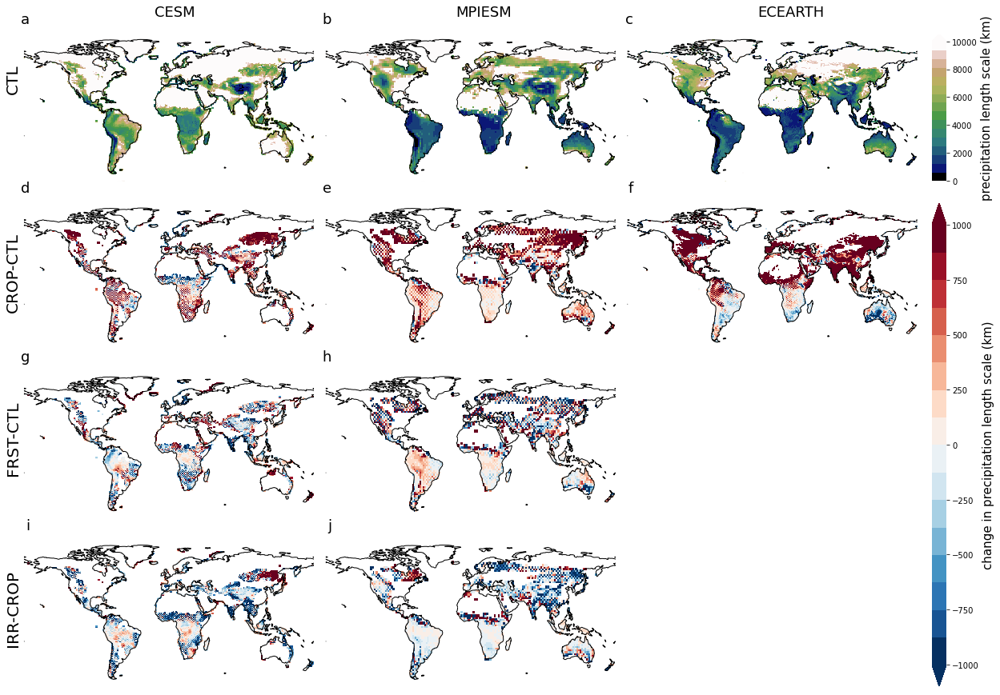

In [48]:
#matplotlib.rc('xtick', labelsize=20) 
#matplotlib.rc('ytick', labelsize=20) 
plt.rcParams['figure.figsize'] = [20, 15]

mpl.rc('axes',edgecolor='none')
k=0
fig = plt.figure()
gs = fig.add_gridspec(4,3)
cmap='RdBu_r'
cmap2='gist_earth'
#cmap2='ocean_r'
for model in ['cesm','mpiesm','ecearth']:
    i=0
    k=k+1
    if model=='cesm':
        da_list=[lambda_rho_CTL_djf,lambda_rho_DEF_djf,lambda_rho_AFF_djf,lambda_rho_IRR_djf]
        pan_list=['a','d','g','i']
    elif model =='ecearth':
        da_list=[lambda_rho_CTL_ec_djf,lambda_rho_DEF_ec_djf]
        pan_list=['c','f']
    elif model =='mpiesm':
        da_list=[lambda_rho_CTL_mpi_djf,lambda_rho_DEF_mpi_djf,lambda_rho_AFF_mpi_djf,lambda_rho_IRR_mpi_djf]
        pan_list=['b','e','h','j']
    for da in da_list:
        if i==0:
            change='CTL'
        elif i==1:
            change='CROP-CTL'
        elif i==2:
            change='FRST-CTL'
        elif i==3:
            change='IRR-CROP'
        i=i+1
#        plot_lims = [da.min(), da.max()]
        plot_lims = [-1000,1000]
        plot_lims2=  [0,10000]
        # define colorbar levels
        ax = fig.add_subplot(gs[i-1,k-1], projection=ccrs.PlateCarree())
        levels = np.arange(plot_lims[0], plot_lims[1]+30, 30)
        levels2 = np.arange(plot_lims2[0], plot_lims2[1]+30, 30)
        #levels=[-2, -1.75, -1.5, -1.25,-1,-0.75, -0.5,-0.25, 0,0.25, 0.5,0.75, 1,1.25, 1.5,1.75, 2]
        # define colormap (more info on colormaps: https://matplotlib.org/users/colormaps.html)

          #cmap, norm = mpu.from_levels_and_cmap(levels, 'RdBu_r', extend='both')
        cbar_label = 'km'

           # add the coastlines to the plot

        ax.coastlines()
        # plot data array as a map, with the previously defined argumnets
        if i==1:
            h=da.plot(ax=ax, cmap=plt.cm.get_cmap(cmap2, 16), vmin=plot_lims2[0], vmax=plot_lims2[1], add_colorbar=False,label=model)
            if k==3:
                ax3=ax
                cbar2 = mpu.colorbar(h, ax1=ax3, shift=0., size=0.05, orientation='vertical',extend='max')
                cbar2.set_label(label='precipitation length scale ('+cbar_label+')', size=15)
        if i!=1:
            h=da.plot(ax=ax, cmap=plt.cm.get_cmap(cmap, 16), vmin=plot_lims[0], vmax=plot_lims[1], add_colorbar=False,label=model)
        ax.set_aspect('auto')
        # set the extent of the cartopy geoAxes to \"global\"
          #ax.set_global()

          # or alternatively, if you want to plot a certain region, use (example: Europe)
        ax.set_extent([-180, 180, -63, 89], ccrs.PlateCarree())
        if i==2:
            if k==2:
                ax_2=ax
        if i==1:
            ax.text(0.45,1.2,model.upper(), transform=ax.transAxes,fontsize=18, va='top', ha='left') 
        ax.set_title('')
        if model=='cesm':
            ax.text(0.02, 1.15, pan_list[i-1], transform=ax.transAxes,fontsize=18, va='top', ha='right')
            if k==1:
                ax.text(-0.01, 0.8, change, transform=ax.transAxes,fontsize=20, va='top', ha='right',rotation='vertical')
        elif model=='mpiesm':
            ax.text(0.02, 1.15, pan_list[i-1], transform=ax.transAxes,fontsize=18, va='top', ha='right')
        elif model=='ecearth':
            ax.text(0.02, 1.15, pan_list[i-1], transform=ax.transAxes,fontsize=18, va='top', ha='right')
        
ax_old = plt.subplot(gs[3, 2])
ax_old.set_xticks([])
ax_old.set_yticks([])
cbar = mpu.colorbar(h, ax1=ax_old,ax2=ax_2, shift=0., size=0.05, orientation='vertical',extend='both')
cbar.set_label(label='change in precipitation length scale ('+cbar_label+')', size=15)
#cbar.ax.tick_params(labelsize=13) 
fig.subplots_adjust(hspace=0.15, wspace=0.04)


### compute recycling metrics for seasons

In [18]:
###compute length scales (CTL only)

#recycling metrics
rho_r_total_jja= P_track_CTL_jja/P_CTL_jja
eps_r_total_jja= P_track_CTL_jja/E_CTL_jja

E_CTL_jja = xr.DataArray(E_CTL_jja, coords= [llat, llon], dims= ["lat", "lon"])
P_track_CTL_jja = xr.DataArray(P_track_CTL_jja, coords= [llat, llon], dims= ["lat", "lon"])
rho_r_CTL_jja = xr.DataArray(rho_r_total_jja, coords= [llat, llon], dims= ["lat", "lon"])
eps_r_CTL_jja = xr.DataArray(eps_r_total_jja, coords= [llat, llon], dims= ["lat", "lon"])

rho_r_total_djf= P_track_CTL_djf/P_CTL_djf
eps_r_total_djf= P_track_CTL_djf/E_CTL_djf

E_CTL_djf = xr.DataArray(E_CTL_djf, coords= [llat, llon], dims= ["lat", "lon"])
P_track_CTL_djf = xr.DataArray(P_track_CTL_djf, coords= [llat, llon], dims= ["lat", "lon"])
rho_r_CTL_djf = xr.DataArray(rho_r_total_djf, coords= [llat, llon], dims= ["lat", "lon"])
eps_r_CTL_djf = xr.DataArray(eps_r_total_djf, coords= [llat, llon], dims= ["lat", "lon"])

rho_r_total_jja= P_track_FRST_jja/P_FRST_jja
eps_r_total_jja= P_track_FRST_jja/E_FRST_jja

E_FRST_jja = xr.DataArray(E_FRST_jja, coords= [llat, llon], dims= ["lat", "lon"])
P_track_FRST_jja = xr.DataArray(P_track_FRST_jja, coords= [llat, llon], dims= ["lat", "lon"])
rho_r_FRST_jja = xr.DataArray(rho_r_total_jja, coords= [llat, llon], dims= ["lat", "lon"])
eps_r_FRST_jja = xr.DataArray(eps_r_total_jja, coords= [llat, llon], dims= ["lat", "lon"])


rho_r_total_djf= P_track_FRST_djf/P_FRST_djf
eps_r_total_djf= P_track_FRST_djf/E_FRST_djf

E_FRST_djf = xr.DataArray(E_FRST_djf, coords= [llat, llon], dims= ["lat", "lon"])
P_track_FRST_djf = xr.DataArray(P_track_FRST_djf, coords= [llat, llon], dims= ["lat", "lon"])
rho_r_FRST_djf = xr.DataArray(rho_r_total_djf, coords= [llat, llon], dims= ["lat", "lon"])
eps_r_FRST_djf = xr.DataArray(eps_r_total_djf, coords= [llat, llon], dims= ["lat", "lon"])

rho_r_total_jja= P_track_CROP_jja/P_CROP_jja
eps_r_total_jja= P_track_CROP_jja/E_CROP_jja

E_CROP_jja = xr.DataArray(E_CROP_jja, coords= [llat, llon], dims= ["lat", "lon"])
P_track_CROP_jja = xr.DataArray(P_track_CROP_jja, coords= [llat, llon], dims= ["lat", "lon"])
rho_r_CROP_jja = xr.DataArray(rho_r_total_jja, coords= [llat, llon], dims= ["lat", "lon"])
eps_r_CROP_jja = xr.DataArray(eps_r_total_jja, coords= [llat, llon], dims= ["lat", "lon"])


rho_r_total_djf= P_track_CROP_djf/P_CROP_djf
eps_r_total_djf= P_track_CROP_djf/E_CROP_djf

E_CROP_djf = xr.DataArray(E_CROP_djf, coords= [llat, llon], dims= ["lat", "lon"])
P_track_CROP_djf = xr.DataArray(P_track_CROP_djf, coords= [llat, llon], dims= ["lat", "lon"])
rho_r_CROP_djf = xr.DataArray(rho_r_total_djf, coords= [llat, llon], dims= ["lat", "lon"])
eps_r_CROP_djf = xr.DataArray(eps_r_total_djf, coords= [llat, llon], dims= ["lat", "lon"])

rho_r_total_jja= P_track_IRRIG_jja/P_IRRIG_jja
eps_r_total_jja= P_track_IRRIG_jja/E_IRRIG_jja

E_IRRIG_jja = xr.DataArray(E_IRRIG_jja, coords= [llat, llon], dims= ["lat", "lon"])
P_track_IRRIG_jja = xr.DataArray(P_track_IRRIG_jja, coords= [llat, llon], dims= ["lat", "lon"])
rho_r_IRRIG_jja = xr.DataArray(rho_r_total_jja, coords= [llat, llon], dims= ["lat", "lon"])
eps_r_IRRIG_jja = xr.DataArray(eps_r_total_jja, coords= [llat, llon], dims= ["lat", "lon"])


rho_r_total_djf= P_track_IRRIG_djf/P_IRRIG_djf
eps_r_total_djf= P_track_IRRIG_djf/E_IRRIG_djf

E_IRRIG_djf = xr.DataArray(E_IRRIG_djf, coords= [llat, llon], dims= ["lat", "lon"])
P_track_IRRIG_djf = xr.DataArray(P_track_IRRIG_djf, coords= [llat, llon], dims= ["lat", "lon"])
rho_r_IRRIG_djf = xr.DataArray(rho_r_total_djf, coords= [llat, llon], dims= ["lat", "lon"])
eps_r_IRRIG_djf = xr.DataArray(eps_r_total_djf, coords= [llat, llon], dims= ["lat", "lon"])

rho_r_CTL_jja, da_mask = xr.align(rho_r_CTL_jja, da_mask, join="override")
rho_r_CTL_jja=xr.where(da_mask==1,rho_r_CTL_jja,np.nan)

rho_r_CTL_djf, da_mask = xr.align(rho_r_CTL_djf, da_mask, join="override")
rho_r_CTL_djf=xr.where(da_mask==1,rho_r_CTL_djf,np.nan)

rho_r_CROP_jja, da_mask = xr.align(rho_r_CROP_jja, da_mask, join="override")
rho_r_CROP_jja=xr.where(da_mask==1,rho_r_CROP_jja,np.nan)

rho_r_CROP_djf, da_mask = xr.align(rho_r_CROP_djf, da_mask, join="override")
rho_r_CROP_djf=xr.where(da_mask==1,rho_r_CROP_djf,np.nan)

rho_r_FRST_jja, da_mask = xr.align(rho_r_FRST_jja, da_mask, join="override")
rho_r_FRST_jja=xr.where(da_mask==1,rho_r_FRST_jja,np.nan)

rho_r_FRST_djf, da_mask = xr.align(rho_r_FRST_djf, da_mask, join="override")
rho_r_FRST_djf=xr.where(da_mask==1,rho_r_FRST_djf,np.nan)

rho_r_IRRIG_jja, da_mask = xr.align(rho_r_IRRIG_jja, da_mask, join="override")
rho_r_IRRIG_jja=xr.where(da_mask==1,rho_r_IRRIG_jja,np.nan)

rho_r_IRRIG_djf, da_mask = xr.align(rho_r_IRRIG_djf, da_mask, join="override")
rho_r_IRRIG_djf=xr.where(da_mask==1,rho_r_IRRIG_djf,np.nan)

eps_r_CTL_jja, da_mask = xr.align(eps_r_CTL_jja, da_mask, join="override")
eps_r_CTL_jja=xr.where(da_mask==1,eps_r_CTL_jja,np.nan)

eps_r_CTL_djf, da_mask = xr.align(eps_r_CTL_djf, da_mask, join="override")
eps_r_CTL_djf=xr.where(da_mask==1,eps_r_CTL_djf,np.nan)

eps_r_CROP_jja, da_mask = xr.align(eps_r_CROP_jja, da_mask, join="override")
eps_r_CROP_jja=xr.where(da_mask==1,eps_r_CROP_jja,np.nan)

eps_r_CROP_djf, da_mask = xr.align(eps_r_CROP_djf, da_mask, join="override")
eps_r_CROP_djf=xr.where(da_mask==1,eps_r_CROP_djf,np.nan)

eps_r_FRST_jja, da_mask = xr.align(eps_r_FRST_jja, da_mask, join="override")
eps_r_FRST_jja=xr.where(da_mask==1,eps_r_FRST_jja,np.nan)

eps_r_FRST_djf, da_mask = xr.align(eps_r_FRST_djf, da_mask, join="override")
eps_r_FRST_djf=xr.where(da_mask==1,eps_r_FRST_djf,np.nan)

eps_r_IRRIG_jja, da_mask = xr.align(eps_r_IRRIG_jja, da_mask, join="override")
eps_r_IRRIG_jja=xr.where(da_mask==1,eps_r_IRRIG_jja,np.nan)

eps_r_IRRIG_djf, da_mask = xr.align(eps_r_IRRIG_djf, da_mask, join="override")
eps_r_IRRIG_djf=xr.where(da_mask==1,eps_r_IRRIG_djf,np.nan)



rho_r_DJF_jja=rho_r_CROP_jja-rho_r_CTL_jja
rho_r_AFF_jja=rho_r_FRST_jja-rho_r_CTL_jja

eps_r_DJF_jja=eps_r_CROP_jja-eps_r_CTL_jja
eps_r_AFF_jja=eps_r_FRST_jja-eps_r_CTL_jja

rho_r_IRR_jja=rho_r_IRRIG_jja-rho_r_CROP_jja
eps_r_IRR_jja=eps_r_IRRIG_jja-eps_r_CROP_jja

rho_r_DJF_djf=rho_r_CROP_djf-rho_r_CTL_djf
rho_r_AFF_djf=rho_r_FRST_djf-rho_r_CTL_djf

eps_r_DJF_djf=eps_r_CROP_djf-eps_r_CTL_djf
eps_r_AFF_djf=eps_r_FRST_djf-eps_r_CTL_djf

rho_r_IRR_djf=rho_r_IRRIG_djf-rho_r_CROP_djf
eps_r_IRR_djf=eps_r_IRRIG_djf-eps_r_CROP_djf



NameError: name 'P_track_CTL_jja' is not defined

In [10]:
#total fluxes
Fa_N_total_m2a=np.zeros_like(N_flux_CTL)
Fa_E_total_m2a=np.zeros_like(E_flux_CTL)
for i in range(len(latitude)):
    Fa_N_total_m2a[i,:]=(N_flux_CTL_jja[i,:]/(0.5*(L_N_gridcell[i]+L_S_gridcell[i])))/len(years) #Annual average flux per unit width (m3/m/a)

Fa_E_total_m2a = (E_flux_CTL_jja / L_EW_gridcell)/len(years); # Annual average flux per unit width (m3/m/a)


# Length scales! Watch out the ratio should be calculated with absolute fluxes
Zonal_to_total_ratio = np.abs(E_flux_CTL_jja) / (np.abs(E_flux_CTL_jja) + np.abs(N_flux_CTL_jja))
Meridional_to_total_ratio = np.abs(N_flux_CTL_jja) / (np.abs(E_flux_CTL_jja) + np.abs(N_flux_CTL_jja))


delta_x_zonal = mt.repmat(Width_gridcell,len(longitude),1) #km
delta_x_zonal=np.swapaxes(delta_x_zonal,0,1)
delta_x_meridional = mt.repmat(Height_gridcell,len(latitude),len(longitude)) #km

delta_x_CTL_jja = Zonal_to_total_ratio * delta_x_zonal + Meridional_to_total_ratio * delta_x_meridional #km

#total fluxes
Fa_N_total_m2a=np.zeros_like(N_flux_CROP)
Fa_E_total_m2a=np.zeros_like(E_flux_CROP)
for i in range(len(latitude)):
    Fa_N_total_m2a[i,:]=(N_flux_CROP_jja[i,:]/(0.5*(L_N_gridcell[i]+L_S_gridcell[i])))/len(years) #Annual average flux per unit width (m3/m/a)

Fa_E_total_m2a = (E_flux_CROP_jja / L_EW_gridcell)/len(years); # Annual average flux per unit width (m3/m/a)


# Length scales! Watch out the ratio should be calculated with absolute fluxes
Zonal_to_total_ratio = np.abs(E_flux_CROP_jja) / (np.abs(E_flux_CROP_jja) + np.abs(N_flux_CROP_jja))
Meridional_to_total_ratio = np.abs(N_flux_CROP_jja) / (np.abs(E_flux_CROP_jja) + np.abs(N_flux_CROP_jja))


delta_x_zonal = mt.repmat(Width_gridcell,len(longitude),1) #km
delta_x_zonal=np.swapaxes(delta_x_zonal,0,1)
delta_x_meridional = mt.repmat(Height_gridcell,len(latitude),len(longitude)) #km

delta_x_CROP_jja = Zonal_to_total_ratio * delta_x_zonal + Meridional_to_total_ratio * delta_x_meridional #km

#total fluxes
Fa_N_total_m2a=np.zeros_like(N_flux_FRST)
Fa_E_total_m2a=np.zeros_like(E_flux_FRST)
for i in range(len(latitude)):
    Fa_N_total_m2a[i,:]=(N_flux_FRST_jja[i,:]/(0.5*(L_N_gridcell[i]+L_S_gridcell[i])))/len(years) #Annual average flux per unit width (m3/m/a)

Fa_E_total_m2a = (E_flux_FRST_jja / L_EW_gridcell)/len(years); # Annual average flux per unit width (m3/m/a)


# Length scales! Watch out the ratio should be calculated with absolute fluxes
Zonal_to_total_ratio = np.abs(E_flux_FRST_jja) / (np.abs(E_flux_FRST_jja) + np.abs(N_flux_FRST_jja))
Meridional_to_total_ratio = np.abs(N_flux_FRST_jja) / (np.abs(E_flux_FRST_jja) + np.abs(N_flux_FRST_jja))


delta_x_zonal = mt.repmat(Width_gridcell,len(longitude),1) #km
delta_x_zonal=np.swapaxes(delta_x_zonal,0,1)
delta_x_meridional = mt.repmat(Height_gridcell,len(latitude),len(longitude)) #km

delta_x_FRST_jja = Zonal_to_total_ratio * delta_x_zonal + Meridional_to_total_ratio * delta_x_meridional #km


#total fluxes
Fa_N_total_m2a=np.zeros_like(N_flux_IRRIG)
Fa_E_total_m2a=np.zeros_like(E_flux_IRRIG)
for i in range(len(latitude)):
    Fa_N_total_m2a[i,:]=(N_flux_IRRIG_jja[i,:]/(0.5*(L_N_gridcell[i]+L_S_gridcell[i])))/len(years) #Annual average flux per unit width (m3/m/a)

Fa_E_total_m2a = (E_flux_IRRIG_jja / L_EW_gridcell)/len(years); # Annual average flux per unit width (m3/m/a)


# Length scales! Watch out the ratio should be calculated with absolute fluxes
Zonal_to_total_ratio = np.abs(E_flux_IRRIG_jja) / (np.abs(E_flux_IRRIG_jja) + np.abs(N_flux_IRRIG_jja))
Meridional_to_total_ratio = np.abs(N_flux_IRRIG_jja) / (np.abs(E_flux_IRRIG_jja) + np.abs(N_flux_IRRIG_jja))


delta_x_zonal = mt.repmat(Width_gridcell,len(longitude),1) #km
delta_x_zonal=np.swapaxes(delta_x_zonal,0,1)
delta_x_meridional = mt.repmat(Height_gridcell,len(latitude),len(longitude)) #km

delta_x_IRRIG_jja = Zonal_to_total_ratio * delta_x_zonal + Meridional_to_total_ratio * delta_x_meridional #km




NameError: name 'N_flux_CTL' is not defined

In [15]:
#compute length scales for def and jja


lambda_rho_CTL_jja = delta_x_CTL_jja / (scp.special.lambertw(np.exp(1/(rho_r_CTL_jja-1))/(rho_r_CTL_jja-1))+1/(1-rho_r_CTL_jja)) #km
lambda_eps_CTL_jja = delta_x_CTL_jja / (scp.special.lambertw(np.exp(1/(eps_r_CTL_jja-1))/(eps_r_CTL_jja-1))+1/(1-eps_r_CTL_jja)) #km

lambda_rho_CTL_jja = xr.DataArray(np.real(lambda_rho_CTL_jja), coords= [llat, llon], dims= ["lat", "lon"])
lambda_eps_CTL_jja = xr.DataArray(np.real(lambda_eps_CTL_jja), coords= [llat, llon], dims= ["lat", "lon"])


lambda_rho_CROP_jja = delta_x_CROP_jja / (scp.special.lambertw(np.exp(1/(rho_r_CROP_jja-1))/(rho_r_CROP_jja-1))+1/(1-rho_r_CROP_jja)) #km
lambda_eps_CROP_jja = delta_x_CROP_jja / (scp.special.lambertw(np.exp(1/(eps_r_CROP_jja-1))/(eps_r_CROP_jja-1))+1/(1-eps_r_CROP_jja)) #km

lambda_rho_CROP_jja = xr.DataArray(np.real(lambda_rho_CROP_jja), coords= [llat, llon], dims= ["lat", "lon"])
lambda_eps_CROP_jja = xr.DataArray(np.real(lambda_eps_CROP_jja), coords= [llat, llon], dims= ["lat", "lon"])


lambda_rho_FRST_jja = delta_x_FRST_jja / (scp.special.lambertw(np.exp(1/(rho_r_FRST_jja-1))/(rho_r_FRST_jja-1))+1/(1-rho_r_FRST_jja)) #km
lambda_eps_FRST_jja = delta_x_FRST_jja / (scp.special.lambertw(np.exp(1/(eps_r_FRST_jja-1))/(eps_r_FRST_jja-1))+1/(1-eps_r_FRST_jja)) #km

lambda_rho_FRST_jja = xr.DataArray(np.real(lambda_rho_FRST_jja), coords= [llat, llon], dims= ["lat", "lon"])
lambda_eps_FRST_jja = xr.DataArray(np.real(lambda_eps_FRST_jja), coords= [llat, llon], dims= ["lat", "lon"])


lambda_rho_IRRIG_jja = delta_x_IRRIG_jja / (scp.special.lambertw(np.exp(1/(rho_r_IRRIG_jja-1))/(rho_r_IRRIG_jja-1))+1/(1-rho_r_IRRIG_jja)) #km
lambda_eps_IRRIG_jja = delta_x_IRRIG_jja / (scp.special.lambertw(np.exp(1/(eps_r_IRRIG_jja-1))/(eps_r_IRRIG_jja-1))+1/(1-eps_r_IRRIG_jja)) #km

lambda_rho_IRRIG_jja = xr.DataArray(np.real(lambda_rho_IRRIG_jja), coords= [llat, llon], dims= ["lat", "lon"])
lambda_eps_IRRIG_jja = xr.DataArray(np.real(lambda_eps_IRRIG_jja), coords= [llat, llon], dims= ["lat", "lon"])

lambda_rho_CTL_djf = delta_x_CTL / (scp.special.lambertw(np.exp(1/(rho_r_CTL_djf-1))/(rho_r_CTL_djf-1))+1/(1-rho_r_CTL_djf)) #km
lambda_eps_CTL_djf = delta_x_CTL / (scp.special.lambertw(np.exp(1/(eps_r_CTL_djf-1))/(eps_r_CTL_djf-1))+1/(1-eps_r_CTL_djf)) #km

lambda_rho_CTL_djf = xr.DataArray(np.real(lambda_rho_CTL_djf), coords= [llat, llon], dims= ["lat", "lon"])
lambda_eps_CTL_djf = xr.DataArray(np.real(lambda_eps_CTL_djf), coords= [llat, llon], dims= ["lat", "lon"])


lambda_rho_CROP_djf = delta_x_CROP / (scp.special.lambertw(np.exp(1/(rho_r_CROP_djf-1))/(rho_r_CROP_djf-1))+1/(1-rho_r_CROP_djf)) #km
lambda_eps_CROP_djf = delta_x_CROP / (scp.special.lambertw(np.exp(1/(eps_r_CROP_djf-1))/(eps_r_CROP_djf-1))+1/(1-eps_r_CROP_djf)) #km

lambda_rho_CROP_djf = xr.DataArray(np.real(lambda_rho_CROP_djf), coords= [llat, llon], dims= ["lat", "lon"])
lambda_eps_CROP_djf = xr.DataArray(np.real(lambda_eps_CROP_djf), coords= [llat, llon], dims= ["lat", "lon"])


lambda_rho_FRST_djf = delta_x_FRST / (scp.special.lambertw(np.exp(1/(rho_r_FRST_djf-1))/(rho_r_FRST_djf-1))+1/(1-rho_r_FRST_djf)) #km
lambda_eps_FRST_djf = delta_x_FRST / (scp.special.lambertw(np.exp(1/(eps_r_FRST_djf-1))/(eps_r_FRST_djf-1))+1/(1-eps_r_FRST_djf)) #km

lambda_rho_FRST_djf = xr.DataArray(np.real(lambda_rho_FRST_djf), coords= [llat, llon], dims= ["lat", "lon"])
lambda_eps_FRST_djf = xr.DataArray(np.real(lambda_eps_FRST_djf), coords= [llat, llon], dims= ["lat", "lon"])


lambda_rho_IRRIG_djf = delta_x_IRRIG / (scp.special.lambertw(np.exp(1/(rho_r_IRRIG_djf-1))/(rho_r_IRRIG_djf-1))+1/(1-rho_r_IRRIG_djf)) #km
lambda_eps_IRRIG_djf = delta_x_IRRIG / (scp.special.lambertw(np.exp(1/(eps_r_IRRIG_djf-1))/(eps_r_IRRIG_djf-1))+1/(1-eps_r_IRRIG_djf)) #km

lambda_rho_IRRIG_djf = xr.DataArray(np.real(lambda_rho_IRRIG_djf), coords= [llat, llon], dims= ["lat", "lon"])
lambda_eps_IRRIG_djf = xr.DataArray(np.real(lambda_eps_IRRIG_djf), coords= [llat, llon], dims= ["lat", "lon"])


lambda_rho_AFF_jja= lambda_rho_FRST_jja- lambda_rho_CTL_jja
lambda_rho_DEF_jja= lambda_rho_CROP_jja-lambda_rho_CTL_jja
lambda_rho_IRR_jja= lambda_rho_IRRIG_jja-lambda_rho_CROP_jja

lambda_eps_AFF_jja= lambda_eps_FRST_jja- lambda_eps_CTL_jja
lambda_eps_DEF_jja= lambda_eps_CROP_jja-lambda_eps_CTL_jja
lambda_eps_IRR_jja= lambda_eps_IRRIG_jja-lambda_eps_CROP_jja

lambda_rho_AFF_djf= lambda_rho_FRST_djf- lambda_rho_CTL_djf
lambda_rho_DEF_djf= lambda_rho_CROP_djf-lambda_rho_CTL_djf
lambda_rho_IRR_djf= lambda_rho_IRRIG_djf-lambda_rho_CROP_djf

lambda_eps_AFF_djf= lambda_eps_FRST_djf- lambda_eps_CTL_djf
lambda_eps_DEF_djf= lambda_eps_CROP_djf-lambda_eps_CTL_djf
lambda_eps_IRR_djf= lambda_eps_IRRIG_djf-lambda_eps_CROP_djf


(192, 288)

In [11]:
ratio_P=xr.concat([rho_r_CTL, rho_r_CROP,rho_r_FRST,rho_r_IRRIG], pd.Index(["CTL","CROP","FRST","IRR"], name = "scenario"))
ratio_E=xr.concat([eps_r_CTL, eps_r_CROP,eps_r_FRST,eps_r_IRRIG], pd.Index(["CTL","CROP","FRST","IRR"], name = "scenario"))
ratio_P_E = xr.concat([ratio_P,ratio_E], pd.Index(["P", "E"], name = "Tracked"))



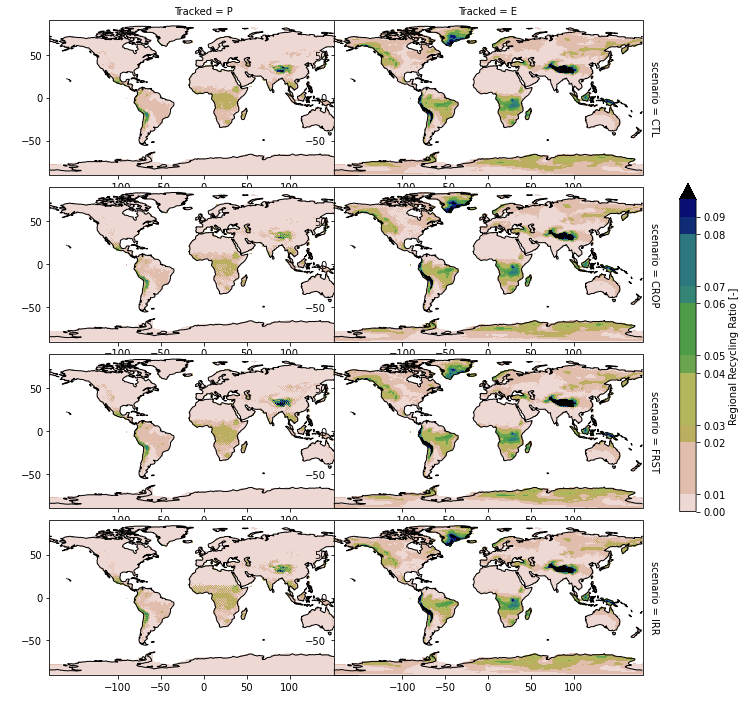

In [12]:
#PLOT RECYCLING RATIOS
ratio_P_E.lon.attrs["long_name"] = "Long"
ratio_P_E.lat.attrs["long_name"] = "Lat"
ratio_P_E.lon.attrs["units"] = "degrees"
ratio_P_E.lat.attrs["units"] = "degrees"
Facet = ratio_P_E.plot(x="lon", y="lat",  col = "Tracked", row = "scenario",
                              aspect=2.0, 
                              size=2.4,
                              robust=True, cmap = 'gist_earth_r',
                              cbar_kwargs={"label": "Regional Recycling Ratio [-]",
                                           'shrink' : 0.5,
                                           #'location': 'bottom',
                                           }, 
                              transform=ccrs.PlateCarree(), subplot_kws={"projection": ccrs.PlateCarree(central_longitude=0.0, globe=None)},
                              levels = np.round(np.arange(0,0.1,0.005),decimals = 2)
                              ) 
                         
# Only works if cartopy is activated: transform=ccrs.PlateCarree(), subplot_kws={"projection": ccrs.PlateCarree(central_longitude=0.0, globe=None)},
for ax in Facet.axes.flat:
    ax.coastlines()
    ax.set_ylabel(' ')
    ax.set_xlabel(' ')
    ax.set_xticks([-100, -50, 0, 50, 100])
    ax.set_yticks([-50, 0, 50])
    
plt.savefig('recyc_reg_ratios.png')

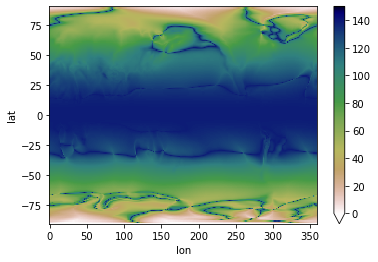

In [27]:
delta_x_CTL.plot(vmin=0,vmax=150,cmap = 'gist_earth_r')

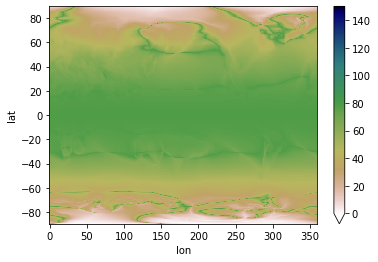

In [28]:
delta_x_CTL_ec.plot(vmin=0,vmax=150,cmap = 'gist_earth_r')

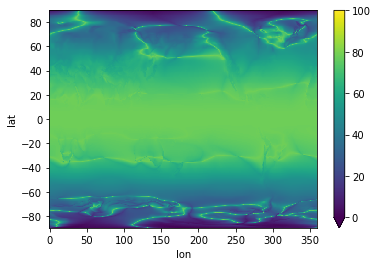

In [13]:
delta_x_CROP_ec.plot(vmin=0,vmax=100,cmap = 'gist_earth_r')

AttributeError: 'AxesSubplot' object has no attribute 'coastlines'

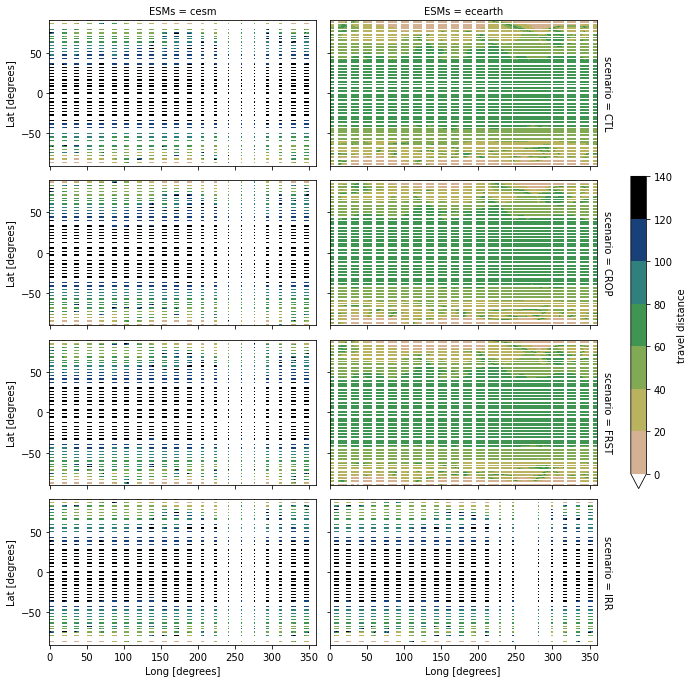

In [24]:
delta=xr.concat([delta_x_CTL, delta_x_CROP,delta_x_FRST,delta_x_IRRIG], pd.Index(["CTL","CROP","FRST","IRR"], name = "scenario"))
#delta_x_mpi=xr.concat([delta_x_CTL_mpi, delta_x_CROP_mpi,delta_x_FRST_mpi,delta_x_IRRIG_mpi], pd.Index(["CTL","CROP","FRST","IRR"], name = "scenario"))
delta_ec=xr.concat([delta_x_CTL_ec, delta_x_CROP_ec,delta_x_FRST_ec,delta_x_IRRIG], pd.Index(["CTL","CROP","FRST","IRR"], name = "scenario"))


ratio_P_E = xr.concat([delta_x,delta_x_ec], pd.Index(["cesm","ecearth"], name = "ESMs"))

#PLOT RECYCLING RATIOS
ratio_P_E.lon.attrs["long_name"] = "Long"
ratio_P_E.lat.attrs["long_name"] = "Lat"
ratio_P_E.lon.attrs["units"] = "degrees"
ratio_P_E.lat.attrs["units"] = "degrees"
Facet = ratio_P_E.plot(x="lon", y="lat",  col = "ESMs", row = "scenario",
                              aspect=2.0, 
                              size=2.4,
                              robust=True, cmap = 'gist_earth_r',
                              cbar_kwargs={"label": "travel distance",
                                           'shrink' : 0.5,
                                           #'location': 'bottom',
                                           }, 
                              transform=ccrs.PlateCarree(), subplot_kws={"projection": ccrs.PlateCarree()},
                              levels = np.round(np.arange(0,150,20))
                              ) 
                         
# Only works if cartopy is activated: transform=ccrs.PlateCarree(), subplot_kws={"projection": ccrs.PlateCarree(central_longitude=0.0, globe=None)},
for ax in Facet.axes.flat:
    ax.coastlines()
    ax.set_ylabel(' ')
    ax.set_xlabel(' ')
    ax.set_xticks([-100, -50, 0, 50, 100])
    ax.set_yticks([-50, 0, 50])
    
plt.savefig('recyc_reg_ratios.png')

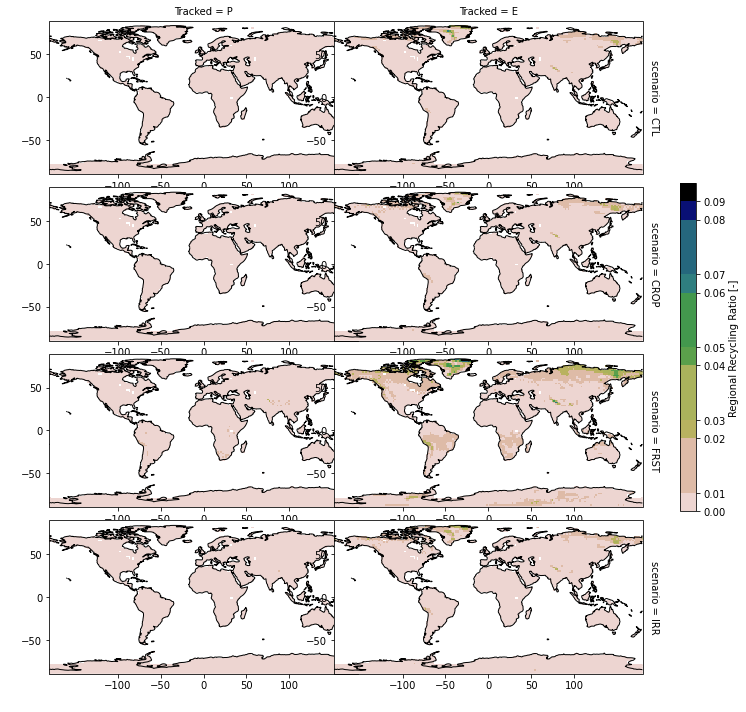

In [13]:
ratio_P=xr.concat([rho_r_CTL_mpi, rho_r_CROP_mpi,rho_r_FRST_mpi,rho_r_IRRIG_mpi], pd.Index(["CTL","CROP","FRST","IRR"], name = "scenario"))
ratio_E=xr.concat([eps_r_CTL_mpi, eps_r_CROP_mpi,eps_r_FRST_mpi,eps_r_IRRIG_mpi], pd.Index(["CTL","CROP","FRST","IRR"], name = "scenario"))
ratio_P_E = xr.concat([ratio_P,ratio_E], pd.Index(["P", "E"], name = "Tracked"))


#PLOT RECYCLING RATIOS
ratio_P_E.lon.attrs["long_name"] = "Long"
ratio_P_E.lat.attrs["long_name"] = "Lat"
ratio_P_E.lon.attrs["units"] = "degrees"
ratio_P_E.lat.attrs["units"] = "degrees"
Facet = ratio_P_E.plot(x="lon", y="lat",  col = "Tracked", row = "scenario",
                              aspect=2.0, 
                              size=2.4,
                              robust=True, cmap = 'gist_earth_r',
                              cbar_kwargs={"label": "Regional Recycling Ratio [-]",
                                           'shrink' : 0.5,
                                           #'location': 'bottom',
                                           }, 
                              transform=ccrs.PlateCarree(), subplot_kws={"projection": ccrs.PlateCarree(central_longitude=0.0, globe=None)},
                              levels = np.round(np.arange(0,0.1,0.005),decimals = 2)
                              ) 
                         
# Only works if cartopy is activated: transform=ccrs.PlateCarree(), subplot_kws={"projection": ccrs.PlateCarree(central_longitude=0.0, globe=None)},
for ax in Facet.axes.flat:
    ax.coastlines()
    ax.set_ylabel(' ')
    ax.set_xlabel(' ')
    ax.set_xticks([-100, -50, 0, 50, 100])
    ax.set_yticks([-50, 0, 50])
    
plt.savefig('recyc_reg_ratios.png')

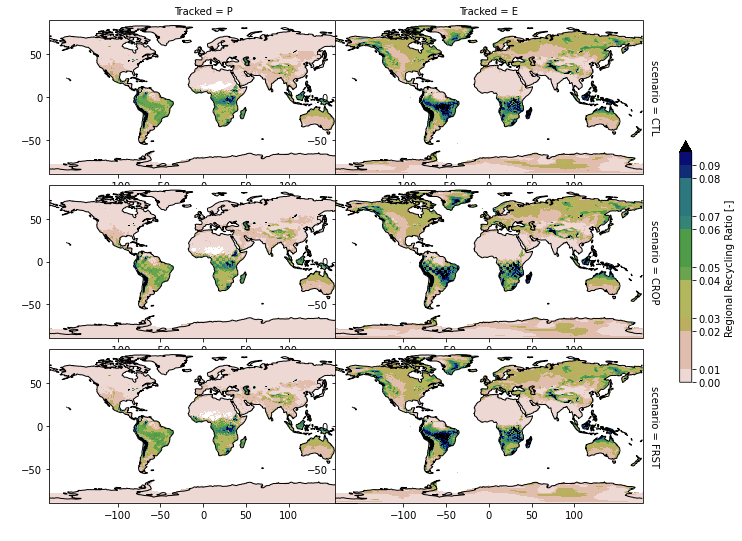

In [14]:
ratio_P=xr.concat([rho_r_CTL_ec, rho_r_CROP_ec,rho_r_FRST_ec], pd.Index(["CTL","CROP","FRST"], name = "scenario"))
ratio_E=xr.concat([eps_r_CTL_ec, eps_r_CROP_ec,eps_r_FRST_ec], pd.Index(["CTL","CROP","FRST"], name = "scenario"))
ratio_P_E = xr.concat([ratio_P,ratio_E], pd.Index(["P", "E"], name = "Tracked"))


#PLOT RECYCLING RATIOS
ratio_P_E.lon.attrs["long_name"] = "Long"
ratio_P_E.lat.attrs["long_name"] = "Lat"
ratio_P_E.lon.attrs["units"] = "degrees"
ratio_P_E.lat.attrs["units"] = "degrees"
Facet = ratio_P_E.plot(x="lon", y="lat",  col = "Tracked", row = "scenario",
                              aspect=2.0, 
                              size=2.4,
                              robust=True, cmap = 'gist_earth_r',
                              cbar_kwargs={"label": "Regional Recycling Ratio [-]",
                                           'shrink' : 0.5,
                                           #'location': 'bottom',
                                           }, 
                              transform=ccrs.PlateCarree(), subplot_kws={"projection": ccrs.PlateCarree(central_longitude=0.0, globe=None)},
                              levels = np.round(np.arange(0,0.1,0.005),decimals = 2)
                              ) 
                         
# Only works if cartopy is activated: transform=ccrs.PlateCarree(), subplot_kws={"projection": ccrs.PlateCarree(central_longitude=0.0, globe=None)},
for ax in Facet.axes.flat:
    ax.coastlines()
    ax.set_ylabel(' ')
    ax.set_xlabel(' ')
    ax.set_xticks([-100, -50, 0, 50, 100])
    ax.set_yticks([-50, 0, 50])
    
plt.savefig('recyc_reg_ratios.png')

In [12]:
ds_E_CTL_jja=xr.open_dataset(r'C:/Users/sdeherto/OneDrive - Vrije Universiteit Brussel/phd/LAMACLIMA/wam_data/cesm/ctl/LHFLX_JJAmean.nc')
ds_E_CTL=xr.open_dataset(r'C:/Users/sdeherto/OneDrive - Vrije Universiteit Brussel/phd/LAMACLIMA/wam_data/cesm/ctl/LHFLX_mean.nc')

jos_mean=ds_E_CTL['LHFLX']-E_CTL
E_CTL.plot(vmin=0,vmax=3*10**9)

NameError: name 'E_CTL' is not defined

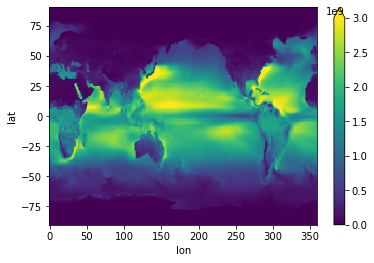

In [19]:
E_CTL_jja.plot(vmin=0,vmax=3*10**9)

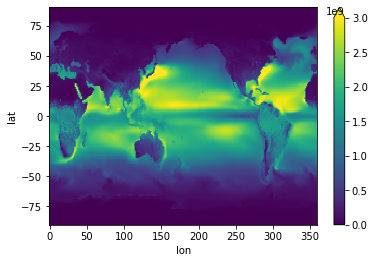

In [20]:
E_CTL_djf.plot(vmin=0,vmax=3*10**9)

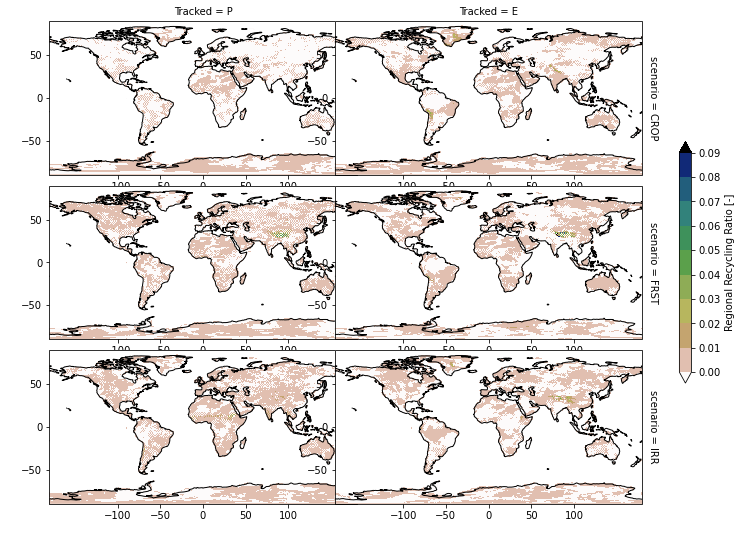

In [21]:
ratio_P_diff = xr.concat([rho_r_DEF, rho_r_AFF,rho_r_IRR], pd.Index(["CROP","FRST","IRR"], name = "scenario"))
ratio_E_diff = xr.concat([eps_r_DEF, eps_r_AFF,eps_r_IRR], pd.Index(["CROP","FRST","IRR"], name = "scenario"))
Dif_ratio_P_E = xr.concat([ratio_P_diff,ratio_E_diff], pd.Index(["P", "E"], name = "Tracked"))



#PLOT RECYCLING RATIOS
Dif_ratio_P_E.lon.attrs["long_name"] = "Long"
Dif_ratio_P_E.lat.attrs["long_name"] = "Lat"
Dif_ratio_P_E.lon.attrs["units"] = "degrees"
Dif_ratio_P_E.lat.attrs["units"] = "degrees"
Facet = Dif_ratio_P_E.plot(x="lon", y="lat",  col = "Tracked", row = "scenario",
                              aspect=2.0, 
                              size=2.4,
                              robust=True, cmap = 'gist_earth_r',
                              cbar_kwargs={"label": "Regional Recycling Ratio [-]",
                                           'shrink' : 0.5,
                                           #'location': 'bottom',
                                           }, 
                              transform=ccrs.PlateCarree(), subplot_kws={"projection": ccrs.PlateCarree(central_longitude=0.0, globe=None)},
                              levels = np.round(np.arange(0,0.1,0.01),decimals = 2)
                              ) 
                         
# Only works if cartopy is activated: transform=ccrs.PlateCarree(), subplot_kws={"projection": ccrs.PlateCarree(central_longitude=0.0, globe=None)},
for ax in Facet.axes.flat:
    ax.coastlines()
    ax.set_ylabel(' ')
    ax.set_xlabel(' ')
    ax.set_xticks([-100, -50, 0, 50, 100])
    ax.set_yticks([-50, 0, 50])
    
plt.savefig('recyc_reg_ratios_diff.png')


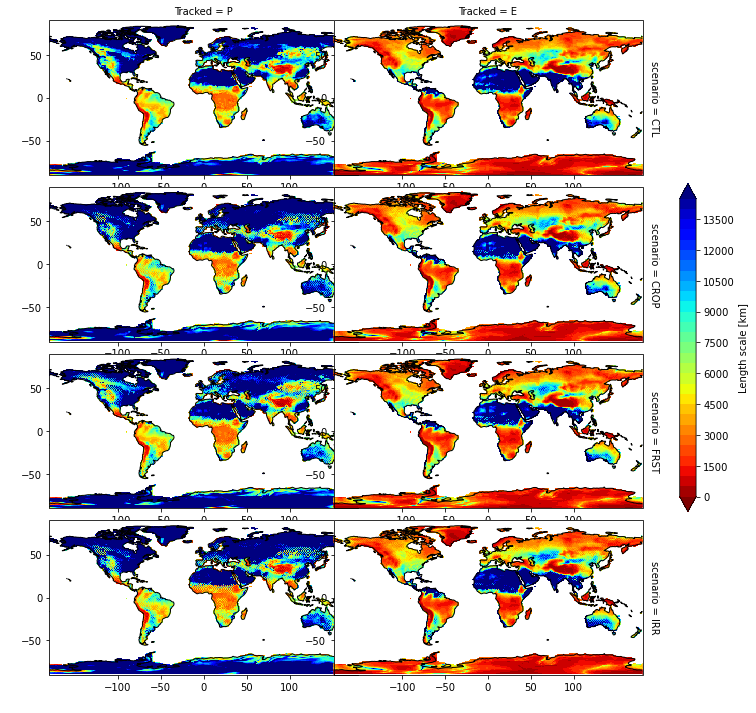

In [47]:
length_ratio_P=xr.concat([lambda_rho_CTL, lambda_rho_CROP,lambda_rho_FRST,lambda_rho_IRRIG], pd.Index(["CTL","CROP","FRST","IRR"], name = "scenario"))
length_ratio_E=xr.concat([lambda_eps_CTL, lambda_eps_CROP,lambda_eps_FRST,lambda_eps_IRRIG], pd.Index(["CTL","CROP","FRST","IRR"], name = "scenario"))
length_ratio_P_E = xr.concat([length_ratio_P,length_ratio_E], pd.Index(["P", "E"], name = "Tracked"))



#PLOT RECYCLING RATIOS
length_ratio_P_E.lon.attrs["long_name"] = "Long"
length_ratio_P_E.lat.attrs["long_name"] = "Lat"
length_ratio_P_E.lon.attrs["units"] = "degrees"
length_ratio_P_E.lat.attrs["units"] = "degrees"
Facet = length_ratio_P_E.plot(x="lon", y="lat",  col = "Tracked", row = "scenario",
                              aspect=2.0, 
                              size=2.4,
                              robust=True, cmap = 'jet_r',
                              cbar_kwargs={"label": "Length scale [km]",
                                           'shrink' : 0.5,
                                           #'location': 'bottom',
                                           }, 
                              transform=ccrs.PlateCarree(), subplot_kws={"projection": ccrs.PlateCarree(central_longitude=0.0, globe=None)},
                              levels = np.round(np.arange(0,15000,500),decimals = 2)
                              ) 
                         
# Only works if cartopy is activated: transform=ccrs.PlateCarree(), subplot_kws={"projection": ccrs.PlateCarree(central_longitude=0.0, globe=None)},
for ax in Facet.axes.flat:
    ax.coastlines()
    ax.set_ylabel(' ')
    ax.set_xlabel(' ')
    ax.set_xticks([-100, -50, 0, 50, 100])
    ax.set_yticks([-50, 0, 50])
    
plt.savefig('recyc_reg_ratios.png')
diff_P_CROP=lambda_rho_CROP-lambda_rho_CTL
diff_P_CROP=xr.where(lambda_rho_CTL<10000,diff_P_CROP,np.nan)  ##only look at areas with high recycling rates

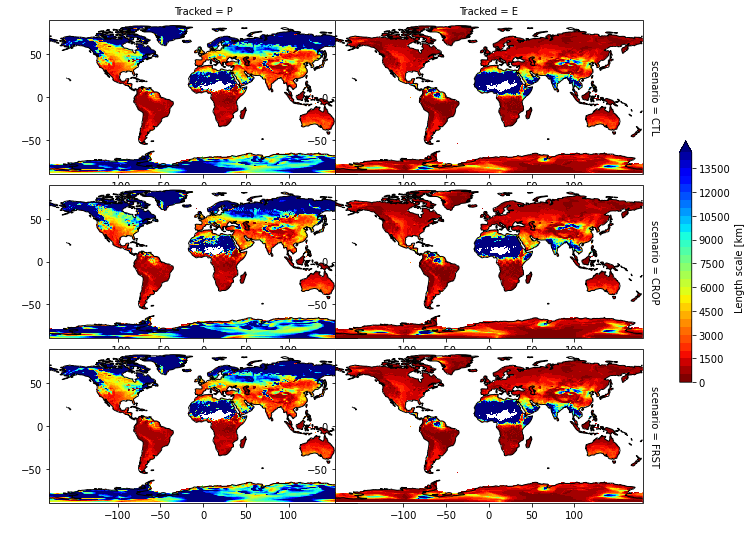

In [48]:
###mpiesm length scales
#lambda_rho_CTL_mpi=lambda_rho_CTL_mpi.reindex(lat=list(reversed(lambda_rho_CTL_mpi.lat)))
#lambda_eps_CTL_mpi=lambda_eps_CTL_mpi.reindex(lat=list(reversed(lambda_eps_CTL_mpi.lat)))
#lambda_rho_CROP_mpi=lambda_rho_CROP_mpi.reindex(lat=list(reversed(lambda_rho_CROP_mpi.lat)))
#lambda_eps_CROP_mpi=lambda_eps_CROP_mpi.reindex(lat=list(reversed(lambda_eps_CROP_mpi.lat)))
#lambda_rho_FRST_mpi=lambda_rho_FRST_mpi.reindex(lat=list(reversed(lambda_rho_FRST_mpi.lat)))
#lambda_eps_FRST_mpi=lambda_eps_FRST_mpi.reindex(lat=list(reversed(lambda_eps_FRST_mpi.lat)))

length_ratio_P=xr.concat([lambda_rho_CTL_ec, lambda_rho_CROP_ec,lambda_rho_FRST_ec], pd.Index(["CTL","CROP","FRST"], name = "scenario"))
length_ratio_E=xr.concat([lambda_eps_CTL_ec, lambda_eps_CROP_ec,lambda_eps_FRST_ec], pd.Index(["CTL","CROP","FRST"], name = "scenario"))
length_ratio_P_E = xr.concat([length_ratio_P,length_ratio_E], pd.Index(["P", "E"], name = "Tracked"))



#PLOT RECYCLING RATIOS
length_ratio_P_E.lon.attrs["long_name"] = "Long"
length_ratio_P_E.lat.attrs["long_name"] = "Lat"
length_ratio_P_E.lon.attrs["units"] = "degrees"
length_ratio_P_E.lat.attrs["units"] = "degrees"
Facet = length_ratio_P_E.plot(x="lon", y="lat",  col = "Tracked", row = "scenario",
                              aspect=2.0, 
                              size=2.4,
                              robust=True, cmap = 'jet_r',
                              cbar_kwargs={"label": "Length scale [km]",
                                           'shrink' : 0.5,
                                           #'location': 'bottom',
                                           }, 
                              transform=ccrs.PlateCarree(), subplot_kws={"projection": ccrs.PlateCarree(central_longitude=0.0, globe=None)},
                              levels = np.round(np.arange(0,15000,500),decimals = 2)
                              ) 
                         
# Only works if cartopy is activated: transform=ccrs.PlateCarree(), subplot_kws={"projection": ccrs.PlateCarree(central_longitude=0.0, globe=None)},
for ax in Facet.axes.flat:
    ax.coastlines()
    ax.set_ylabel(' ')
    ax.set_xlabel(' ')
    ax.set_xticks([-100, -50, 0, 50, 100])
    ax.set_yticks([-50, 0, 50])
    
plt.savefig('recyc_reg_ratios.png')
diff_P_CROP=lambda_rho_CROP-lambda_rho_CTL
diff_P_CROP=xr.where(lambda_rho_CTL<10000,diff_P_CROP,np.nan)  ##only look at areas with high recycling rates

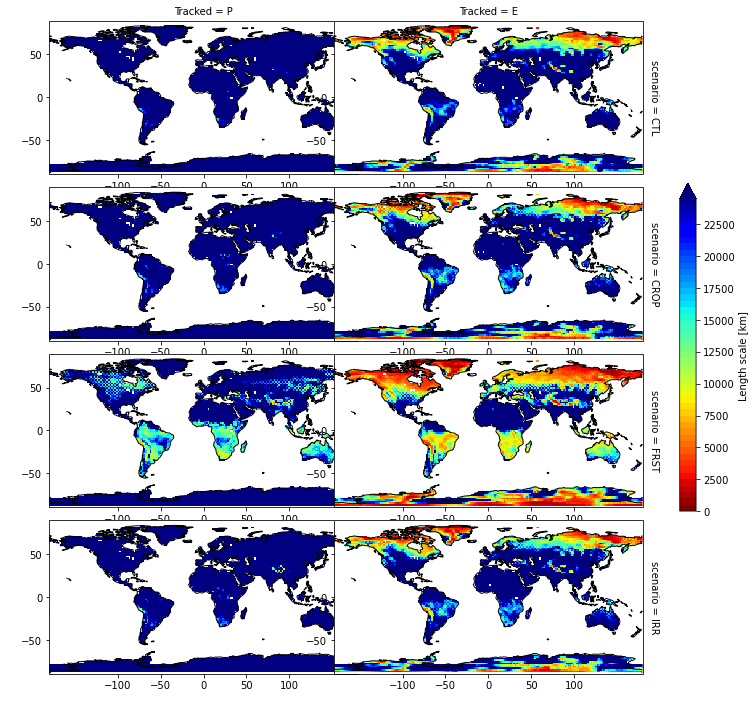

In [15]:
###mpiesm length scales
#lambda_rho_CTL_mpi=lambda_rho_CTL_mpi.reindex(lat=list(reversed(lambda_rho_CTL_mpi.lat)))
#lambda_eps_CTL_mpi=lambda_eps_CTL_mpi.reindex(lat=list(reversed(lambda_eps_CTL_mpi.lat)))
#lambda_rho_CROP_mpi=lambda_rho_CROP_mpi.reindex(lat=list(reversed(lambda_rho_CROP_mpi.lat)))
#lambda_eps_CROP_mpi=lambda_eps_CROP_mpi.reindex(lat=list(reversed(lambda_eps_CROP_mpi.lat)))
#lambda_rho_FRST_mpi=lambda_rho_FRST_mpi.reindex(lat=list(reversed(lambda_rho_FRST_mpi.lat)))
#lambda_eps_FRST_mpi=lambda_eps_FRST_mpi.reindex(lat=list(reversed(lambda_eps_FRST_mpi.lat)))

length_ratio_P=xr.concat([lambda_rho_CTL_mpi, lambda_rho_CROP_mpi,lambda_rho_FRST_mpi,lambda_rho_IRRIG_mpi], pd.Index(["CTL","CROP","FRST","IRR"], name = "scenario"))
length_ratio_E=xr.concat([lambda_eps_CTL_mpi, lambda_eps_CROP_mpi,lambda_eps_FRST_mpi,lambda_eps_IRRIG_mpi], pd.Index(["CTL","CROP","FRST","IRR"], name = "scenario"))
length_ratio_P_E = xr.concat([length_ratio_P,length_ratio_E], pd.Index(["P", "E"], name = "Tracked"))



#PLOT RECYCLING RATIOS
length_ratio_P_E.lon.attrs["long_name"] = "Long"
length_ratio_P_E.lat.attrs["long_name"] = "Lat"
length_ratio_P_E.lon.attrs["units"] = "degrees"
length_ratio_P_E.lat.attrs["units"] = "degrees"
Facet = length_ratio_P_E.plot(x="lon", y="lat",  col = "Tracked", row = "scenario",
                              aspect=2.0, 
                              size=2.4,
                              robust=True, cmap = 'jet_r',
                              cbar_kwargs={"label": "Length scale [km]",
                                           'shrink' : 0.5,
                                           #'location': 'bottom',
                                           }, 
                              transform=ccrs.PlateCarree(), subplot_kws={"projection": ccrs.PlateCarree(central_longitude=0.0, globe=None)},
                              levels = np.round(np.arange(0,25000,500),decimals = 2)
                              ) 
                         
# Only works if cartopy is activated: transform=ccrs.PlateCarree(), subplot_kws={"projection": ccrs.PlateCarree(central_longitude=0.0, globe=None)},
for ax in Facet.axes.flat:
    ax.coastlines()
    ax.set_ylabel(' ')
    ax.set_xlabel(' ')
    ax.set_xticks([-100, -50, 0, 50, 100])
    ax.set_yticks([-50, 0, 50])
    
plt.savefig('recyc_reg_ratios.png')
diff_P_CROP=lambda_rho_CROP-lambda_rho_CTL
diff_P_CROP=xr.where(lambda_rho_CTL<10000,diff_P_CROP,np.nan)  ##only look at areas with high recycling rates

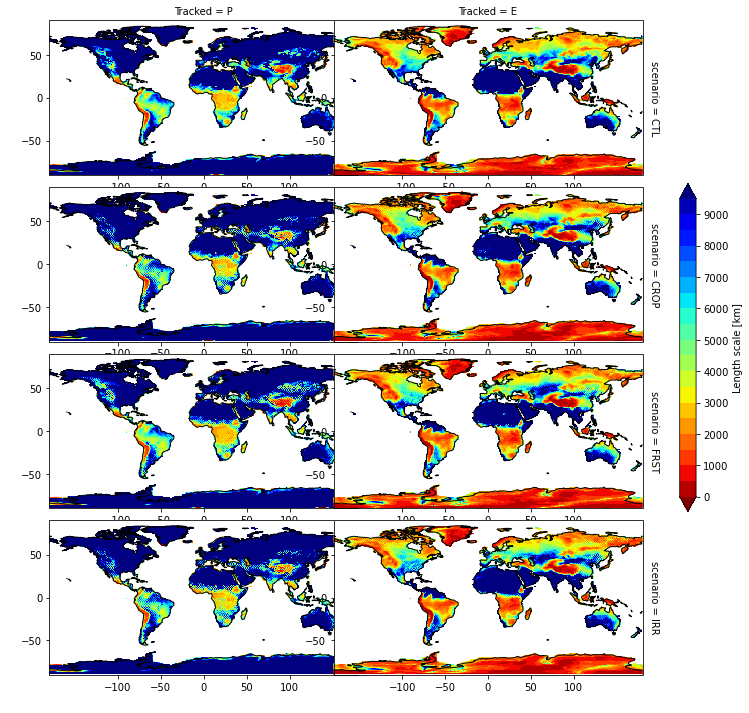

In [23]:
##summer length scales

length_ratio_P=xr.concat([lambda_rho_CTL_jja, lambda_rho_CROP_jja,lambda_rho_FRST_jja,lambda_rho_IRRIG_jja], pd.Index(["CTL","CROP","FRST","IRR"], name = "scenario"))
length_ratio_E=xr.concat([lambda_eps_CTL_jja, lambda_eps_CROP_jja,lambda_eps_FRST_jja,lambda_eps_IRRIG_jja], pd.Index(["CTL","CROP","FRST","IRR"], name = "scenario"))
length_ratio_P_E = xr.concat([length_ratio_P,length_ratio_E], pd.Index(["P", "E"], name = "Tracked"))



#PLOT RECYCLING RATIOS
length_ratio_P_E.lon.attrs["long_name"] = "Long"
length_ratio_P_E.lat.attrs["long_name"] = "Lat"
length_ratio_P_E.lon.attrs["units"] = "degrees"
length_ratio_P_E.lat.attrs["units"] = "degrees"
Facet = length_ratio_P_E.plot(x="lon", y="lat",  col = "Tracked", row = "scenario",
                              aspect=2.0, 
                              size=2.4,
                              robust=True, cmap = 'jet_r',
                              cbar_kwargs={"label": "Length scale [km]",
                                           'shrink' : 0.5,
                                           #'location': 'bottom',
                                           }, 
                              transform=ccrs.PlateCarree(), subplot_kws={"projection": ccrs.PlateCarree(central_longitude=0.0, globe=None)},
                              levels = np.round(np.arange(0,10000,500),decimals = 2)
                              ) 
                         
# Only works if cartopy is activated: transform=ccrs.PlateCarree(), subplot_kws={"projection": ccrs.PlateCarree(central_longitude=0.0, globe=None)},
for ax in Facet.axes.flat:
    ax.coastlines()
    ax.set_ylabel(' ')
    ax.set_xlabel(' ')
    ax.set_xticks([-100, -50, 0, 50, 100])
    ax.set_yticks([-50, 0, 50])
    
plt.savefig('recyc_reg_ratios_jja.png')


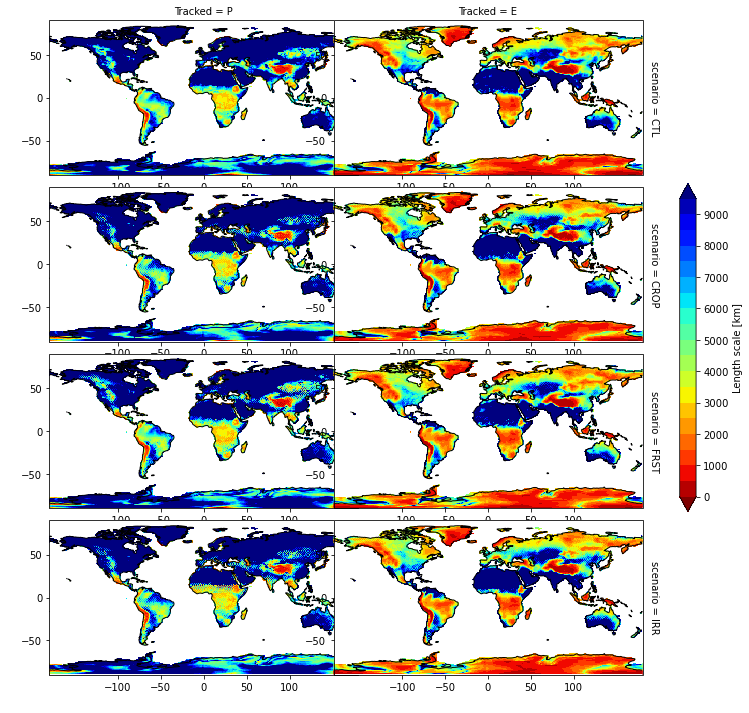

In [24]:
##winter length scales

length_ratio_P=xr.concat([lambda_rho_CTL_djf, lambda_rho_CROP_djf,lambda_rho_FRST_djf,lambda_rho_IRRIG_djf], pd.Index(["CTL","CROP","FRST","IRR"], name = "scenario"))
length_ratio_E=xr.concat([lambda_eps_CTL_djf, lambda_eps_CROP_djf,lambda_eps_FRST_djf,lambda_eps_IRRIG_djf], pd.Index(["CTL","CROP","FRST","IRR"], name = "scenario"))
length_ratio_P_E = xr.concat([length_ratio_P,length_ratio_E], pd.Index(["P", "E"], name = "Tracked"))



#PLOT RECYCLING RATIOS
length_ratio_P_E.lon.attrs["long_name"] = "Long"
length_ratio_P_E.lat.attrs["long_name"] = "Lat"
length_ratio_P_E.lon.attrs["units"] = "degrees"
length_ratio_P_E.lat.attrs["units"] = "degrees"
Facet = length_ratio_P_E.plot(x="lon", y="lat",  col = "Tracked", row = "scenario",
                              aspect=2.0, 
                              size=2.4,
                              robust=True, cmap = 'jet_r',
                              cbar_kwargs={"label": "Length scale [km]",
                                           'shrink' : 0.5,
                                           #'location': 'bottom',
                                           }, 
                              transform=ccrs.PlateCarree(), subplot_kws={"projection": ccrs.PlateCarree(central_longitude=0.0, globe=None)},
                              levels = np.round(np.arange(0,10000,500),decimals = 2)
                              ) 
                         
# Only works if cartopy is activated: transform=ccrs.PlateCarree(), subplot_kws={"projection": ccrs.PlateCarree(central_longitude=0.0, globe=None)},
for ax in Facet.axes.flat:
    ax.coastlines()
    ax.set_ylabel(' ')
    ax.set_xlabel(' ')
    ax.set_xticks([-100, -50, 0, 50, 100])
    ax.set_yticks([-50, 0, 50])
    
plt.savefig('recyc_reg_ratios_djf.png')


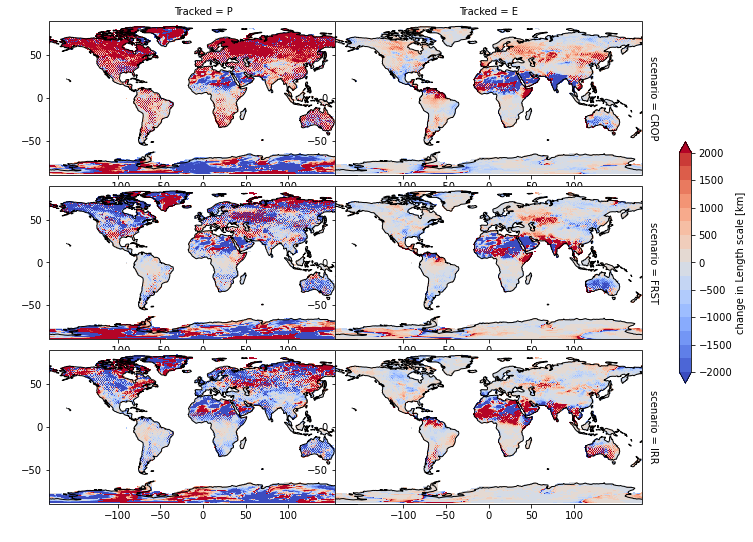

In [22]:

length_ratio_P=xr.concat([lambda_rho_DEF,lambda_rho_AFF,lambda_rho_IRR], pd.Index(["CROP","FRST","IRR"], name = "scenario"))
length_ratio_E=xr.concat([lambda_eps_DEF,lambda_eps_AFF,lambda_eps_IRR], pd.Index(["CROP","FRST","IRR"], name = "scenario"))
length_ratio_P_E = xr.concat([length_ratio_P,length_ratio_E], pd.Index(["P", "E"], name = "Tracked"))



#PLOT RECYCLING RATIOS
length_ratio_P_E.lon.attrs["long_name"] = "Long"
length_ratio_P_E.lat.attrs["long_name"] = "Lat"
length_ratio_P_E.lon.attrs["units"] = "degrees"
length_ratio_P_E.lat.attrs["units"] = "degrees"
Facet = length_ratio_P_E.plot(x="lon", y="lat",  col = "Tracked", row = "scenario",
                              aspect=2.0, 
                              size=2.4,
                              robust=True, cmap = 'coolwarm',
                              cbar_kwargs={"label": "change in Length scale [km]",
                                           'shrink' : 0.5,
                                           #'location': 'bottom',
                                           }, 
                              transform=ccrs.PlateCarree(), subplot_kws={"projection": ccrs.PlateCarree(central_longitude=0.0, globe=None)},
                              levels = np.round(np.arange(-2000,2250,250),decimals = 2)
                              ) 
                         
# Only works if cartopy is activated: transform=ccrs.PlateCarree(), subplot_kws={"projection": ccrs.PlateCarree(central_longitude=0.0, globe=None)},
for ax in Facet.axes.flat:
    ax.coastlines()
    ax.set_ylabel(' ')
    ax.set_xlabel(' ')
    ax.set_xticks([-100, -50, 0, 50, 100])
    ax.set_yticks([-50, 0, 50])
    
#plt.savefig('recyc_reg_ratios.png')


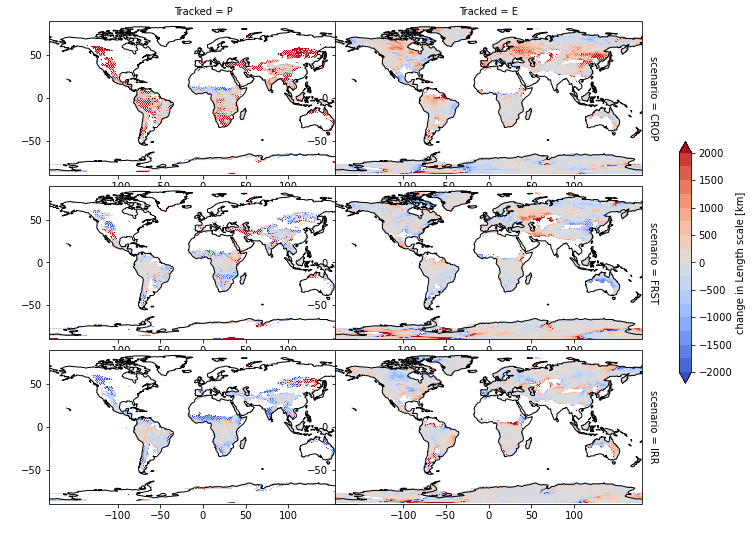

In [26]:
lambda_rho_AFF=xr.where(lambda_rho_CTL<10000,lambda_rho_AFF,np.nan)  ##only look at areas with high recycling rates
lambda_eps_AFF=xr.where(lambda_eps_CTL<10000,lambda_eps_AFF,np.nan)

lambda_rho_DEF=xr.where(lambda_rho_CTL<10000,lambda_rho_DEF,np.nan)  ##only look at areas with high recycling rates
lambda_eps_DEF=xr.where(lambda_eps_CTL<10000,lambda_eps_DEF,np.nan)

lambda_rho_IRR=xr.where(lambda_rho_CTL<10000,lambda_rho_IRR,np.nan)  ##only look at areas with high recycling rates
lambda_eps_IRR=xr.where(lambda_eps_CTL<10000,lambda_eps_IRR,np.nan)

length_ratio_P=xr.concat([lambda_rho_DEF,lambda_rho_AFF,lambda_rho_IRR], pd.Index(["CROP","FRST","IRR"], name = "scenario"))
length_ratio_E=xr.concat([lambda_eps_DEF,lambda_eps_AFF,lambda_eps_IRR], pd.Index(["CROP","FRST","IRR"], name = "scenario"))
length_ratio_P_E = xr.concat([length_ratio_P,length_ratio_E], pd.Index(["P", "E"], name = "Tracked"))



#PLOT RECYCLING RATIOS
length_ratio_P_E.lon.attrs["long_name"] = "Long"
length_ratio_P_E.lat.attrs["long_name"] = "Lat"
length_ratio_P_E.lon.attrs["units"] = "degrees"
length_ratio_P_E.lat.attrs["units"] = "degrees"
Facet = length_ratio_P_E.plot(x="lon", y="lat",  col = "Tracked", row = "scenario",
                              aspect=2.0, 
                              size=2.4,
                              robust=True, cmap = 'coolwarm',
                              cbar_kwargs={"label": "change in Length scale [km]",
                                           'shrink' : 0.5,
                                           #'location': 'bottom',
                                           }, 
                              transform=ccrs.PlateCarree(), subplot_kws={"projection": ccrs.PlateCarree(central_longitude=0.0, globe=None)},
                              levels = np.round(np.arange(-2000,2250,250),decimals = 2)
                              ) 
                         
# Only works if cartopy is activated: transform=ccrs.PlateCarree(), subplot_kws={"projection": ccrs.PlateCarree(central_longitude=0.0, globe=None)},
for ax in Facet.axes.flat:
    ax.coastlines()
    ax.set_ylabel(' ')
    ax.set_xlabel(' ')
    ax.set_xticks([-100, -50, 0, 50, 100])
    ax.set_yticks([-50, 0, 50])
    
#plt.savefig('recyc_reg_ratios.png')


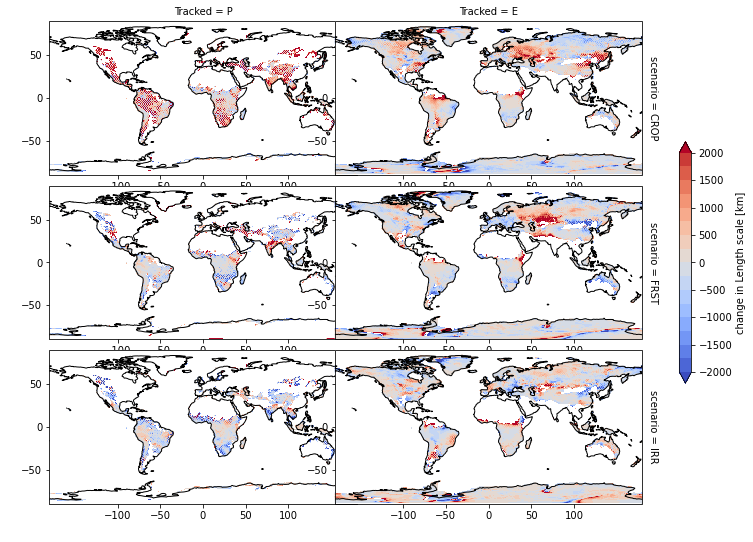

In [27]:
lambda_rho_AFF_jja=xr.where(lambda_rho_CTL_jja<10000,lambda_rho_AFF_jja,np.nan)  ##only look at areas with high recycling rates
lambda_eps_AFF_jja=xr.where(lambda_eps_CTL_jja<10000,lambda_eps_AFF_jja,np.nan)

lambda_rho_DEF_jja=xr.where(lambda_rho_CTL_jja<10000,lambda_rho_DEF_jja,np.nan)  ##only look at areas with high recycling rates
lambda_eps_DEF_jja=xr.where(lambda_eps_CTL_jja<10000,lambda_eps_DEF_jja,np.nan)

lambda_rho_IRR_jja=xr.where(lambda_rho_CTL_jja<10000,lambda_rho_IRR_jja,np.nan)  ##only look at areas with high recycling rates
lambda_eps_IRR_jja=xr.where(lambda_eps_CTL_jja<10000,lambda_eps_IRR_jja,np.nan)

length_ratio_P=xr.concat([lambda_rho_DEF_jja,lambda_rho_AFF_jja,lambda_rho_IRR_jja], pd.Index(["CROP","FRST","IRR"], name = "scenario"))
length_ratio_E=xr.concat([lambda_eps_DEF_jja,lambda_eps_AFF_jja,lambda_eps_IRR_jja], pd.Index(["CROP","FRST","IRR"], name = "scenario"))
length_ratio_P_E = xr.concat([length_ratio_P,length_ratio_E], pd.Index(["P", "E"], name = "Tracked"))



#PLOT RECYCLING RATIOS
length_ratio_P_E.lon.attrs["long_name"] = "Long"
length_ratio_P_E.lat.attrs["long_name"] = "Lat"
length_ratio_P_E.lon.attrs["units"] = "degrees"
length_ratio_P_E.lat.attrs["units"] = "degrees"
Facet = length_ratio_P_E.plot(x="lon", y="lat",  col = "Tracked", row = "scenario",
                              aspect=2.0, 
                              size=2.4,
                              robust=True, cmap = 'coolwarm',
                              cbar_kwargs={"label": "change in Length scale [km]",
                                           'shrink' : 0.5,
                                           #'location': 'bottom',
                                           }, 
                              transform=ccrs.PlateCarree(), subplot_kws={"projection": ccrs.PlateCarree(central_longitude=0.0, globe=None)},
                              levels = np.round(np.arange(-2000,2250,250),decimals = 2)
                              ) 
                         
# Only works if cartopy is activated: transform=ccrs.PlateCarree(), subplot_kws={"projection": ccrs.PlateCarree(central_longitude=0.0, globe=None)},
for ax in Facet.axes.flat:
    ax.coastlines()
    ax.set_ylabel(' ')
    ax.set_xlabel(' ')
    ax.set_xticks([-100, -50, 0, 50, 100])
    ax.set_yticks([-50, 0, 50])
    
#plt.savefig('recyc_reg_ratios.png')


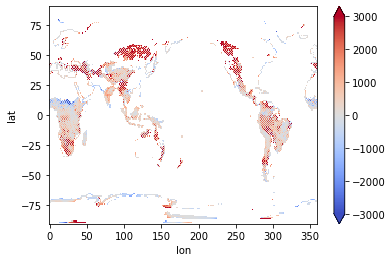

In [28]:

diff_P_CROP.plot(vmin=-3000,vmax=3000,cmap='coolwarm')


In [29]:

diff_E_CROP.plot(vmin=-3000,vmax=3000,cmap='coolwarm')

NameError: name 'diff_E_CROP' is not defined

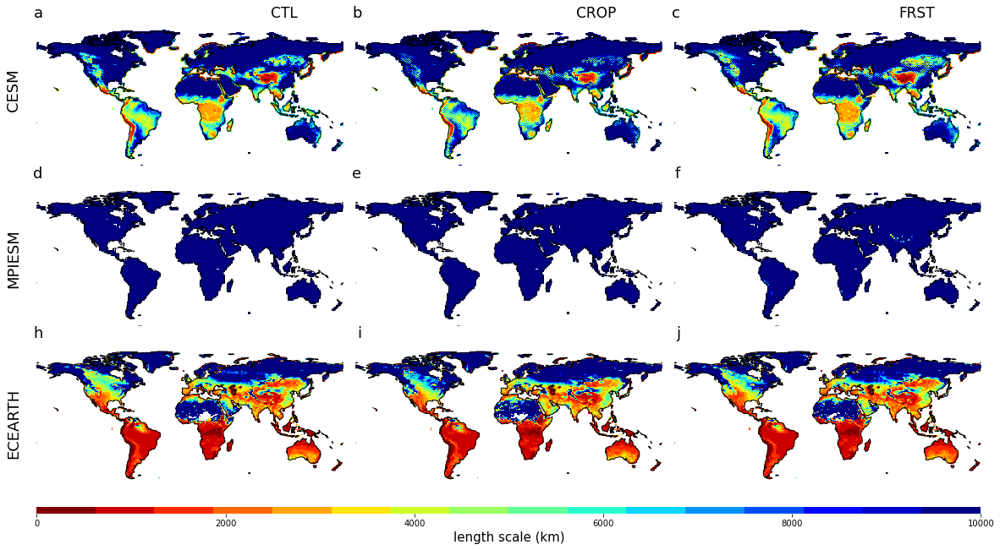

In [16]:


#matplotlib.rc('xtick', labelsize=20) 
#matplotlib.rc('ytick', labelsize=20) 
plt.rcParams['figure.figsize'] = [20, 10]

mpl.rc('axes',edgecolor='none')
k=0
fig = plt.figure()
gs = fig.add_gridspec(3,3,width_ratios=[3,3,3])
cmap='jet_r'
for model in ['cesm','mpiesm','ecearth']:
    i=0
    k=k+1
    if model=='cesm':
        da_list=[lambda_rho_CTL,lambda_rho_CROP,lambda_rho_FRST]
        pan_list=['a','b','c']
    elif model =='ecearth':
        da_list=[lambda_rho_CTL_ec,lambda_rho_CROP_ec,lambda_rho_FRST_ec]
        pan_list=['h','i','j']
    elif model =='mpiesm':
        da_list=[lambda_rho_CTL_mpi,lambda_rho_CROP_mpi,lambda_rho_FRST_mpi]
        pan_list=['d','e','f']
    for da in da_list:
        if i==0:
            change='CTL'
        elif i==1:
            change='CROP'
        elif i==2:
            change='FRST'
        i=i+1
        #plot_lims = [da.min(), da.max()]
        plot_lims = [0,10000]
        # define colorbar levels
        ax = fig.add_subplot(gs[k-1,i-1], projection=ccrs.PlateCarree())
        levels = np.arange(plot_lims[0], plot_lims[1]+30, 30)
        #levels=[-2, -1.75, -1.5, -1.25,-1,-0.75, -0.5,-0.25, 0,0.25, 0.5,0.75, 1,1.25, 1.5,1.75, 2]
        # define colormap (more info on colormaps: https://matplotlib.org/users/colormaps.html)

          #cmap, norm = mpu.from_levels_and_cmap(levels, 'RdBu_r', extend='both')
        cbar_label = 'km'

           # add the coastlines to the plot

        ax.coastlines()
        # plot data array as a map, with the previously defined argumnets
        h=da.plot(ax=ax, cmap=plt.cm.get_cmap(cmap, 16), vmin=plot_lims[0], vmax=plot_lims[1], add_colorbar=False,label=model)
        ax.set_aspect('auto')
        # set the extent of the cartopy geoAxes to \"global\"
          #ax.set_global()

          # or alternatively, if you want to plot a certain region, use (example: Europe)
        ax.set_extent([-180, 180, -63, 89], ccrs.PlateCarree())
        if i==1:
            ax_2=ax
            ax.text(-0.1,0.7,model.upper(),rotation='vertical', transform=ax.transAxes,fontsize=18, va='top', ha='left') 
        ax.set_title('')
        if model=='cesm':
            ax.text(0.02, 1.15, pan_list[i-1], transform=ax.transAxes,fontsize=18, va='top', ha='right')
            ax_old=ax
            if k==1:
                ax.text(0.85, 1.15, change, transform=ax.transAxes,fontsize=17, va='top', ha='right')
        elif model=='mpiesm':
            ax.text(0.02, 1.15, pan_list[i-1], transform=ax.transAxes,fontsize=18, va='top', ha='right')
        elif model=='ecearth':
            ax.text(0.02, 1.15, pan_list[i-1], transform=ax.transAxes,fontsize=18, va='top', ha='right')

cbar = mpu.colorbar(h, ax1=ax_old,ax2=ax_2, shift=0., size=0.05, orientation='horizontal')
cbar.set_label(label='precipitation length scale ('+cbar_label+')', size=15)
#cbar.ax.tick_params(labelsize=13) 
fig.subplots_adjust(hspace=0.15, wspace=0.04)


In [ ]:


#matplotlib.rc('xtick', labelsize=20) 
#matplotlib.rc('ytick', labelsize=20) 
plt.rcParams['figure.figsize'] = [20, 10]

mpl.rc('axes',edgecolor='none')
k=0
fig = plt.figure()
gs = fig.add_gridspec(3,3,width_ratios=[3,3,3])
cmap='jet_r'
for model in ['cesm','mpiesm','ecearth']:
    i=0
    k=k+1
    if model=='cesm':
        da_list=[lambda_eps_CTL,lambda_eps_CROP,lambda_eps_FRST]
        pan_list=['a','b','c']
    elif model =='ecearth':
        da_list=[lambda_eps_CTL_ec,lambda_eps_CROP_ec,lambda_eps_FRST_ec]
        pan_list=['h','i','j']
    elif model =='mpiesm':
        da_list=[lambda_eps_CTL_mpi,lambda_eps_CROP_mpi,lambda_eps_FRST_mpi]
        pan_list=['d','e','f']
    for da in da_list:
        if i==0:
            change='CTL'
        elif i==1:
            change='CROP'
        elif i==2:
            change='FRST'
        i=i+1
        #plot_lims = [da.min(), da.max()]
        plot_lims = [0,10000]
        # define colorbar levels
        ax = fig.add_subplot(gs[k-1,i-1], projection=ccrs.PlateCarree())
        levels = np.arange(plot_lims[0], plot_lims[1]+30, 30)
        #levels=[-2, -1.75, -1.5, -1.25,-1,-0.75, -0.5,-0.25, 0,0.25, 0.5,0.75, 1,1.25, 1.5,1.75, 2]
        # define colormap (more info on colormaps: https://matplotlib.org/users/colormaps.html)

          #cmap, norm = mpu.from_levels_and_cmap(levels, 'RdBu_r', extend='both')
        cbar_label = 'km'

           # add the coastlines to the plot

        ax.coastlines()
        # plot data array as a map, with the previously defined argumnets
        h=da.plot(ax=ax, cmap=plt.cm.get_cmap(cmap, 16), vmin=plot_lims[0], vmax=plot_lims[1], add_colorbar=False,label=model)
        ax.set_aspect('auto')
        # set the extent of the cartopy geoAxes to \"global\"
          #ax.set_global()

          # or alternatively, if you want to plot a certain region, use (example: Europe)
        ax.set_extent([-180, 180, -63, 89], ccrs.PlateCarree())
        if i==1:
            ax_2=ax
            ax.text(-0.1,0.7,model.upper(),rotation='vertical', transform=ax.transAxes,fontsize=18, va='top', ha='left') 
        ax.set_title('')
        if model=='cesm':
            ax.text(0.02, 1.15, pan_list[i-1], transform=ax.transAxes,fontsize=18, va='top', ha='right')
            ax_old=ax
            if k==1:
                ax.text(0.85, 1.15, change, transform=ax.transAxes,fontsize=17, va='top', ha='right')
        elif model=='mpiesm':
            ax.text(0.02, 1.15, pan_list[i-1], transform=ax.transAxes,fontsize=18, va='top', ha='right')
        elif model=='ecearth':
            ax.text(0.02, 1.15, pan_list[i-1], transform=ax.transAxes,fontsize=18, va='top', ha='right')

cbar = mpu.colorbar(h, ax1=ax_old,ax2=ax_2, shift=0., size=0.05, orientation='horizontal')
cbar.set_label(label='evaporation length scale ('+cbar_label+')', size=15)
#cbar.ax.tick_params(labelsize=13) 
fig.subplots_adjust(hspace=0.15, wspace=0.04)
